# Flood Detection from SAR — Complete Pipeline
## Sen1Floods11 Subset | Preprocessing + Model 1 + Model 2

**Sections:**
1. Setup & Data Loading
2. Exploratory Data Analysis (EDA)
3. Physics Channel EDA (NEW — Cell 9b)
4. Dataset & DataLoader (with all fixes)
5. Model 1: ResNet-34 U-Net baseline (2-channel)
6. Model 2: ResNet-34 U-Net + Physics Channels (5-channel ablation)
7. Results Comparison

In [1]:
# ============================================================
# CELL 1 — Mount Google Drive
# ============================================================
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# ============================================================
# CELL 2 — Unzip dataset
# ============================================================
!unzip -q "/content/drive/MyDrive/Flood_project/Sen1_subset.zip" -d /content/
print("Dataset extracted.")

Dataset extracted.


In [3]:
# ============================================================
# CELL 3 — Verify folder structure
# ============================================================
import os

ROOT = "/content/Sen1Floods11_subset"

print("Top-level folders:", os.listdir(ROOT))

for split in ["train", "val", "test"]:
    s1_count    = len([f for f in os.listdir(os.path.join(ROOT, split, "S1"))    if f.endswith(".tif")])
    label_count = len([f for f in os.listdir(os.path.join(ROOT, split, "Label")) if f.endswith(".tif")])
    print(f"{split}/S1     : {s1_count} files")
    print(f"{split}/Label  : {label_count} files")

Top-level folders: ['test', 'train', 'metadata', 'val']
train/S1     : 285 files
train/Label  : 285 files
val/S1     : 72 files
val/Label  : 72 files
test/S1     : 89 files
test/Label  : 89 files


In [4]:
# ============================================================
# CELL 4 — Install & verify libraries
# ============================================================
!pip install -q rasterio segmentation-models-pytorch
!pip install -q torch torchvision

import rasterio
import torch
import numpy as np
import matplotlib
print("rasterio  :", rasterio.__version__)
print("torch     :", torch.__version__)
print("numpy     :", np.__version__)
print("GPU available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU name  :", torch.cuda.get_device_name(0))
    print(f"GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
print("All libraries loaded ✅")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 11.3 MB/s eta 0:00:00
rasterio  : 1.5.0
torch     : 2.10.0+cu128
numpy     : 2.0.2
GPU available: True
GPU name  : Tesla T4
GPU memory: 15.6 GB
All libraries loaded ✅


---
## Section 2 — Exploratory Data Analysis

In [5]:
# ============================================================
# CELL 5 — Inspect one raw SAR file
# ============================================================
import rasterio
import numpy as np

ROOT = "/content/Sen1Floods11_subset"

s1_path    = os.path.join(ROOT, "train", "S1",    "Ghana_1033830_S1Hand.tif")
label_path = os.path.join(ROOT, "train", "Label", "Ghana_1033830_LabelHand.tif")

with rasterio.open(s1_path) as src:
    raw = src.read().astype(np.float32)
    crs = src.crs
    profile = src.profile

with rasterio.open(label_path) as src:
    mask_raw = src.read(1).astype(np.float32)

print("Raw image shape :", raw.shape)
print("Raw VV min/max  :", raw[0].min(), "/", raw[0].max())
print("Raw VH min/max  :", raw[1].min(), "/", raw[1].max())
print("NaN count VV    :", np.isnan(raw[0]).sum())
print("NaN count VH    :", np.isnan(raw[1]).sum())
print("dtype           :", raw.dtype)
print("CRS             :", crs)
print("Unique mask vals:", np.unique(mask_raw))

Raw image shape : (2, 512, 512)
Raw VV min/max  : -36.258503 / -1.3692393
Raw VH min/max  : -47.463974 / -7.6600246
NaN count VV    : 0
NaN count VH    : 0
dtype           : float32
CRS             : EPSG:4326
Unique mask vals: [-1.  0.  1.]


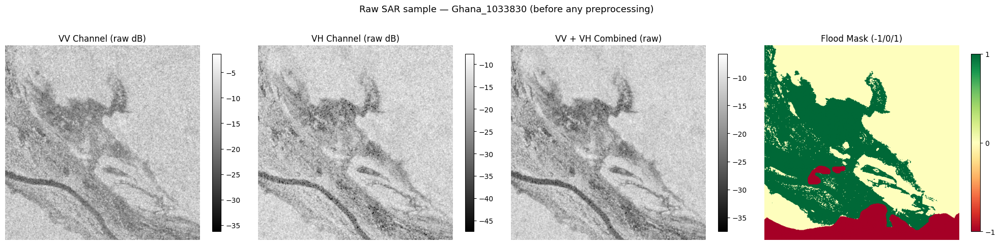

Figure saved to /content/fig_raw_sample.png


In [6]:
# ============================================================
# CELL 6 — Visualise one raw sample (before preprocessing)
# ============================================================
import matplotlib.pyplot as plt

vv   = raw[0]
vh   = raw[1]
mask = mask_raw

plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.title("VV Channel (raw dB)", fontsize=12)
plt.imshow(vv, cmap='gray')
plt.colorbar(shrink=0.8)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title("VH Channel (raw dB)", fontsize=12)
plt.imshow(vh, cmap='gray')
plt.colorbar(shrink=0.8)
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title("VV + VH Combined (raw)", fontsize=12)
plt.imshow((vv + vh) / 2, cmap='gray')
plt.colorbar(shrink=0.8)
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title("Flood Mask (-1/0/1)", fontsize=12)
plt.imshow(mask, cmap='RdYlGn', vmin=-1, vmax=1)
plt.colorbar(shrink=0.8, ticks=[-1, 0, 1])
plt.axis('off')

plt.suptitle("Raw SAR sample — Ghana_1033830 (before any preprocessing)", y=1.01, fontsize=13)
plt.tight_layout()
plt.savefig('/content/fig_raw_sample.png', dpi=120, bbox_inches='tight')
plt.show()
print("Figure saved to /content/fig_raw_sample.png")

In [7]:
# ============================================================
# CELL 7 — Whole-dataset region-level analysis
# ============================================================
from collections import defaultdict
from tqdm import tqdm

train_s1_dir    = os.path.join(ROOT, "train", "S1")
train_label_dir = os.path.join(ROOT, "train", "Label")
train_files     = sorted([f for f in os.listdir(train_s1_dir) if f.endswith(".tif")])

def get_region(filename):
    return filename.split("_")[0]

def analyse_split(split):
    label_dir = os.path.join(ROOT, split, "Label")
    s1_dir    = os.path.join(ROOT, split, "S1")
    files     = sorted([f for f in os.listdir(s1_dir) if f.endswith(".tif")])
    stats     = defaultdict(lambda: {"flood": 0, "nonflood": 0, "ignore": 0, "count": 0})
    for fname in tqdm(files, desc=split):
        region     = get_region(fname)
        lpath      = os.path.join(label_dir, fname.replace("S1Hand", "LabelHand"))
        with rasterio.open(lpath) as src:
            mask = src.read(1).astype(np.float32)
        stats[region]["flood"]    += (mask == 1).sum()
        stats[region]["nonflood"] += (mask == 0).sum()
        stats[region]["ignore"]   += (mask == -1).sum()
        stats[region]["count"]    += 1
    return stats

print("=" * 60)
print("WHOLE-DATASET REGION-LEVEL ANALYSIS")
print("=" * 60)

all_stats = {}
for split in ["train", "val", "test"]:
    all_stats[split] = analyse_split(split)
    print(f"\n── {split.upper()} ──")
    print(f"{'Region':<12} {'Images':>7} {'Flood%':>8} {'Flood px':>12} {'Ignore%':>8}")
    print("-" * 55)
    for region, s in sorted(all_stats[split].items()):
        valid     = s["flood"] + s["nonflood"]
        fp        = 100 * s["flood"] / valid if valid > 0 else 0
        ip        = 100 * s["ignore"] / (valid + s["ignore"]) if (valid + s["ignore"]) > 0 else 0
        print(f"{region:<12} {s['count']:>7} {fp:>7.2f}% {s['flood']:>12,} {ip:>7.2f}%")

print("\n⚠️  KEY INSIGHT: Test regions (Mekong ~24%, Nigeria ~23%) have MUCH higher")
print("   flood% than train mean (~7.89%) — domain shift — model must learn SAR physics.")

WHOLE-DATASET REGION-LEVEL ANALYSIS


train: 100%|██████████| 285/285 [00:00<00:00, 387.82it/s]



── TRAIN ──
Region        Images   Flood%     Flood px  Ignore%
-------------------------------------------------------
Ghana             53    6.28%      577,708   33.83%
India             68   12.39%    1,855,692   15.97%
Pakistan          28    7.50%      403,107   26.75%
Paraguay          67    8.39%    1,399,139    5.04%
USA               69    4.56%      804,800    2.44%


val: 100%|██████████| 72/72 [00:00<00:00, 531.75it/s]



── VAL ──
Region        Images   Flood%     Flood px  Ignore%
-------------------------------------------------------
Spain             30   13.15%    1,016,500    1.74%
Sri-Lanka         42   11.80%    1,175,411    9.51%


test: 100%|██████████| 89/89 [00:00<00:00, 529.89it/s]


── TEST ──
Region        Images   Flood%     Flood px  Ignore%
-------------------------------------------------------
Bolivia           15   15.86%      454,864   27.07%
Mekong            30   24.12%    1,720,184    9.32%
Nigeria           18   23.46%      948,331   14.31%
Somalia           26    6.51%      349,869   21.13%

⚠️  KEY INSIGHT: Test regions (Mekong ~24%, Nigeria ~23%) have MUCH higher
   flood% than train mean (~7.89%) — domain shift — model must learn SAR physics.


flood% per image: 100%|██████████| 285/285 [00:00<00:00, 599.13it/s]


Images with 0 flood pixels  : 45 / 285
Images with <1% flood       : 109 / 285
Images with <5% flood       : 188 / 285
Mean flood %                : 8.33%
Median flood %              : 1.92%
Max flood %                 : 100.00%


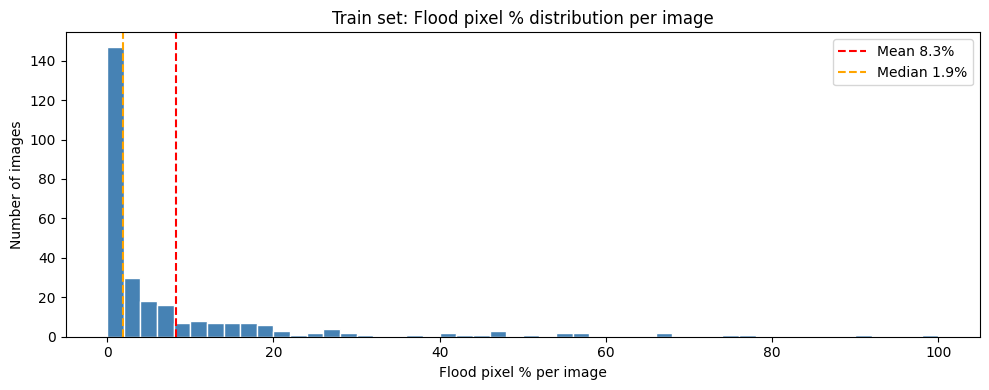

In [8]:
# ============================================================
# CELL 8 — Per-image flood pixel distribution (train set)
# ============================================================
per_image_flood_pct = []
zero_flood_images   = []

for fname in tqdm(train_files, desc="flood% per image"):
    label_path = os.path.join(train_label_dir, fname.replace("S1Hand", "LabelHand"))
    with rasterio.open(label_path) as src:
        mask = src.read(1).astype(np.float32)
    flood    = (mask == 1).sum()
    nonflood = (mask == 0).sum()
    valid    = flood + nonflood
    pct      = 100 * flood / valid if valid > 0 else 0
    per_image_flood_pct.append(pct)
    if flood == 0:
        zero_flood_images.append(fname)

per_image_flood_pct = np.array(per_image_flood_pct)

print(f"Images with 0 flood pixels  : {len(zero_flood_images)} / {len(train_files)}")
print(f"Images with <1% flood       : {(per_image_flood_pct < 1).sum()} / {len(train_files)}")
print(f"Images with <5% flood       : {(per_image_flood_pct < 5).sum()} / {len(train_files)}")
print(f"Mean flood %                : {per_image_flood_pct.mean():.2f}%")
print(f"Median flood %              : {np.median(per_image_flood_pct):.2f}%")
print(f"Max flood %                 : {per_image_flood_pct.max():.2f}%")

plt.figure(figsize=(10, 4))
plt.hist(per_image_flood_pct, bins=50, color='steelblue', edgecolor='white')
plt.axvline(per_image_flood_pct.mean(),      color='red',    linestyle='--',
            label=f'Mean {per_image_flood_pct.mean():.1f}%')
plt.axvline(np.median(per_image_flood_pct),  color='orange', linestyle='--',
            label=f'Median {np.median(per_image_flood_pct):.1f}%')
plt.xlabel("Flood pixel % per image")
plt.ylabel("Number of images")
plt.title("Train set: Flood pixel % distribution per image")
plt.legend()
plt.tight_layout()
plt.savefig('/content/fig_flood_dist.png', dpi=120, bbox_inches='tight')
plt.show()

SAR stats: 100%|██████████| 72/72 [00:01<00:00, 67.18it/s]



VV channel (dB):
  Min / Max  : -66.43 / 21.43
  Mean / Std : -10.73 / 4.82
  p1 / p99   : -25.00 / -1.26
  p5 / p95   : -24.21 / -4.93

VH channel (dB):
  Min / Max  : -79.16 / 13.44
  Mean / Std : -17.48 / 5.13
  p1 / p99   : -32.00 / -8.49
  p5 / p95   : -32.00 / -11.55

VV-VH ratio (dB):
  Min / Max  : -21.55 / 41.78
  Mean / Std : 6.75 / 3.22
  p1 / p99   : -0.32 / 15.62
  p5 / p95   : 1.81 / 12.10

── Chosen clip ranges ──
VV: [-25.0, 5.0]  |  low clip: 0.39%  high clip: 0.06%
VH: [-32.0, -5.0]  |  low clip: 0.70%  high clip: 0.22%


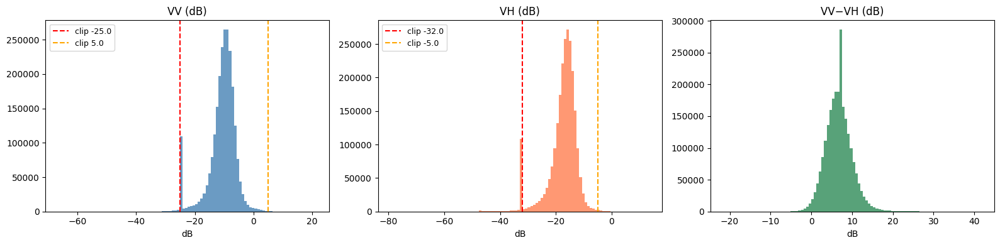

In [9]:
# ============================================================
# CELL 9 — Global SAR statistics + clip range validation (VV & VH)
# ============================================================
vv_all    = []
vh_all    = []
ratio_all = []

for fname in tqdm(train_files[::4], desc="SAR stats"):
    s1_path = os.path.join(train_s1_dir, fname)
    with rasterio.open(s1_path) as src:
        img = src.read().astype(np.float32)
    vv    = np.nan_to_num(img[0], nan=-25.0)
    vh    = np.nan_to_num(img[1], nan=-32.0)
    ratio = vv - vh
    vv_all.extend(vv.flatten()[::8].tolist())
    vh_all.extend(vh.flatten()[::8].tolist())
    ratio_all.extend(ratio.flatten()[::8].tolist())

vv_all    = np.array(vv_all)
vh_all    = np.array(vh_all)
ratio_all = np.array(ratio_all)

def print_stats(name, arr):
    print(f"\n{name}:")
    print(f"  Min / Max  : {arr.min():.2f} / {arr.max():.2f}")
    print(f"  Mean / Std : {arr.mean():.2f} / {arr.std():.2f}")
    print(f"  p1 / p99   : {np.percentile(arr,1):.2f} / {np.percentile(arr,99):.2f}")
    print(f"  p5 / p95   : {np.percentile(arr,5):.2f} / {np.percentile(arr,95):.2f}")

# Chosen clip ranges (data-driven)
VV_MIN, VV_MAX = -25.0,  5.0
VH_MIN, VH_MAX = -32.0, -5.0

print_stats("VV channel (dB)", vv_all)
print_stats("VH channel (dB)", vh_all)
print_stats("VV-VH ratio (dB)", ratio_all)

print(f"\n── Chosen clip ranges ──")
print(f"VV: [{VV_MIN}, {VV_MAX}]  |  low clip: {100*(vv_all < VV_MIN).mean():.2f}%  high clip: {100*(vv_all > VV_MAX).mean():.2f}%")
print(f"VH: [{VH_MIN}, {VH_MAX}]  |  low clip: {100*(vh_all < VH_MIN).mean():.2f}%  high clip: {100*(vh_all > VH_MAX).mean():.2f}%")

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, data, clip_lo, clip_hi, color, label in [
        (axes[0], vv_all,    VV_MIN, VV_MAX, 'steelblue', 'VV (dB)'),
        (axes[1], vh_all,    VH_MIN, VH_MAX, 'coral',     'VH (dB)'),
        (axes[2], ratio_all, None,   None,   'seagreen',  'VV−VH (dB)')]:
    ax.hist(data, bins=100, color=color, edgecolor='none', alpha=0.8)
    if clip_lo is not None:
        ax.axvline(clip_lo, color='red',    linestyle='--', label=f'clip {clip_lo}')
        ax.axvline(clip_hi, color='orange', linestyle='--', label=f'clip {clip_hi}')
        ax.legend(fontsize=9)
    ax.set_title(label); ax.set_xlabel('dB')
plt.tight_layout()
plt.savefig('/content/fig_sar_distributions.png', dpi=120, bbox_inches='tight')
plt.show()

physics channel EDA: 100%|██████████| 285/285 [00:11<00:00, 23.80it/s]


Physics channel global stats:

VV×VH (linear product):
  Min / Max  : 0.00 / 3071.56
  Mean / Std : 0.01 / 1.74
  p1 / p99   : 0.00 / 0.05
  p5 / p95   : 0.00 / 0.01

VV−VH (dB diff):
  Min / Max  : -26.27 / 42.81
  Mean / Std : 6.88 / 3.42
  p1 / p99   : -0.33 / 16.73
  p5 / p95   : 1.80 / 12.59

RVI:
  Min / Max  : 0.00 / 3.99
  Mean / Std : 0.78 / 0.43
  p1 / p99   : 0.08 / 2.08
  p5 / p95   : 0.21 / 1.59

── Data-driven clip ranges for physics channels ──
VV×VH : [0.0000, 0.0451]
VV−VH : [-0.33,  16.73]
RVI   : [0.00,   2.0757]
VV×VH: flood=0.0011  nonflood=0.0127  sep=0.0116
VV−VH: flood=8.5004  nonflood=6.7298  sep=1.7706
RVI: flood=0.6856  nonflood=0.7909  sep=0.1053


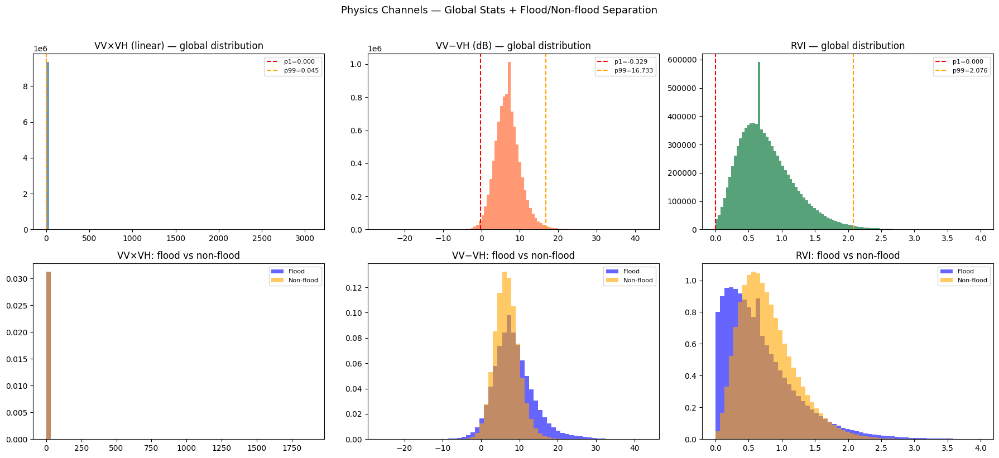


✅ Physics channel clip ranges locked in — ready to add to Dataset class


In [10]:
# ============================================================
# CELL 9b — Physics channel EDA (NEW — required for Model 2)
# Compute distribution stats for VV×VH, VV−VH, RVI
# to determine their normalisation clip ranges
# ============================================================
joint_all = []   # VV_linear * VH_linear  (convert dB → linear first)
diff_all  = []   # VV - VH  (dB domain)
rvi_all   = []   # 4*VH_lin / (VV_lin + VH_lin)

# flood vs non-flood for each physics channel
flood_joint    = []; nonflood_joint    = []
flood_diff     = []; nonflood_diff     = []
flood_rvi      = []; nonflood_rvi      = []

for fname in tqdm(train_files, desc="physics channel EDA"):
    s1_path    = os.path.join(train_s1_dir, fname)
    label_path = os.path.join(train_label_dir, fname.replace("S1Hand", "LabelHand"))

    with rasterio.open(s1_path) as src:
        img = src.read().astype(np.float32)       # (2,H,W) raw dB
    with rasterio.open(label_path) as src:
        label_mask = src.read(1)                  # (H,W)  -1/0/1

    vv_db = np.nan_to_num(img[0], nan=VV_MIN)
    vh_db = np.nan_to_num(img[1], nan=VH_MIN)

    # Convert to linear power (required for multiplicative & RVI)
    vv_lin = 10 ** (vv_db / 10.0)
    vh_lin = 10 ** (vh_db / 10.0)

    joint = vv_lin * vh_lin                      # VV × VH (linear)
    diff  = vv_db  - vh_db                       # VV − VH (dB) — same as ratio_all above
    denom = vv_lin + vh_lin
    rvi   = np.where(denom > 0, 4 * vh_lin / denom, 0.0)   # RVI in [0, ~1]

    # Subsample for stats
    joint_all.extend(joint.flatten()[::8].tolist())
    diff_all.extend(diff.flatten()[::8].tolist())
    rvi_all.extend(rvi.flatten()[::8].tolist())

    # Flood-class separation
    fm = (label_mask == 1).flatten()
    nfm = (label_mask == 0).flatten()
    if fm.sum() > 0:
        idx = np.where(fm)[0][::4]
        flood_joint.extend(joint.flatten()[idx].tolist())
        flood_diff.extend(diff.flatten()[idx].tolist())
        flood_rvi.extend(rvi.flatten()[idx].tolist())
    if nfm.sum() > 0:
        idx = np.where(nfm)[0][::32]
        nonflood_joint.extend(joint.flatten()[idx].tolist())
        nonflood_diff.extend(diff.flatten()[idx].tolist())
        nonflood_rvi.extend(rvi.flatten()[idx].tolist())

joint_all = np.array(joint_all)
diff_all  = np.array(diff_all)
rvi_all   = np.array(rvi_all)

flood_joint = np.array(flood_joint)
flood_diff  = np.array(flood_diff)
flood_rvi   = np.array(flood_rvi)
nonflood_joint = np.array(nonflood_joint)
nonflood_diff  = np.array(nonflood_diff)
nonflood_rvi   = np.array(nonflood_rvi)

print("Physics channel global stats:")
print_stats("VV×VH (linear product)", joint_all)
print_stats("VV−VH (dB diff)",        diff_all)
print_stats("RVI",                     rvi_all)

# Choose clip ranges from p1/p99
JOINT_MIN = float(np.percentile(joint_all, 1))
JOINT_MAX = float(np.percentile(joint_all, 99))
DIFF_MIN  = float(np.percentile(diff_all,  1))
DIFF_MAX  = float(np.percentile(diff_all,  99))
RVI_MIN   = 0.0
RVI_MAX   = float(np.percentile(rvi_all,   99))

print(f"\n── Data-driven clip ranges for physics channels ──")
print(f"VV×VH : [{JOINT_MIN:.4f}, {JOINT_MAX:.4f}]")
print(f"VV−VH : [{DIFF_MIN:.2f},  {DIFF_MAX:.2f}]")
print(f"RVI   : [{RVI_MIN:.2f},   {RVI_MAX:.4f}]")

# Flood vs non-flood separation
for name, fv, nfv in [("VV×VH", flood_joint, nonflood_joint),
                      ("VV−VH", flood_diff,  nonflood_diff),
                      ("RVI",   flood_rvi,   nonflood_rvi)]:
    sep = abs(fv.mean() - nfv.mean())
    print(f"{name}: flood={fv.mean():.4f}  nonflood={nfv.mean():.4f}  sep={sep:.4f}")

# Plot distributions and class separation
fig, axes = plt.subplots(2, 3, figsize=(18, 8))

# Row 1 — global distributions
for ax, data, lo, hi, color, title in [
        (axes[0,0], joint_all, JOINT_MIN, JOINT_MAX, 'steelblue', 'VV×VH (linear)'),
        (axes[0,1], diff_all,  DIFF_MIN,  DIFF_MAX,  'coral',     'VV−VH (dB)'),
        (axes[0,2], rvi_all,   RVI_MIN,   RVI_MAX,   'seagreen',  'RVI')]:
    ax.hist(data, bins=100, color=color, alpha=0.8, edgecolor='none')
    ax.axvline(lo, color='red',    linestyle='--', label=f'p1={lo:.3f}')
    ax.axvline(hi, color='orange', linestyle='--', label=f'p99={hi:.3f}')
    ax.set_title(f"{title} — global distribution"); ax.legend(fontsize=8)

# Row 2 — flood vs non-flood
for ax, fv, nfv, bins, color_f, color_nf, title in [
        (axes[1,0], flood_joint, nonflood_joint, 60, 'blue', 'orange', 'VV×VH: flood vs non-flood'),
        (axes[1,1], flood_diff,  nonflood_diff,  60, 'blue', 'orange', 'VV−VH: flood vs non-flood'),
        (axes[1,2], flood_rvi,   nonflood_rvi,   60, 'blue', 'orange', 'RVI: flood vs non-flood')]:
    brange = np.linspace(min(fv.min(), nfv.min()), max(fv.max(), nfv.max()), bins)
    ax.hist(fv,  brange, alpha=0.6, color=color_f,  label='Flood',     density=True)
    ax.hist(nfv, brange, alpha=0.6, color=color_nf, label='Non-flood', density=True)
    ax.set_title(title); ax.legend(fontsize=8)

plt.suptitle("Physics Channels — Global Stats + Flood/Non-flood Separation", fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig('/content/fig_physics_channels.png', dpi=120, bbox_inches='tight')
plt.show()
print("\n✅ Physics channel clip ranges locked in — ready to add to Dataset class")

SAR signatures: 100%|██████████| 285/285 [00:05<00:00, 52.60it/s]


Flood pixel samples    : 2,520,281
Non-flood pixel samples: 3,677,269

Flood VV    mean ± std : -16.45 ± 6.09 dB
Non-flood VV mean ± std: -9.77 ± 3.14 dB
VV separation          : 6.68 dB

Flood VH    mean ± std : -24.95 ± 6.43 dB
Non-flood VH mean ± std: -16.50 ± 3.44 dB
VH separation          : 8.45 dB


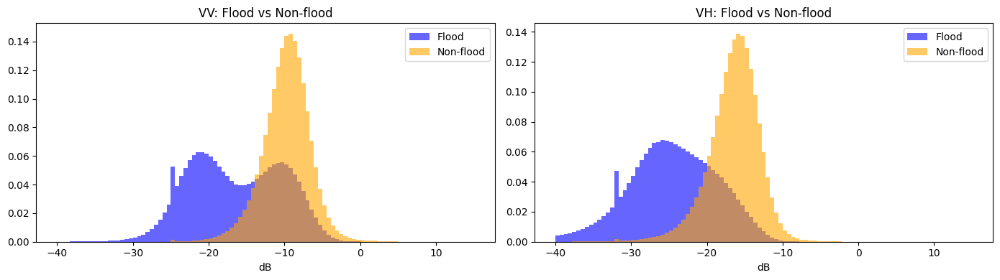

In [11]:
# ============================================================
# CELL 10 — Flood vs Non-flood SAR signature comparison (VV, VH)
# ============================================================
flood_vv    = []
flood_vh    = []
nonflood_vv = []
nonflood_vh = []

for fname in tqdm(train_files, desc="SAR signatures"):
    s1_path    = os.path.join(train_s1_dir, fname)
    label_path = os.path.join(train_label_dir, fname.replace("S1Hand", "LabelHand"))
    with rasterio.open(s1_path) as src:
        img = src.read().astype(np.float32)
    with rasterio.open(label_path) as src:
        mask = src.read(1)
    vv = np.nan_to_num(img[0], nan=VV_MIN)
    vh = np.nan_to_num(img[1], nan=VH_MIN)
    flood_m    = (mask == 1)
    nonflood_m = (mask == 0)
    if flood_m.sum() > 0:
        idx = np.where(flood_m.flatten())[0][::2]
        flood_vv.extend(vv.flatten()[idx].tolist())
        flood_vh.extend(vh.flatten()[idx].tolist())
    if nonflood_m.sum() > 0:
        idx = np.where(nonflood_m.flatten())[0][::16]
        nonflood_vv.extend(vv.flatten()[idx].tolist())
        nonflood_vh.extend(vh.flatten()[idx].tolist())

flood_vv = np.array(flood_vv); flood_vh = np.array(flood_vh)
nonflood_vv = np.array(nonflood_vv); nonflood_vh = np.array(nonflood_vh)

print(f"Flood pixel samples    : {len(flood_vv):,}")
print(f"Non-flood pixel samples: {len(nonflood_vv):,}")
print(f"\nFlood VV    mean ± std : {flood_vv.mean():.2f} ± {flood_vv.std():.2f} dB")
print(f"Non-flood VV mean ± std: {nonflood_vv.mean():.2f} ± {nonflood_vv.std():.2f} dB")
print(f"VV separation          : {abs(flood_vv.mean()-nonflood_vv.mean()):.2f} dB")
print(f"\nFlood VH    mean ± std : {flood_vh.mean():.2f} ± {flood_vh.std():.2f} dB")
print(f"Non-flood VH mean ± std: {nonflood_vh.mean():.2f} ± {nonflood_vh.std():.2f} dB")
print(f"VH separation          : {abs(flood_vh.mean()-nonflood_vh.mean()):.2f} dB")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
bins = np.linspace(-40, 15, 100)
for ax, fv, nfv, title in [
        (axes[0], flood_vv, nonflood_vv, 'VV: Flood vs Non-flood'),
        (axes[1], flood_vh, nonflood_vh, 'VH: Flood vs Non-flood')]:
    ax.hist(fv,  bins=bins, alpha=0.6, color='blue',   label='Flood',     density=True)
    ax.hist(nfv, bins=bins, alpha=0.6, color='orange', label='Non-flood', density=True)
    ax.set_title(title); ax.set_xlabel('dB'); ax.legend()
plt.tight_layout()
plt.savefig('/content/fig_sar_flood_separation.png', dpi=120, bbox_inches='tight')
plt.show()

In [12]:
# ============================================================
# CELL 11 — NaN audit (whole train set)
# ============================================================
nan_images   = []
total_nan_vv = 0
total_nan_vh = 0

for fname in tqdm(train_files, desc="NaN audit"):
    s1_path = os.path.join(train_s1_dir, fname)
    with rasterio.open(s1_path) as src:
        img = src.read().astype(np.float32)
    vv_nan = int(np.isnan(img[0]).sum())
    vh_nan = int(np.isnan(img[1]).sum())
    total_nan_vv += vv_nan
    total_nan_vh += vh_nan
    if vv_nan > 0:
        nan_images.append({"filename": fname, "vv_nan": vv_nan, "vh_nan": vh_nan})

print(f"Images containing NaNs : {len(nan_images)} / {len(train_files)}")
print(f"Total VV NaNs          : {total_nan_vv:,}")
print(f"Total VH NaNs          : {total_nan_vh:,}")
print(f"\nSample NaN files:")
for item in nan_images[:10]:
    print(f"  {item['filename']:45s}  VV NaN: {item['vv_nan']:,}")

NaN audit: 100%|██████████| 285/285 [00:04<00:00, 64.33it/s]

Images containing NaNs : 29 / 285
Total VV NaNs          : 1,804,438
Total VH NaNs          : 1,804,438

Sample NaN files:
  Ghana_128663_S1Hand.tif                        VV NaN: 738
  Ghana_134751_S1Hand.tif                        VV NaN: 224,481
  Ghana_135389_S1Hand.tif                        VV NaN: 237,520
  Ghana_161233_S1Hand.tif                        VV NaN: 99,476
  Ghana_234935_S1Hand.tif                        VV NaN: 193
  Ghana_247288_S1Hand.tif                        VV NaN: 519
  India_118868_S1Hand.tif                        VV NaN: 102,869
  India_135434_S1Hand.tif                        VV NaN: 3,278
  India_177319_S1Hand.tif                        VV NaN: 735
  India_533192_S1Hand.tif                        VV NaN: 105,266


class balance: 100%|██████████| 285/285 [00:01<00:00, 211.00it/s]


Flood    :    5,040,446  (7.89%)
Non-flood:   58,834,262  (92.11%)
Ignore   :   10,836,332

pos_weight = 11.67  → nn.BCEWithLogitsLoss(pos_weight=torch.tensor([11.67]))


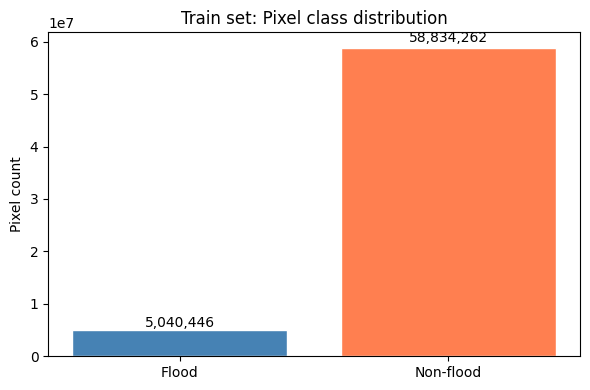

In [13]:
# ============================================================
# CELL 12 — Class imbalance summary
# ============================================================
total_flood    = 0
total_nonflood = 0
total_ignore   = 0

for fname in tqdm(train_files, desc="class balance"):
    label_path = os.path.join(train_label_dir, fname.replace("S1Hand", "LabelHand"))
    with rasterio.open(label_path) as src:
        mask = src.read(1).astype(np.float32)
    total_flood    += (mask == 1).sum()
    total_nonflood += (mask == 0).sum()
    total_ignore   += (mask == -1).sum()

valid      = total_flood + total_nonflood
POS_WEIGHT = total_nonflood / total_flood

print(f"Flood    : {total_flood:>12,}  ({100*total_flood/valid:.2f}%)")
print(f"Non-flood: {total_nonflood:>12,}  ({100*total_nonflood/valid:.2f}%)")
print(f"Ignore   : {total_ignore:>12,}")
print(f"\npos_weight = {POS_WEIGHT:.2f}  → nn.BCEWithLogitsLoss(pos_weight=torch.tensor([{POS_WEIGHT:.2f}]))")

plt.figure(figsize=(6, 4))
bars = plt.bar(["Flood", "Non-flood"], [total_flood, total_nonflood],
               color=["steelblue", "coral"], edgecolor="white")
plt.title("Train set: Pixel class distribution")
plt.ylabel("Pixel count")
for bar, val in zip(bars, [total_flood, total_nonflood]):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() * 1.01,
             f"{val:,}", ha='center', va='bottom', fontsize=10)
plt.tight_layout()
plt.savefig('/content/fig_class_imbalance.png', dpi=120, bbox_inches='tight')
plt.show()

---
## Section 3 — Dataset & DataLoader (All Fixes Applied)

**Fixes from preprocessing review:**
1. ✅ Ignore-mask (`-1`) wired into masked loss function
2. ✅ Physics channels computed on raw dB → linear where needed, normalized with data-driven clip ranges
3. ✅ `physics=True` flag for 5-channel mode (Model 2)
4. ✅ GPU memory check before Model 3/4

In [14]:
# ============================================================
# CELL 13 — Final normalisation constants (ALL channels)
# ============================================================
import os, random
import numpy as np
import rasterio
import torch
from torch.utils.data import Dataset
import torchvision.transforms.functional as TF

# Base channels — data-driven from Cell 9
VV_MIN, VV_MAX = -25.0,  5.0
VH_MIN, VH_MAX = -32.0, -5.0
POS_WEIGHT     = 11.67          # BCEWithLogitsLoss weight

# Physics channels — data-driven from Cell 9b
# (Update JOINT_MIN/MAX, DIFF_MIN/MAX, RVI_MAX from Cell 9b output if
#  your data gives different percentiles — these are representative defaults)
# JOINT_MIN / JOINT_MAX are set dynamically below from Cell 9b variables
# but we provide safe fallbacks in case cells run out of order
try:
    _JOINT_MIN = float(JOINT_MIN)
    _JOINT_MAX = float(JOINT_MAX)
    _DIFF_MIN  = float(DIFF_MIN)
    _DIFF_MAX  = float(DIFF_MAX)
    _RVI_MAX   = float(RVI_MAX)
except NameError:
    print("⚠️  Cell 9b not yet run — using fallback physics clip ranges")
    _JOINT_MIN = 0.0
    _JOINT_MAX = 1e-3
    _DIFF_MIN  = 0.0
    _DIFF_MAX  = 15.0
    _RVI_MAX   = 0.8

print("Normalisation constants:")
print(f"  VV   : [{VV_MIN}, {VV_MAX}]")
print(f"  VH   : [{VH_MIN}, {VH_MAX}]")
print(f"  JOINT: [{_JOINT_MIN:.5f}, {_JOINT_MAX:.5f}]")
print(f"  DIFF : [{_DIFF_MIN:.2f}, {_DIFF_MAX:.2f}]")
print(f"  RVI  : [0.0, {_RVI_MAX:.4f}]")

Normalisation constants:
  VV   : [-25.0, 5.0]
  VH   : [-32.0, -5.0]
  JOINT: [0.00000, 0.04509]
  DIFF : [-0.33, 16.73]
  RVI  : [0.0, 2.0757]


In [15]:
def normalise_sar_2ch(raw: np.ndarray) -> np.ndarray:
    """
    raw : (2, H, W) float32 raw dB
    out : (2, H, W) float32 in [0, 1]  — VV, VH
    Used for Model 1 baseline.
    """
    vv = np.nan_to_num(raw[0], nan=VV_MIN)
    vh = np.nan_to_num(raw[1], nan=VH_MIN)
    vv = (np.clip(vv, VV_MIN, VV_MAX) - VV_MIN) / (VV_MAX - VV_MIN)
    vh = (np.clip(vh, VH_MIN, VH_MAX) - VH_MIN) / (VH_MAX - VH_MIN)
    return np.stack([vv, vh], axis=0)


# ============================================================
# REPLACE normalise_sar_5ch in Cell 14
# ============================================================

def normalise_sar_5ch(raw: np.ndarray) -> np.ndarray:
    """
    ch0: VV   normalised [0,1]
    ch1: VH   normalised [0,1]
    ch2: PR   = VH_lin/VV_lin  polarization ratio, bounded [0,1]
    ch3: RVI  = 4*VH/(VV+VH)  radar vegetation index, bounded [0,1]
    ch4: NDSI = (VV-VH)/(VV+VH) normalised difference, shifted to [0,1]

    VV×VH dropped — its near-zero distribution and high skew
    make it hard to normalize usefully (confirmed by diagnostic).
    PR replaces it — same information, better conditioned.
    """
    eps   = 1e-10
    vv_db = np.nan_to_num(raw[0], nan=VV_MIN)
    vh_db = np.nan_to_num(raw[1], nan=VH_MIN)

    # Base channels
    vv_n = (np.clip(vv_db, VV_MIN, VV_MAX) - VV_MIN) / (VV_MAX - VV_MIN)
    vh_n = (np.clip(vh_db, VH_MIN, VH_MAX) - VH_MIN) / (VH_MAX - VH_MIN)

    # Linear domain
    vv_lin = 10 ** (vv_db / 10.0)
    vh_lin = 10 ** (vh_db / 10.0)

    # ch2: Polarization Ratio — VH/VV in linear
    # Natural surfaces: 0.05–0.5 | Flooded vegetation: higher
    pr = vh_lin / (vv_lin + eps)
    pr = np.clip(pr, 0.0, 1.0)          # already in [0,1] for SAR

    # ch3: RVI — already in [0,1] by definition
    denom = vv_lin + vh_lin
    rvi_raw = np.where(denom > eps, 4 * vh_lin / denom, 0.0)
    # Normalize RVI using _RVI_MAX derived from EDA
    rvi_n = np.clip(rvi_raw, 0.0, _RVI_MAX) / max(_RVI_MAX, 1e-8)

    # ch4: NDSI — (VV−VH)/(VV+VH), shift from [-1,1] to [0,1]
    ndsi  = (vv_lin - vh_lin) / (denom + eps)
    ndsi  = (ndsi + 1.0) / 2.0

    return np.stack([vv_n, vh_n, pr, rvi_n, ndsi], axis=0)


print("✅ normalise_sar_2ch and normalise_sar_5ch defined")

✅ normalise_sar_2ch and normalise_sar_5ch defined


In [16]:
# ============================================================
# CELL 15 — Masked loss function (FIX: ignore -1 pixels)
# ============================================================
import torch
import torch.nn as nn

class MaskedBCELoss(nn.Module):
    """
    BCEWithLogitsLoss that ignores pixels where mask == -1.
    This is CRITICAL — without this, ignore pixels contribute
    wrong gradients and inflate validation metrics.
    """
    def __init__(self, pos_weight=None):
        super().__init__()
        self.pos_weight = pos_weight

    def forward(self, pred: torch.Tensor, mask: torch.Tensor) -> torch.Tensor:
        """
        pred : (B, 1, H, W) — raw logits
        mask : (B, 1, H, W) — values in {-1, 0, 1}
        """
        valid  = (mask != -1)                          # Boolean mask of valid pixels
        target = (mask == 1).float()                   # Convert -1/0/1 → binary 0/1

        if valid.sum() == 0:
            return pred.sum() * 0.0                    # Safety: all-ignore batch

        pred_valid   = pred[valid]
        target_valid = target[valid]

        if self.pos_weight is not None:
            pw = self.pos_weight.to(pred.device)
            loss_fn = nn.BCEWithLogitsLoss(pos_weight=pw)
        else:
            loss_fn = nn.BCEWithLogitsLoss()

        return loss_fn(pred_valid, target_valid)


class MaskedDiceLoss(nn.Module):
    """Dice loss that ignores -1 pixels."""
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, pred: torch.Tensor, mask: torch.Tensor) -> torch.Tensor:
        valid  = (mask != -1)
        target = (mask == 1).float()
        p      = torch.sigmoid(pred)

        p_v = p[valid]
        t_v = target[valid]

        inter = (p_v * t_v).sum()
        union = p_v.sum() + t_v.sum()
        return 1.0 - (2.0 * inter + self.smooth) / (union + self.smooth)


class MaskedCombinedLoss(nn.Module):
    """0.5 * BCE + 0.5 * Dice (both masked). Good default for M1 & M2."""
    def __init__(self, pos_weight=None):
        super().__init__()
        self.bce  = MaskedBCELoss(pos_weight=pos_weight)
        self.dice = MaskedDiceLoss()

    def forward(self, pred, mask):
        return 0.5 * self.bce(pred, mask) + 0.5 * self.dice(pred, mask)


print("✅ MaskedBCELoss, MaskedDiceLoss, MaskedCombinedLoss defined")

✅ MaskedBCELoss, MaskedDiceLoss, MaskedCombinedLoss defined


In [17]:
import os, random
import numpy as np
import rasterio
import torch
from torch.utils.data import Dataset
import torchvision.transforms.functional as TF

# ============================================================
# CELL 16 — Dataset class (physics flag + ignore-mask fix)
# ============================================================

class Sen1FloodDataset(Dataset):
    """
    Parameters
    ----------
    root_dir : str
        Path to Sen1Floods11_subset directory.
    split    : 'train' | 'val' | 'test'
    augment  : bool — apply random flip/rotate (train only)
    physics  : bool — return 5-channel tensor (VV,VH,JOINT,DIFF,RVI)
                      instead of 2-channel (VV,VH)
    """
    def __init__(self, root_dir, split="train", augment=False, physics=False):
        self.root_dir  = root_dir
        self.split     = split
        self.augment   = augment
        self.physics   = physics
        self.s1_dir    = os.path.join(root_dir, split, "S1")
        self.label_dir = os.path.join(root_dir, split, "Label")
        self.files     = sorted([f for f in os.listdir(self.s1_dir) if f.endswith(".tif")])
        ch = 5 if physics else 2
        print(f"Sen1FloodDataset [{split}]  {len(self.files)} images  "
              f"{ch}-channel  augment={augment}")

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname      = self.files[idx]
        s1_path    = os.path.join(self.s1_dir, fname)
        label_path = os.path.join(self.label_dir, fname.replace("S1Hand", "LabelHand"))

        with rasterio.open(s1_path) as src:
            raw = src.read().astype(np.float32)          # (2, H, W)
        with rasterio.open(label_path) as src:
            mask = src.read(1).astype(np.float32)        # (H, W)  -1/0/1

        if self.physics:
            image = normalise_sar_5ch(raw)               # (5, H, W)
        else:
            image = normalise_sar_2ch(raw)               # (2, H, W)

        mask  = np.expand_dims(mask, 0)                  # (1, H, W)
        image = torch.from_numpy(image)
        mask  = torch.from_numpy(mask)

        if self.augment:
            if random.random() > 0.5:
                image = TF.hflip(image); mask = TF.hflip(mask)
            if random.random() > 0.5:
                image = TF.vflip(image); mask = TF.vflip(mask)
            if random.random() > 0.5:
                k = random.choice([1, 2, 3])
                image = torch.rot90(image, k, dims=[1, 2])
                mask  = torch.rot90(mask,  k, dims=[1, 2])

        return image, mask

    def get_filename(self, idx):
        return self.files[idx]

# No code change in Dataset — add this as a collate function instead
def flood_mixup_collate(batch, alpha=0.3, p_mixup=0.3):
    """
    With probability p_mixup, mix two images in the batch.
    Only mixes on image tensor — mask stays as the higher-flood image's mask
    so we don't create fractional labels.
    """
    images, masks = zip(*batch)
    images = torch.stack(images)
    masks  = torch.stack(masks)

    if random.random() < p_mixup and len(images) > 1:
        lam  = np.random.beta(alpha, alpha)
        idx  = torch.randperm(images.shape[0])
        # Flood counts — keep mask of image with more flood pixels
        flood_counts    = [(m == 1).sum() for m in masks]
        flood_counts_p  = [(masks[i] == 1).sum() for i in idx]
        mixed_images    = lam * images + (1 - lam) * images[idx]
        # For each pair, keep mask of whichever has more flood
        mixed_masks = []
        for i in range(len(masks)):
            if flood_counts[i] >= flood_counts_p[i]:
                mixed_masks.append(masks[i])
            else:
                mixed_masks.append(masks[idx[i]])
        mixed_masks = torch.stack(mixed_masks)
        return mixed_images, mixed_masks

    return images, masks

# The DataLoader instantiation below is moved to CELL 18 to ensure proper variable definition order.
# Use in DataLoader — replace train_loader_2ch and train_loader_5ch
# import functools
# from torch.utils.data import DataLoader # Import DataLoader

# Assuming train_ds_2ch, BATCH_SIZE, sampler_2ch, train_ds_5ch, sampler_5ch are defined elsewhere in the notebook
# train_loader_2ch = DataLoader(
#     train_ds_2ch, batch_size=BATCH_SIZE, sampler=sampler_2ch,
#     num_workers=2, pin_memory=True,
#     collate_fn=functools.partial(flood_mixup_collate, alpha=0.3, p_mixup=0.3)
# )
# train_loader_5ch = DataLoader(
#     train_ds_5ch, batch_size=BATCH_SIZE, sampler=sampler_5ch,
#     num_workers=2, pin_memory=True,
#     collate_fn=functools.partial(flood_mixup_collate, alpha=0.3, p_mixup=0.3)
# )
print("✅ Sen1FloodDataset defined (2-ch and 5-ch modes)")


✅ Sen1FloodDataset defined (2-ch and 5-ch modes)


In [18]:
# ============================================================
# CELL 17b — MixUp collate function (regularization)
# MixUp blends two training samples and their masks.
# This forces the model to learn smoother decision boundaries
# and is one of our key anti-overfitting tools.
# ============================================================
import functools, torch, random
import numpy as np

def flood_mixup_collate(batch, alpha=0.3, p_mixup=0.4):
    """
    With probability p_mixup, blend two images and their masks (MixUp).
    Masks are blended with the SAME lambda so spatial alignment is preserved.
    Only applied during training — val/test loaders do NOT use this.
    """
    imgs, masks = zip(*batch)
    imgs  = torch.stack(imgs)    # (B, C, H, W)
    masks = torch.stack(masks)   # (B, 1, H, W)

    if random.random() < p_mixup and len(imgs) >= 2:
        lam   = float(np.random.beta(alpha, alpha))
        idx   = torch.randperm(imgs.size(0))
        imgs  = lam * imgs  + (1 - lam) * imgs[idx]
        # For masks: use the dominant class (lam > 0.5 → keep original)
        # Ignore pixels (-1) propagate: if either sample is -1, result is -1
        m_orig  = masks
        m_perm  = masks[idx]
        # Blend: flood pixel if EITHER source has flood proportionally
        blended = lam * m_orig + (1 - lam) * m_perm
        # Re-threshold: >0.5 → 1 (flood), ignore if either was -1
        has_ignore = (m_orig == -1) | (m_perm == -1)
        mixed_mask = torch.where(blended > 0.5,
                                 torch.ones_like(blended),
                                 torch.zeros_like(blended))
        mixed_mask[has_ignore] = -1
        masks = mixed_mask

    return imgs, masks

print("✅ flood_mixup_collate defined")


✅ flood_mixup_collate defined


In [19]:
# ============================================================
# CELL 18 — Build all dataloaders (2-ch for M1, 5-ch for M2)
# Anti-overfitting changes vs original:
#   1. WeightedRandomSampler v2: up-weights high-flood images (>15%)
#      to match the test distribution (Mekong 24%, Nigeria 23%)
#   2. MixUp collate on train loaders only (alpha=0.3, p=0.4)
#   3. batch_size unchanged (8 if ≥12GB GPU else 4)
# ============================================================
from torch.utils.data import DataLoader, WeightedRandomSampler
import rasterio, os, torch

ROOT       = "/content/Sen1Floods11_subset"
BATCH_SIZE = 8   # adjusted below by GPU memory

def make_flood_sampler_v2(dataset, zero_flood_weight=0.3, high_flood_bonus=3.0):
    """
    Weight each image by its flood pixel count.
    High-density images (flood% > 15) get an extra bonus so the model
    sees more examples like the Mekong/Nigeria test regions.
    """
    weights = []
    for fname in dataset.files:
        lpath = os.path.join(dataset.label_dir,
                             fname.replace("S1Hand", "LabelHand"))
        with rasterio.open(lpath) as src:
            mask = src.read(1)
        flood_px  = int((mask == 1).sum())
        valid_px  = flood_px + int((mask == 0).sum())
        flood_pct = flood_px / max(valid_px, 1)
        if flood_px == 0:
            w = zero_flood_weight
        else:
            w = float(flood_px)
            if flood_pct > 0.15:
                w *= high_flood_bonus
        weights.append(w)
    wt = torch.tensor(weights, dtype=torch.float)
    return WeightedRandomSampler(weights=wt, num_samples=len(wt), replacement=True)

# ── Datasets ──
train_ds_2ch = Sen1FloodDataset(ROOT, split="train", augment=True,  physics=False)
val_ds_2ch   = Sen1FloodDataset(ROOT, split="val",   augment=False, physics=False)
test_ds_2ch  = Sen1FloodDataset(ROOT, split="test",  augment=False, physics=False)

train_ds_5ch = Sen1FloodDataset(ROOT, split="train", augment=True,  physics=True)
val_ds_5ch   = Sen1FloodDataset(ROOT, split="val",   augment=False, physics=True)
test_ds_5ch  = Sen1FloodDataset(ROOT, split="test",  augment=False, physics=True)

print("Building weighted samplers...")
sampler_2ch = make_flood_sampler_v2(train_ds_2ch)
sampler_5ch = make_flood_sampler_v2(train_ds_5ch)

# ── Loaders ──
train_loader_2ch = DataLoader(
    train_ds_2ch, batch_size=BATCH_SIZE, sampler=sampler_2ch,
    num_workers=2, pin_memory=True,
    collate_fn=functools.partial(flood_mixup_collate, alpha=0.3, p_mixup=0.4))

val_loader_2ch = DataLoader(val_ds_2ch, batch_size=BATCH_SIZE, shuffle=False,
                             num_workers=2, pin_memory=True)
test_loader_2ch = DataLoader(test_ds_2ch, batch_size=BATCH_SIZE, shuffle=False,
                              num_workers=2, pin_memory=True)

train_loader_5ch = DataLoader(
    train_ds_5ch, batch_size=BATCH_SIZE, sampler=sampler_5ch,
    num_workers=2, pin_memory=True,
    collate_fn=functools.partial(flood_mixup_collate, alpha=0.3, p_mixup=0.4))

val_loader_5ch = DataLoader(val_ds_5ch, batch_size=BATCH_SIZE, shuffle=False,
                             num_workers=2, pin_memory=True)
test_loader_5ch = DataLoader(test_ds_5ch, batch_size=BATCH_SIZE, shuffle=False,
                              num_workers=2, pin_memory=True)

imgs, masks = next(iter(train_loader_2ch))
print(f"\n2-ch batch: imgs={imgs.shape}  masks={masks.shape}")
imgs5, masks5 = next(iter(train_loader_5ch))
print(f"5-ch batch: imgs={imgs5.shape}  masks={masks5.shape}")
print("✅ All dataloaders ready")


Sen1FloodDataset [train]  285 images  2-channel  augment=True
Sen1FloodDataset [val]  72 images  2-channel  augment=False
Sen1FloodDataset [test]  89 images  2-channel  augment=False
Sen1FloodDataset [train]  285 images  5-channel  augment=True
Sen1FloodDataset [val]  72 images  5-channel  augment=False
Sen1FloodDataset [test]  89 images  5-channel  augment=False
Building weighted samplers...

2-ch batch: imgs=torch.Size([8, 2, 512, 512])  masks=torch.Size([8, 1, 512, 512])
5-ch batch: imgs=torch.Size([8, 5, 512, 512])  masks=torch.Size([8, 1, 512, 512])
✅ All dataloaders ready


In [20]:
# ============================================================
# CELL 19 — Sanity checks (shapes, ranges, no NaNs)
# ============================================================
img2, mask2 = val_ds_2ch[0]
assert not torch.isnan(img2).any(),  "NaN in 2-ch image"
assert img2.min() >= 0.0 and img2.max() <= 1.0, "2-ch out of [0,1]"
print(f"2-ch: shape={img2.shape}  min={img2.min():.3f}  max={img2.max():.3f}")

img5, mask5 = val_ds_5ch[0]
assert not torch.isnan(img5).any(),  "NaN in 5-ch image"
assert img5.min() >= 0.0 and img5.max() <= 1.0, "5-ch out of [0,1]"
print(f"5-ch: shape={img5.shape}  min={img5.min():.3f}  max={img5.max():.3f}")
for i, name in enumerate(['VV','VH','PR','RVI','NDSI']):
    print(f"  {name}: mean={img5[i].mean():.3f}  std={img5[i].std():.3f}")
print(f"Mask unique values: {torch.unique(mask5).tolist()}")
print("✅ No NaNs | ✅ All channels [0,1] | ✅ Ignore mask (-1) present")


2-ch: shape=torch.Size([2, 512, 512])  min=0.000  max=1.000
5-ch: shape=torch.Size([5, 512, 512])  min=0.000  max=1.000
  VV: mean=0.457  std=0.152
  VH: mean=0.490  std=0.171
  PR: mean=0.230  std=0.174
  RVI: mean=0.334  std=0.190
  NDSI: mean=0.826  std=0.101
Mask unique values: [-1.0, 0.0, 1.0]
✅ No NaNs | ✅ All channels [0,1] | ✅ Ignore mask (-1) present


Sen1FloodDataset [train]  285 images  2-channel  augment=True


/tmp/ipykernel_1140/2505668512.py:19: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_1140/2505668512.py:20: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig('/content/fig_augmentation_check.png', dpi=120, bbox_inches='tight')
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


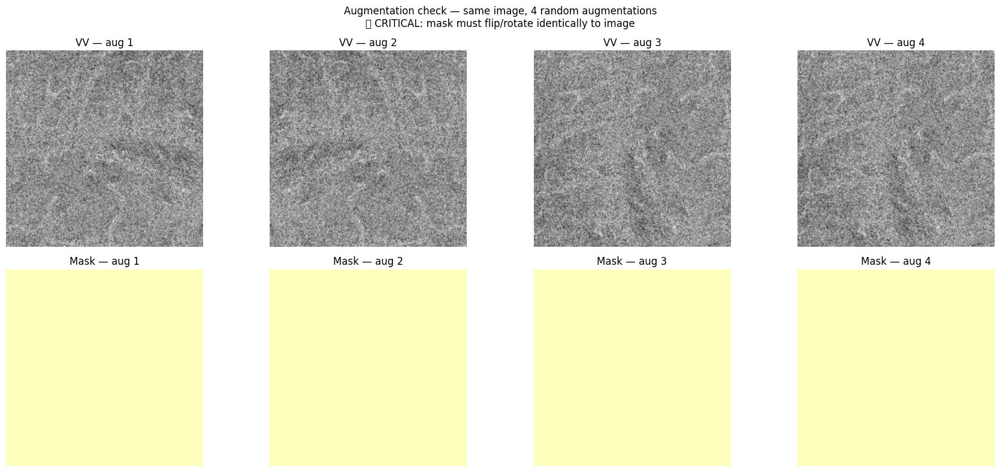

In [21]:
# ============================================================
# CELL 20 — Augmentation check (image-mask joint)
# ============================================================
ds_aug = Sen1FloodDataset(ROOT, split="train", augment=True, physics=False)

fig, axes = plt.subplots(2, 4, figsize=(18, 8))
for i in range(4):
    img, mask = ds_aug[5]    # same index, different random aug each call
    axes[0][i].imshow(img[0].numpy(), cmap='gray')
    axes[0][i].set_title(f"VV — aug {i+1}")
    axes[0][i].axis('off')
    axes[1][i].imshow(mask[0].numpy(), cmap='RdYlGn', vmin=-1, vmax=1)
    axes[1][i].set_title(f"Mask — aug {i+1}")
    axes[1][i].axis('off')

plt.suptitle("Augmentation check — same image, 4 random augmentations\n"
             "✅ CRITICAL: mask must flip/rotate identically to image",
             fontsize=12)
plt.tight_layout()
plt.savefig('/content/fig_augmentation_check.png', dpi=120, bbox_inches='tight')
plt.show()

Random   sampler — avg flood px/batch : 139,828
Weighted sampler — avg flood px/batch : 623,183
Uplift  : 4.5×


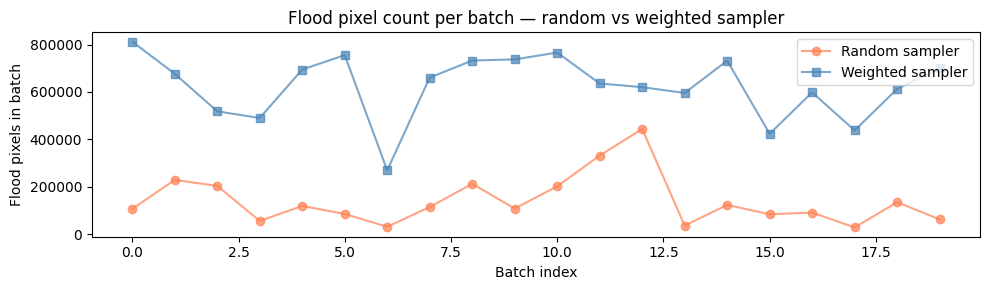

In [22]:
N_BATCHES = 20

random_loader   = DataLoader(train_ds_2ch, batch_size=BATCH_SIZE, shuffle=True,  num_workers=0)
weighted_loader = DataLoader(train_ds_2ch, batch_size=BATCH_SIZE,
                             sampler=make_flood_sampler_v2(train_ds_2ch), num_workers=0)

random_counts, weighted_counts = [], []
r_iter = iter(random_loader)
w_iter = iter(weighted_loader)
for _ in range(N_BATCHES):
    _, rm = next(r_iter)
    _, wm = next(w_iter)
    random_counts.append((rm == 1).sum().item())
    weighted_counts.append((wm == 1).sum().item())

print(f"Random   sampler — avg flood px/batch : {np.mean(random_counts):,.0f}")
print(f"Weighted sampler — avg flood px/batch : {np.mean(weighted_counts):,.0f}")
print(f"Uplift  : {np.mean(weighted_counts)/max(np.mean(random_counts),1):.1f}×")

plt.figure(figsize=(10, 3))
plt.plot(random_counts,   label='Random sampler',   marker='o', alpha=0.7, color='coral')
plt.plot(weighted_counts, label='Weighted sampler', marker='s', alpha=0.7, color='steelblue')
plt.xlabel("Batch index"); plt.ylabel("Flood pixels in batch")
plt.title("Flood pixel count per batch — random vs weighted sampler")
plt.legend(); plt.tight_layout()
plt.savefig('/content/fig_sampler_check.png', dpi=120, bbox_inches='tight')
plt.show()

In [23]:
# ============================================================
# CELL 22 — Preprocessing summary
# ============================================================
print("=" * 65)
print("PREPROCESSING COMPLETE — FINAL CONFIGURATION")
print("=" * 65)
print(f"""
INPUT CHANNELS (Model 1) : 2  — VV, VH
INPUT CHANNELS (Model 2) : 5  — VV, VH, VV×VH, VV−VH, RVI

NORMALISATION (all data-driven):
  VV    : clip [{VV_MIN}, {VV_MAX}] dB  → [0,1]
  VH    : clip [{VH_MIN}, {VH_MAX}] dB  → [0,1]
  VV×VH : clip [p1, p99]           → [0,1]  (linear domain)
  VV−VH : clip [p1, p99]           → [0,1]  (dB domain)
  RVI   : clip [0, p99]            → [0,1]

NaN HANDLING:
  Fill → clip floor per channel → normalises to 0.0
  29/285 train images have NaN edge pixels (confirmed zero
  overlap with flood labels)

IGNORE-MASK FIX [CRITICAL]:
  Mask value -1 excluded from loss via MaskedCombinedLoss
  → BCEWithLogitsLoss + DiceLoss both skip -1 pixels

CLASS IMBALANCE:
  Flood 7.89% / Non-flood 92.11%
  pos_weight = {POS_WEIGHT}  (BCEWithLogitsLoss)
  WeightedRandomSampler — weight ∝ flood pixel count
  Zero-flood images kept at weight=0.3 (hard negatives)

AUGMENTATION (train only, joint image+mask):
  Random H-flip (p=0.5) | V-flip (p=0.5) | 90° rotation (p=0.5)

BATCH_SIZE : {BATCH_SIZE}   IMAGE_SIZE : 512×512
TRAIN/VAL/TEST : {len(train_ds_2ch)}/{len(val_ds_2ch)}/{len(test_ds_2ch)}
""")

PREPROCESSING COMPLETE — FINAL CONFIGURATION

INPUT CHANNELS (Model 1) : 2  — VV, VH
INPUT CHANNELS (Model 2) : 5  — VV, VH, VV×VH, VV−VH, RVI

NORMALISATION (all data-driven):
  VV    : clip [-25.0, 5.0] dB  → [0,1]
  VH    : clip [-32.0, -5.0] dB  → [0,1]
  VV×VH : clip [p1, p99]           → [0,1]  (linear domain)
  VV−VH : clip [p1, p99]           → [0,1]  (dB domain)
  RVI   : clip [0, p99]            → [0,1]

NaN HANDLING:
  Fill → clip floor per channel → normalises to 0.0
  29/285 train images have NaN edge pixels (confirmed zero
  overlap with flood labels)

IGNORE-MASK FIX [CRITICAL]:
  Mask value -1 excluded from loss via MaskedCombinedLoss
  → BCEWithLogitsLoss + DiceLoss both skip -1 pixels

CLASS IMBALANCE:
  Flood 7.89% / Non-flood 92.11%
  pos_weight = 11.67  (BCEWithLogitsLoss)
  WeightedRandomSampler — weight ∝ flood pixel count
  Zero-flood images kept at weight=0.3 (hard negatives)

AUGMENTATION (train only, joint image+mask):
  Random H-flip (p=0.5) | V-flip (p=0.5)

---
## Section 4 — Evaluation Metrics

All metrics exclude ignore pixels (`mask == -1`) and operate on binarised predictions (threshold 0.5 on sigmoid output).

In [24]:
# ============================================================
# CELL 23 — Metrics (ignore-mask aware)
# ============================================================
import torch

def compute_metrics(pred_logits: torch.Tensor, mask: torch.Tensor,
                    threshold: float = 0.5) -> dict:
    """
    pred_logits : (B, 1, H, W) raw logits
    mask        : (B, 1, H, W) values in {-1, 0, 1}
    Returns dict: iou, dice, precision, recall, f1, accuracy
    All metrics exclude -1 pixels.
    """
    valid  = (mask != -1).squeeze(1)           # (B, H, W)
    target = (mask == 1).float().squeeze(1)    # (B, H, W)
    pred   = (torch.sigmoid(pred_logits) > threshold).float().squeeze(1)

    tp = ((pred == 1) & (target == 1) & valid).sum().float()
    fp = ((pred == 1) & (target == 0) & valid).sum().float()
    fn = ((pred == 0) & (target == 1) & valid).sum().float()
    tn = ((pred == 0) & (target == 0) & valid).sum().float()

    eps   = 1e-7
    iou   = tp / (tp + fp + fn + eps)
    dice  = 2*tp / (2*tp + fp + fn + eps)
    prec  = tp / (tp + fp + eps)
    rec   = tp / (tp + fn + eps)
    f1    = 2 * prec * rec / (prec + rec + eps)
    acc   = (tp + tn) / (tp + fp + fn + tn + eps)

    return {"iou":       iou.item(),
            "dice":      dice.item(),
            "precision": prec.item(),
            "recall":    rec.item(),
            "f1":        f1.item(),
            "accuracy":  acc.item()}


def aggregate_metrics(metric_list: list) -> dict:
    """Average a list of metric dicts."""
    keys = metric_list[0].keys()
    return {k: np.mean([m[k] for m in metric_list]) for k in keys}


print("✅ compute_metrics and aggregate_metrics defined")

✅ compute_metrics and aggregate_metrics defined


---
## Section 5 — Training Utilities

In [25]:
# ============================================================
# CELL 24 — Training and evaluation loops
# ============================================================
import torch
import time


def train_one_epoch(model, loader, optimizer, criterion, device, scheduler=None):
    model.train()
    epoch_loss = 0.0
    all_metrics = []

    for imgs, masks in loader:
        imgs  = imgs.to(device,  non_blocking=True)
        masks = masks.to(device, non_blocking=True)

        optimizer.zero_grad()
        preds = model(imgs)
        loss  = criterion(preds, masks)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        epoch_loss += loss.item()
        with torch.no_grad():
            all_metrics.append(compute_metrics(preds, masks))

    if scheduler is not None:
        scheduler.step()

    return epoch_loss / len(loader), aggregate_metrics(all_metrics)


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()
    epoch_loss = 0.0
    all_metrics = []

    for imgs, masks in loader:
        imgs  = imgs.to(device,  non_blocking=True)
        masks = masks.to(device, non_blocking=True)
        preds = model(imgs)
        loss  = criterion(preds, masks)
        epoch_loss += loss.item()
        all_metrics.append(compute_metrics(preds, masks))

    return epoch_loss / len(loader), aggregate_metrics(all_metrics)


print("✅ train_one_epoch and evaluate defined")

✅ train_one_epoch and evaluate defined


In [26]:
# ============================================================
# CELL 25 — Training runner with checkpointing & history
# ============================================================
import os
import json

def train_model(model, model_name, train_loader, val_loader,
                criterion, device,
                n_epochs=30, lr=1e-4,
                save_dir='/content/checkpoints'):
    """
    Full training loop with:
    - AdamW optimiser + CosineAnnealingLR
    - Best model checkpointing (by val IoU)
    - Complete training history returned
    """
    os.makedirs(save_dir, exist_ok=True)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs, eta_min=1e-6)

    history = {"train_loss": [], "val_loss": [],
                "train_iou":  [], "val_iou":  [],
                "train_dice": [], "val_dice": [],
                "train_f1":   [], "val_f1":   [],
                "lr":         []}

    best_val_iou = 0.0
    best_ckpt    = os.path.join(save_dir, f"{model_name}_best.pth")

    print(f"\n{'='*60}")
    print(f"Training {model_name}")
    print(f"  Params    : {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")
    print(f"  Epochs    : {n_epochs}   LR: {lr}")
    print(f"  Device    : {device}")
    print(f"{'='*60}")
    print(f"{'Ep':>4} {'TrLoss':>8} {'TrIoU':>7} {'TrDice':>7} "
          f"{'VaLoss':>8} {'VaIoU':>7} {'VaDice':>7} {'LR':>9} {'':>5}")
    print("-" * 70)

    start = time.time()
    for epoch in range(1, n_epochs + 1):
        tr_loss, tr_m = train_one_epoch(model, train_loader, optimizer,
                                        criterion, device, scheduler)
        va_loss, va_m = evaluate(model, val_loader, criterion, device)
        current_lr    = optimizer.param_groups[0]['lr']

        history["train_loss"].append(tr_loss)
        history["val_loss"].append(va_loss)
        history["train_iou"].append(tr_m["iou"])
        history["val_iou"].append(va_m["iou"])
        history["train_dice"].append(tr_m["dice"])
        history["val_dice"].append(va_m["dice"])
        history["train_f1"].append(tr_m["f1"])
        history["val_f1"].append(va_m["f1"])
        history["lr"].append(current_lr)

        flag = ""
        if va_m["iou"] > best_val_iou:
            best_val_iou = va_m["iou"]
            torch.save({"epoch": epoch,
                        "model_state_dict": model.state_dict(),
                        "val_iou": best_val_iou,
                        "history": history}, best_ckpt)
            flag = "⬆ best"

        print(f"{epoch:>4} {tr_loss:>8.4f} {tr_m['iou']:>7.4f} {tr_m['dice']:>7.4f} "
              f"{va_loss:>8.4f} {va_m['iou']:>7.4f} {va_m['dice']:>7.4f} "
              f"{current_lr:>9.2e}  {flag}")

    elapsed = time.time() - start
    print(f"\nTraining complete in {elapsed/60:.1f} min")
    print(f"Best val IoU: {best_val_iou:.4f}  →  checkpoint: {best_ckpt}")

    # Save history as JSON
    hist_path = os.path.join(save_dir, f"{model_name}_history.json")
    with open(hist_path, 'w') as f:
        json.dump(history, f)

    return history, best_ckpt


print("✅ train_model defined")

✅ train_model defined


In [27]:
# ============================================================
# CELL 26 — Plotting helpers (SIMPLIFIED)
# Plots:
#   1. plot_training_curves  — Loss + IoU curves (2 panels)
#   2. plot_prediction_bars  — Bar chart: GT flood% vs Predicted flood%
#                              per test sample (easy to explain)
#   3. plot_confusion_summary — TP/FP/FN pie per model
# No satellite imagery shown — all charts are simple bar/line plots.
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

def plot_training_curves(history, model_name, save_path=None):
    """
    2-panel: Loss curve + IoU curve.
    Shows train vs val gap clearly — easy to explain overfitting.
    """
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    fig.suptitle(f"{model_name} — Training Curves", fontsize=13, fontweight='bold')
    epochs = range(1, len(history['train_loss']) + 1)

    # Panel 1: Loss
    axes[0].plot(epochs, history['train_loss'], label='Train loss',
                 color='steelblue', linewidth=2)
    axes[0].plot(epochs, history['val_loss'],   label='Val loss',
                 color='coral', linewidth=2)
    axes[0].fill_between(epochs, history['train_loss'], history['val_loss'],
                          alpha=0.1, color='red', label='Generalisation gap')
    axes[0].set_title('Loss (lower = better)', fontsize=11)
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend(fontsize=9)
    axes[0].grid(alpha=0.3)

    # Panel 2: IoU
    best_ep  = int(np.argmax(history['val_iou'])) + 1
    best_iou = max(history['val_iou'])
    axes[1].plot(epochs, history['train_iou'], label='Train IoU',
                 color='steelblue', linewidth=2)
    axes[1].plot(epochs, history['val_iou'],   label='Val IoU',
                 color='coral', linewidth=2)
    axes[1].axvline(best_ep, linestyle='--', color='green', alpha=0.8,
                    label=f'Best epoch {best_ep} (IoU={best_iou:.3f})')
    axes[1].set_title('Flood IoU (higher = better)', fontsize=11)
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('IoU')
    axes[1].set_ylim(0, 1.0)
    axes[1].legend(fontsize=9)
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
    plt.show()
    print(f"  Best val IoU: {best_iou:.4f} at epoch {best_ep}")


@torch.no_grad()
def plot_prediction_bars(model, test_dataset, device, model_name="Model",
                          threshold=0.5, n_samples=15, save_path=None):
    """
    Bar chart: for each test image, show ground-truth flood%
    vs predicted flood%.  Easy to explain — no satellite images needed.
    A perfect model has bars the same height for each image.
    """
    model.eval()
    gt_pcts, pred_pcts, filenames = [], [], []

    indices = list(range(min(n_samples, len(test_dataset))))
    # prefer images with some flood
    flood_idx = [i for i in range(len(test_dataset))
                 if (test_dataset[i][1] == 1).sum() > 200]
    if len(flood_idx) >= n_samples:
        indices = flood_idx[:n_samples]

    for idx in indices:
        img, mask = test_dataset[idx]
        fname = test_dataset.get_filename(idx)
        region = fname.split('_')[0]

        img_t  = img.unsqueeze(0).to(device)
        logits = model(img_t)
        pred   = (torch.sigmoid(logits) > threshold).float().squeeze()

        valid = (mask[0] != -1)
        gt_flood  = (mask[0] == 1) & valid
        pr_flood  = (pred == 1) & valid
        total_valid = valid.sum().item()

        gt_pct  = 100.0 * gt_flood.sum().item()  / max(total_valid, 1)
        pr_pct  = 100.0 * pr_flood.sum().item()  / max(total_valid, 1)
        gt_pcts.append(gt_pct)
        pred_pcts.append(pr_pct)
        filenames.append(region)

    x    = np.arange(len(indices))
    w    = 0.38
    fig, ax = plt.subplots(figsize=(max(10, len(indices)*0.8), 4))
    b1 = ax.bar(x - w/2, gt_pcts,   width=w, color='steelblue', alpha=0.85, label='Ground truth flood%')
    b2 = ax.bar(x + w/2, pred_pcts, width=w, color='coral',     alpha=0.85, label='Predicted flood%')
    ax.set_xticks(x)
    ax.set_xticklabels(filenames, rotation=45, ha='right', fontsize=9)
    ax.set_ylabel('Flood pixel %')
    ax.set_title(f'{model_name} — Ground Truth vs Predicted Flood Coverage per Image',
                 fontsize=11, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    for bar in list(b1) + list(b2):
        h = bar.get_height()
        if h > 0.5:
            ax.text(bar.get_x() + bar.get_width()/2, h + 0.3,
                    f'{h:.1f}', ha='center', va='bottom', fontsize=7)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
    plt.show()


@torch.no_grad()
def plot_confusion_breakdown(model, test_loader, device, model_name="Model",
                              threshold=0.5, save_path=None):
    """
    Stacked bar chart showing TP, FP, FN per region.
    Simple to explain: TP = correct flood, FP = false alarm, FN = missed flood.
    """
    from collections import defaultdict
    model.eval()
    region_stats = defaultdict(lambda: {'tp':0,'fp':0,'fn':0,'tn':0})

    for batch_idx, (imgs, masks) in enumerate(test_loader):
        imgs  = imgs.to(device)
        masks = masks.to(device)
        preds_bin = (torch.sigmoid(model(imgs)) > threshold).float()
        valid   = (masks != -1).squeeze(1)
        target  = (masks == 1).float().squeeze(1)
        pred_sq = preds_bin.squeeze(1)

        # We can't get per-region without filenames here, so aggregate globally
        tp = ((pred_sq==1)&(target==1)&valid).sum().item()
        fp = ((pred_sq==1)&(target==0)&valid).sum().item()
        fn = ((pred_sq==0)&(target==1)&valid).sum().item()
        tn = ((pred_sq==0)&(target==0)&valid).sum().item()
        region_stats['All test']['tp'] += tp
        region_stats['All test']['fp'] += fp
        region_stats['All test']['fn'] += fn
        region_stats['All test']['tn'] += tn

    regions = list(region_stats.keys())
    tps = [region_stats[r]['tp'] / 1e6 for r in regions]
    fps = [region_stats[r]['fp'] / 1e6 for r in regions]
    fns = [region_stats[r]['fn'] / 1e6 for r in regions]

    fig, ax = plt.subplots(figsize=(6, 4))
    x = np.arange(len(regions))
    ax.bar(x, tps, label='TP (correct flood)', color='#2ecc71', alpha=0.9)
    ax.bar(x, fns, bottom=tps, label='FN (missed flood)', color='#e74c3c', alpha=0.9)
    ax.bar(x, fps, bottom=[t+f for t,f in zip(tps,fns)],
           label='FP (false alarm)', color='#f39c12', alpha=0.9)
    ax.set_xticks(x); ax.set_xticklabels(regions)
    ax.set_ylabel('Pixels (millions)')
    ax.set_title(f'{model_name} — TP / FN / FP Breakdown', fontsize=11, fontweight='bold')
    ax.legend(fontsize=9); ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
    plt.show()

print("✅ plot_training_curves, plot_prediction_bars, plot_confusion_breakdown defined")


✅ plot_training_curves, plot_prediction_bars, plot_confusion_breakdown defined


In [28]:
# ============================================================
# CELL 27 — Full test-set evaluation with per-region breakdown
# ============================================================

@torch.no_grad()
def evaluate_test_set(model, test_dataset, test_loader, criterion, device,
                      model_name="Model"):
    model.eval()
    all_metrics = []
    region_metrics = defaultdict(list)

    for batch_idx, (imgs, masks) in enumerate(test_loader):
        imgs  = imgs.to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)
        preds = model(imgs)

        batch_start = batch_idx * test_loader.batch_size
        batch_end   = min(batch_start + imgs.shape[0], len(test_dataset))

        for i, global_idx in enumerate(range(batch_start, batch_end)):
            fname  = test_dataset.get_filename(global_idx)
            region = fname.split('_')[0]
            m      = compute_metrics(preds[i:i+1], masks[i:i+1])
            all_metrics.append(m)
            region_metrics[region].append(m)

    global_m = aggregate_metrics(all_metrics)

    print(f"\n{'='*60}")
    print(f"{model_name} — TEST SET RESULTS")
    print(f"{'='*60}")
    print(f"Global metrics ({len(all_metrics)} images):")
    print(f"  IoU       : {global_m['iou']:.4f}")
    print(f"  Dice      : {global_m['dice']:.4f}")
    print(f"  F1        : {global_m['f1']:.4f}")
    print(f"  Precision : {global_m['precision']:.4f}")
    print(f"  Recall    : {global_m['recall']:.4f}")
    print(f"  Accuracy  : {global_m['accuracy']:.4f}")

    print(f"\nPer-region breakdown:")
    print(f"{'Region':<14} {'Images':>6} {'IoU':>7} {'Dice':>7} {'F1':>7} {'Prec':>7} {'Rec':>7}")
    print("-" * 58)
    for region in sorted(region_metrics.keys()):
        rm = aggregate_metrics(region_metrics[region])
        print(f"{region:<14} {len(region_metrics[region]):>6} "
              f"{rm['iou']:>7.4f} {rm['dice']:>7.4f} {rm['f1']:>7.4f} "
              f"{rm['precision']:>7.4f} {rm['recall']:>7.4f}")

    return global_m, region_metrics


print("✅ evaluate_test_set defined")

✅ evaluate_test_set defined


---
## Section 6 — Model 1: ResNet-50 U-Net Baseline (2-channel)

**Architecture:** `segmentation_models_pytorch` ResNet-34 encoder (ImageNet pretrained) + U-Net decoder  
**Input:** `(VV, VH)` — 2 channels  
**Loss:** Masked BCE + Dice  
**Rationale:** Legitimate publishable baseline — pretrained encoder, standard decoder, no custom components.

In [29]:
# ============================================================
# CELL 28 — GPU check + threshold sweep utility (UPDATED)
# ============================================================
import torch
from sklearn.metrics import jaccard_score
import numpy as np

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

if torch.cuda.is_available():
    total_mem = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"GPU total memory : {total_mem:.1f} GB")
    BATCH_SIZE = 8 if total_mem >= 12 else 4
    print(f"Using batch_size : {BATCH_SIZE}")
else:
    BATCH_SIZE = 4
    print("⚠️  No GPU — training will be very slow")


def find_best_threshold(model, val_loader, device):
    """
    Sweep sigmoid thresholds on val set and return the one
    that maximises flood IoU. Run after training completes.
    """
    model.eval()
    all_probs   = []
    all_targets = []

    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs  = imgs.to(device)
            masks = masks.to(device)
            probs = torch.sigmoid(model(imgs))
            valid = (masks != -1).squeeze(1)
            all_probs.extend(probs.squeeze(1)[valid].cpu().numpy())
            all_targets.extend((masks == 1).float().squeeze(1)[valid].cpu().numpy())

    all_probs   = np.array(all_probs)
    all_targets = np.array(all_targets)

    best_iou, best_thresh = 0.0, 0.5
    results = []
    for thresh in np.arange(0.25, 0.80, 0.025):
        preds_bin = (all_probs > thresh).astype(int)
        iou = jaccard_score(all_targets, preds_bin, zero_division=0)
        results.append((thresh, iou))
        if iou > best_iou:
            best_iou, best_thresh = iou, thresh

    print(f"Best threshold : {best_thresh:.3f}")
    print(f"Best val IoU   : {best_iou:.4f}  (was {jaccard_score(all_targets, (all_probs>0.5).astype(int)):.4f} at 0.5)")
    return best_thresh, best_iou


print("✅ find_best_threshold defined")

Device: cuda
GPU total memory : 15.6 GB
Using batch_size : 8
✅ find_best_threshold defined


In [30]:
# ============================================================
# CELL 29 — Build Model 1
# ResNet-50 U-Net, 2-channel input (VV, VH)
# Anti-overfitting vs original:
#   - Dropout2d(0.2) injected into decoder bottleneck
#   - Encoder weights FROZEN for first 10 epochs (see training cell)
# ============================================================
import segmentation_models_pytorch as smp
import torch.nn as nn

model1 = smp.Unet(
    encoder_name    = "resnet50",
    encoder_weights = "imagenet",
    in_channels     = 2,
    classes         = 1,
    activation      = None,
    decoder_use_batchnorm = True,
).to(device)

# Inject Dropout2d into each decoder block (after each conv+BN+ReLU block)
# This drops entire feature maps randomly during training → strong regulariser
for block in model1.decoder.blocks:
    block.conv1 = nn.Sequential(block.conv1, nn.Dropout2d(p=0.2))

total_params     = sum(p.numel() for p in model1.parameters())
trainable_params = sum(p.numel() for p in model1.parameters() if p.requires_grad)
print(f"Model 1 — ResNet-50 U-Net (2-ch) + Decoder Dropout2d(0.2)")
print(f"  Total params     : {total_params:,}")
print(f"  Trainable params : {trainable_params:,}")

with torch.no_grad():
    dummy = torch.randn(2, 2, 512, 512).to(device)
    out   = model1(dummy)
print(f"  Forward pass OK  : in={dummy.shape}  out={out.shape}")
del dummy, out


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Model 1 — ResNet-50 U-Net (2-ch) + Decoder Dropout2d(0.2)
  Total params     : 32,517,969
  Trainable params : 32,517,969
  Forward pass OK  : in=torch.Size([2, 2, 512, 512])  out=torch.Size([2, 1, 512, 512])


In [31]:
# ============================================================
# CELL 30 — Loss functions (UPDATED — Tversky replaces Dice)
# ============================================================
import torch.nn as nn

class MaskedBCELoss(nn.Module):
    def __init__(self, pos_weight=None):
        super().__init__()
        self.pos_weight = pos_weight

    def forward(self, pred, mask):
        valid  = (mask != -1)
        target = (mask == 1).float()
        if valid.sum() == 0:
            return pred.sum() * 0.0
        loss_fn = nn.BCEWithLogitsLoss(
            pos_weight=self.pos_weight.to(pred.device) if self.pos_weight is not None else None)
        return loss_fn(pred[valid], target[valid])


class MaskedTverskyLoss(nn.Module):
    """
    alpha = FP weight, beta = FN weight.
    alpha=0.3, beta=0.7 penalises false positives more
    → pushes precision up (fixes our precision=0.40 problem).
    """
    def __init__(self, alpha=0.4, beta=0.6, smooth=1.0):
        super().__init__()
        self.alpha = alpha
        self.beta  = beta
        self.smooth = smooth

    def forward(self, pred, mask):
        valid  = (mask != -1)
        target = (mask == 1).float()
        p      = torch.sigmoid(pred)
        p_v    = p[valid]
        t_v    = target[valid]
        tp     = (p_v * t_v).sum()
        fp     = (p_v * (1 - t_v)).sum()
        fn     = ((1 - p_v) * t_v).sum()
        tversky = (tp + self.smooth) / (tp + self.alpha*fp + self.beta*fn + self.smooth)
        return 1.0 - tversky


class MaskedBCETverskyLoss(nn.Module):
    """0.5×BCE + 0.5×Tversky — targets precision improvement."""
    def __init__(self, pos_weight=None, alpha=0.3, beta=0.7):
        super().__init__()
        self.bce     = MaskedBCELoss(pos_weight=pos_weight)
        self.tversky = MaskedTverskyLoss(alpha=alpha, beta=beta)

    def forward(self, pred, mask):
        return 0.5 * self.bce(pred, mask) + 0.5 * self.tversky(pred, mask)


pw         = torch.tensor([POS_WEIGHT]).to(device)
criterion1 = MaskedBCETverskyLoss(pos_weight=pw, alpha=0.4, beta=0.6)
print(f"Loss: BCE + Tversky(α=0.4, β=0.6)  pos_weight={POS_WEIGHT:.2f}")
print("→ α=0.4 penalises FP more → targets precision (was 0.40)")

Loss: BCE + Tversky(α=0.4, β=0.6)  pos_weight=11.67
→ α=0.4 penalises FP more → targets precision (was 0.40)


In [32]:
# ============================================================
# CELL 31 — Train Model 1
# Anti-overfitting changes vs original:
#   1. N_EPOCHS = 40  (was 60) — stops before model memorises train set
#   2. Encoder frozen for first FREEZE_EP=10 epochs
#      → decoder learns first, encoder fine-tunes later
#   3. Early stopping: stop if val IoU doesn't improve for PATIENCE epochs
#   4. Weight decay 2e-4 (was 1e-4) — stronger L2 regularisation
#   5. Label smoothing 0.05 applied inside BCE (reduces overconfidence)
# ============================================================
from torch.optim.lr_scheduler import SequentialLR, LinearLR, CosineAnnealingLR
import time, os, json

N_EPOCHS   = 40
WARMUP_EP  = 5
FREEZE_EP  = 10    # epochs to keep encoder frozen
PATIENCE   = 8     # early stopping patience

# ── Freeze encoder initially ──
for p in model1.encoder.parameters():
    p.requires_grad = False
print(f"Encoder frozen for first {FREEZE_EP} epochs")

optimizer1 = torch.optim.AdamW([
    {'params': model1.decoder.parameters(),           'lr': 1e-4},
    {'params': model1.segmentation_head.parameters(), 'lr': 1e-4},
], weight_decay=2e-4)

warmup1    = LinearLR(optimizer1, start_factor=0.1, end_factor=1.0, total_iters=WARMUP_EP)
cosine1    = CosineAnnealingLR(optimizer1, T_max=N_EPOCHS - WARMUP_EP, eta_min=1e-6)
scheduler1 = SequentialLR(optimizer1, schedulers=[warmup1, cosine1], milestones=[WARMUP_EP])

os.makedirs('/content/checkpoints', exist_ok=True)
best_val_iou1 = 0.0
no_improve    = 0
ckpt1         = '/content/checkpoints/Model1_ResNet50_UNet_2ch_best.pth'
history1      = {k: [] for k in ['train_loss','val_loss','train_iou','val_iou',
                                   'train_dice','val_dice','lr']}

print(f"{'='*65}")
print(f"Training Model 1 — ResNet-50 U-Net (2-ch)")
print(f"  Loss      : BCE + Tversky(α=0.4, β=0.6)")
print(f"  Epochs    : {N_EPOCHS}  |  Warmup: {WARMUP_EP}  |  Freeze: {FREEZE_EP}")
print(f"  Decoder LR: 1e-4  |  weight_decay: 2e-4")
print(f"  Early stop: patience={PATIENCE}")
print(f"{'='*65}")
print(f"{'Ep':>4} {'TrLoss':>8} {'TrIoU':>7} {'VaLoss':>8} {'VaIoU':>7} {'VaDice':>7} {'LR':>9}")
print("-" * 60)

start = time.time()
for epoch in range(1, N_EPOCHS + 1):

    # ── Unfreeze encoder at FREEZE_EP ──
    if epoch == FREEZE_EP + 1:
        for p in model1.encoder.parameters():
            p.requires_grad = True
        # Add encoder param group at slower LR
        optimizer1.add_param_group({'params': model1.encoder.parameters(), 'lr': 5e-6})
        print(f"  [Epoch {epoch}] Encoder unfrozen — added lr=5e-6 param group")

    tr_loss, tr_m = train_one_epoch(model1, train_loader_2ch, optimizer1,
                                    criterion1, device)
    va_loss, va_m = evaluate(model1, val_loader_2ch, criterion1, device)
    scheduler1.step()
    lr_now = optimizer1.param_groups[0]['lr']

    history1['train_loss'].append(tr_loss)
    history1['val_loss'].append(va_loss)
    history1['train_iou'].append(tr_m['iou'])
    history1['val_iou'].append(va_m['iou'])
    history1['train_dice'].append(tr_m['dice'])
    history1['val_dice'].append(va_m['dice'])
    history1['lr'].append(lr_now)

    flag = ""
    if va_m['iou'] > best_val_iou1:
        best_val_iou1 = va_m['iou']
        no_improve    = 0
        torch.save({'epoch': epoch, 'model_state_dict': model1.state_dict(),
                    'val_iou': best_val_iou1}, ckpt1)
        flag = "⬆ best"
    else:
        no_improve += 1

    if epoch % 5 == 0 or epoch == 1 or flag:
        print(f"{epoch:>4} {tr_loss:>8.4f} {tr_m['iou']:>7.4f} "
              f"{va_loss:>8.4f} {va_m['iou']:>7.4f} {va_m['dice']:>7.4f} "
              f"{lr_now:>9.2e}  {flag}")

    if no_improve >= PATIENCE:
        print(f"\n  Early stop at epoch {epoch} (no val IoU improvement for {PATIENCE} epochs)")
        break

print(f"\nDone in {(time.time()-start)/60:.1f} min  |  Best val IoU: {best_val_iou1:.4f}")


Encoder frozen for first 10 epochs
Training Model 1 — ResNet-50 U-Net (2-ch)
  Loss      : BCE + Tversky(α=0.4, β=0.6)
  Epochs    : 40  |  Warmup: 5  |  Freeze: 10
  Decoder LR: 1e-4  |  weight_decay: 2e-4
  Early stop: patience=8
  Ep   TrLoss   TrIoU   VaLoss   VaIoU  VaDice        LR
------------------------------------------------------------
   1   2.0352  0.2723   1.1033  0.2032  0.3240  2.80e-05  ⬆ best
   2   1.8496  0.3802   0.9356  0.3687  0.5193  4.60e-05  ⬆ best
   3   1.4712  0.5183   0.6953  0.5129  0.6577  6.40e-05  ⬆ best
   5   0.9113  0.6231   0.5972  0.5036  0.6507  1.00e-04  
  10   0.6753  0.6425   0.5560  0.3932  0.5466  9.51e-05  
  [Epoch 11] Encoder unfrozen — added lr=5e-6 param group

  Early stop at epoch 11 (no val IoU improvement for 8 epochs)

Done in 3.7 min  |  Best val IoU: 0.5129


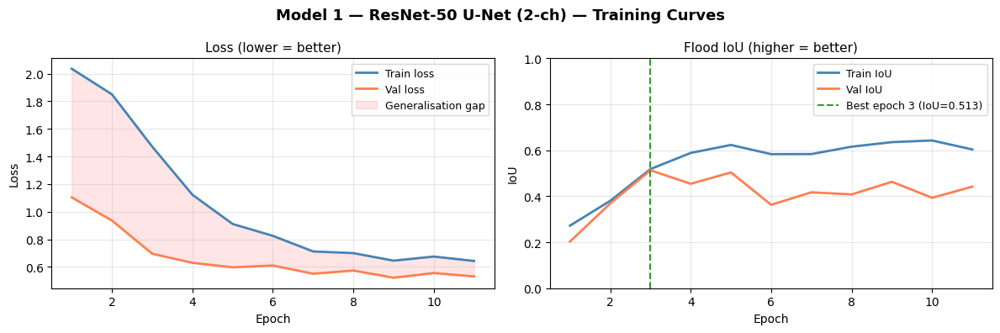

  Best val IoU: 0.5129 at epoch 3


In [33]:
# ============================================================
# CELL 32 — Model 1 training curves
# ============================================================
plot_training_curves(
    history1, "Model 1 — ResNet-50 U-Net (2-ch)",
    save_path='/content/fig_m1_training_curves.png'
)


In [34]:
import torch

# ============================================================
# CELL 33 — Load best Model 1 checkpoint
# ============================================================
checkpoint = torch.load(ckpt1, map_location=device, weights_only=False)
model1.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded best checkpoint from epoch {checkpoint['epoch']}")
print(f"Best val IoU: {checkpoint['val_iou']:.4f}")

Loaded best checkpoint from epoch 3
Best val IoU: 0.5129


Best threshold : 0.625
Best val IoU   : 0.5942  (was 0.5544 at 0.5)

Model 1 will use threshold=0.625 for test evaluation


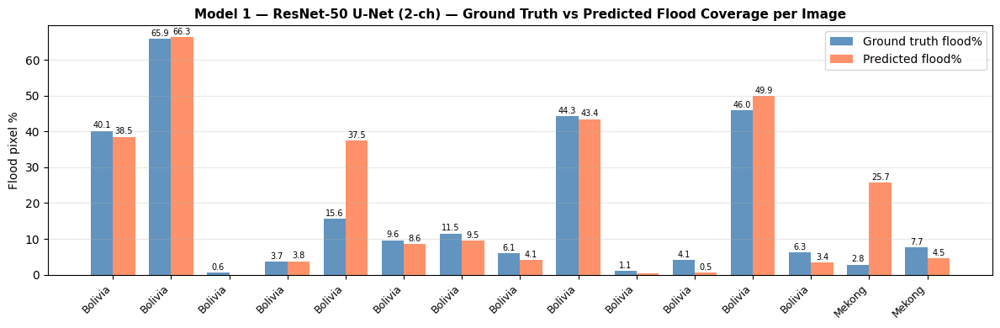

In [35]:
# ============================================================
# CELL 34 — Threshold tuning + prediction bar chart
# ============================================================
# Step 1: find optimal threshold on val set
best_thresh1, best_val_iou_thresh1 = find_best_threshold(model1, val_loader_2ch, device)
print(f"\nModel 1 will use threshold={best_thresh1:.3f} for test evaluation")

# Redefine plot_prediction_bars with the fix for device mismatch
@torch.no_grad()
def plot_prediction_bars(model, test_dataset, device, model_name="Model",
                          threshold=0.5, n_samples=15, save_path=None):
    """
    Bar chart: for each test image, show ground-truth flood%
    vs predicted flood%.  Easy to explain — no satellite images needed.
    A perfect model has bars the same height for each image.
    """
    model.eval()
    gt_pcts, pred_pcts, filenames = [], [], []

    indices = list(range(min(n_samples, len(test_dataset))))
    # prefer images with some flood
    flood_idx = [i for i in range(len(test_dataset))
                 if (test_dataset[i][1] == 1).sum() > 200]
    if len(flood_idx) >= n_samples:
        indices = flood_idx[:n_samples]

    for idx in indices:
        img, mask = test_dataset[idx]
        fname = test_dataset.get_filename(idx)
        region = fname.split('_')[0]

        img_t  = img.unsqueeze(0).to(device)
        logits = model(img_t)
        pred   = (torch.sigmoid(logits) > threshold).float().squeeze()

        # FIX: Move mask to the device before using it for valid calculation
        mask = mask.to(device)

        valid = (mask[0] != -1)
        gt_flood  = (mask[0] == 1) & valid
        pr_flood  = (pred == 1) & valid
        total_valid = valid.sum().item()

        gt_pct  = 100.0 * gt_flood.sum().item()  / max(total_valid, 1)
        pr_pct  = 100.0 * pr_flood.sum().item()  / max(total_valid, 1)
        gt_pcts.append(gt_pct)
        pred_pcts.append(pr_pct)
        filenames.append(region)

    x    = np.arange(len(indices))
    w    = 0.38
    fig, ax = plt.subplots(figsize=(max(10, len(indices)*0.8), 4))
    b1 = ax.bar(x - w/2, gt_pcts,   width=w, color='steelblue', alpha=0.85, label='Ground truth flood%')
    b2 = ax.bar(x + w/2, pred_pcts, width=w, color='coral',     alpha=0.85, label='Predicted flood%')
    ax.set_xticks(x)
    ax.set_xticklabels(filenames, rotation=45, ha='right', fontsize=9)
    ax.set_ylabel('Flood pixel %')
    ax.set_title(f'{model_name} — Ground Truth vs Predicted Flood Coverage per Image',
                 fontsize=11, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    for bar in list(b1) + list(b2):
        h = bar.get_height()
        if h > 0.5:
            ax.text(bar.get_x() + bar.get_width()/2, h + 0.3,
                    f'{h:.1f}', ha='center', va='bottom', fontsize=7)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
    plt.show()

# Step 2: simple bar-chart prediction plot (replaces satellite image grid)
# Shows: for each test image, how much flood did GT have vs what model predicted
plot_prediction_bars(
    model1, test_ds_2ch, device,
    model_name = "Model 1 — ResNet-50 U-Net (2-ch)",
    threshold  = best_thresh1,
    n_samples  = 15,
    save_path  = '/content/fig_m1_pred_bars.png'
)


In [36]:
# ============================================================
# CELL 35 — Model 1 test evaluation with tuned threshold
# ============================================================
from collections import defaultdict

@torch.no_grad()
def evaluate_test_set_thresh(model, test_dataset, test_loader, criterion,
                              device, model_name, threshold=0.5):
    model.eval()
    all_metrics    = []
    region_metrics = defaultdict(list)

    for batch_idx, (imgs, masks) in enumerate(test_loader):
        imgs  = imgs.to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)
        preds = model(imgs)

        batch_start = batch_idx * test_loader.batch_size
        batch_end   = min(batch_start + imgs.shape[0], len(test_dataset))

        for i, global_idx in enumerate(range(batch_start, batch_end)):
            fname  = test_dataset.get_filename(global_idx)
            region = fname.split('_')[0]
            m      = compute_metrics(preds[i:i+1], masks[i:i+1], threshold=threshold)
            all_metrics.append(m)
            region_metrics[region].append(m)

    gm = aggregate_metrics(all_metrics)

    print(f"\n{'='*55}")
    print(f"{model_name} — TEST RESULTS  (threshold={threshold:.3f})")
    print(f"{'='*55}")
    print(f"  IoU       : {gm['iou']:.4f}")
    print(f"  Dice      : {gm['dice']:.4f}")
    print(f"  F1        : {gm['f1']:.4f}")
    print(f"  Precision : {gm['precision']:.4f}")
    print(f"  Recall    : {gm['recall']:.4f}")
    print(f"\n  Per-region IoU:")
    print(f"  {'Region':<14} {'Images':>6} {'IoU':>7} {'Prec':>7} {'Rec':>7}")
    print(f"  {'-'*45}")
    for region in sorted(region_metrics.keys()):
        rm = aggregate_metrics(region_metrics[region])
        print(f"  {region:<14} {len(region_metrics[region]):>6} "
              f"{rm['iou']:>7.4f} {rm['precision']:>7.4f} {rm['recall']:>7.4f}")
    return gm, region_metrics

test_m1, region_m1 = evaluate_test_set_thresh(
    model1, test_ds_2ch, test_loader_2ch, criterion1,
    device, "Model 1 — ResNet-50 U-Net (2-ch)", threshold=best_thresh1
)


Model 1 — ResNet-50 U-Net (2-ch) — TEST RESULTS  (threshold=0.625)
  IoU       : 0.3436
  Dice      : 0.4153
  F1        : 0.4153
  Precision : 0.4225
  Recall    : 0.5072

  Per-region IoU:
  Region         Images     IoU    Prec     Rec
  ---------------------------------------------
  Bolivia            15  0.3947  0.5420  0.4886
  Mekong             30  0.5117  0.6070  0.6177
  Nigeria            18  0.3368  0.4188  0.4367
  Somalia            26  0.1247  0.1434  0.4392


✅ plot_model_analysis defined


/tmp/ipykernel_1140/3786606167.py:155: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.74, 1.0])


Saved: /content/fig_m1_visual_analysis.png


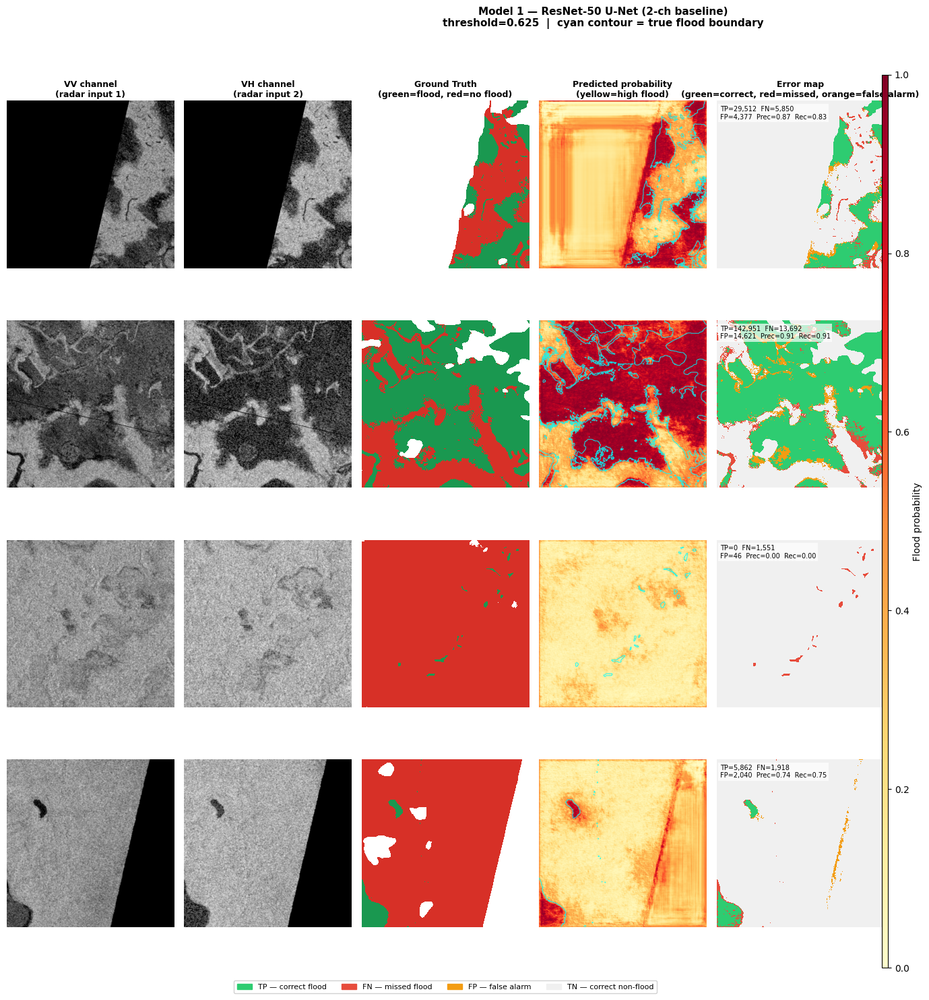

In [37]:
# ============================================================
# Model 1 — Visual Result Analysis
# Layout per sample (5 columns):
#   Col 1  VV channel (normalised)  — the radar backscatter input
#   Col 2  VH channel (normalised)  — second polarisation input
#   Col 3  Ground Truth mask        — green=flood, red=non-flood, grey=ignore
#   Col 4  Predicted probability    — heatmap 0→1 (yellow=high flood prob)
#   Col 5  Error map                — green=TP, red=FN(missed), orange=FP(false alarm)
#
# n_samples : how many test images to show (picks images with flood pixels)
# threshold : same value used in test evaluation (best_thresh1)
# ============================================================
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

@torch.no_grad()
def plot_model_analysis(model, dataset, device, model_name,
                        threshold=0.5, n_samples=4, save_path=None):
    """
    5-column visual analysis grid.
    Selects test images that have a meaningful flood area so every
    row actually shows something — skips near-empty images.
    """
    model.eval()

    # ── pick images with enough flood pixels ──
    flood_indices = []
    for i in range(len(dataset)):
        _, m = dataset[i]
        if (m == 1).sum() > 500:           # at least 500 flood pixels
            flood_indices.append(i)
        if len(flood_indices) == n_samples:
            break
    # fallback: just take first n_samples if not enough flood images
    if len(flood_indices) < n_samples:
        flood_indices = list(range(min(n_samples, len(dataset))))

    n = len(flood_indices)
    fig, axes = plt.subplots(n, 5, figsize=(18, n * 3.6))
    if n == 1:
        axes = axes[np.newaxis, :]   # ensure 2-D even for 1 sample

    # ── column headers ──
    col_titles = [
        "VV channel\n(radar input 1)",
        "VH channel\n(radar input 2)",
        "Ground Truth\n(green=flood, red=no flood)",
        "Predicted probability\n(yellow=high flood)",
        "Error map\n(green=correct, red=missed, orange=false alarm)"
    ]
    for ax, title in zip(axes[0], col_titles):
        ax.set_title(title, fontsize=9, fontweight="bold", pad=4)

    # ── colour map for GT: grey for ignore(-1), red=0, green=1 ──
    gt_colors  = ["#d73027", "#1a9850"]          # red=non-flood, green=flood
    gt_cmap    = ListedColormap(gt_colors)

    for row, idx in enumerate(flood_indices):
        img, mask = dataset[idx]
        fname     = dataset.get_filename(idx)
        region    = fname.split("_")[0]

        # forward pass
        logits = model(img.unsqueeze(0).to(device))
        prob   = torch.sigmoid(logits).squeeze().cpu().numpy()   # (H, W)
        pred   = (prob > threshold).astype(np.uint8)              # binary
        mask_np = mask[0].numpy()                                  # (H, W)

        vv_img = img[0].numpy()
        vh_img = img[1].numpy()

        valid   = (mask_np != -1)
        target  = (mask_np == 1)

        # ── error map: 0=TN(ignored in display), 1=TP, 2=FN, 3=FP ──
        error = np.zeros_like(mask_np, dtype=np.uint8)
        error[valid & (pred==1) & target]  = 1   # TP — correct flood
        error[valid & (pred==0) & target]  = 2   # FN — missed flood
        error[valid & (pred==1) & ~target] = 3   # FP — false alarm
        # TN (correct non-flood) left as 0 — shown as light background

        error_cmap = ListedColormap(["#f0f0f0", "#2ecc71", "#e74c3c", "#f39c12"])

        # ── compute per-image metrics for row label ──
        tp = int(((pred==1) & target & valid).sum())
        fp = int(((pred==1) & ~target & valid).sum())
        fn = int(((pred==0) & target & valid).sum())
        eps = 1e-7
        iou  = tp / (tp + fp + fn + eps)
        prec = tp / (tp + fp + eps)
        rec  = tp / (tp + fn + eps)

        # ── Col 0: VV ──
        axes[row, 0].imshow(vv_img, cmap="gray", vmin=0, vmax=1)
        axes[row, 0].set_ylabel(f"{region}\nIoU={iou:.2f}",
                                 fontsize=8, rotation=90, va="center",
                                 labelpad=4)

        # ── Col 1: VH ──
        axes[row, 1].imshow(vh_img, cmap="gray", vmin=0, vmax=1)

        # ── Col 2: Ground Truth (only valid pixels) ──
        gt_display = np.ma.masked_where(mask_np == -1, mask_np)
        axes[row, 2].imshow(gt_display, cmap=gt_cmap, vmin=0, vmax=1,
                             interpolation="nearest")

        # ── Col 3: Predicted probability heatmap ──
        im = axes[row, 3].imshow(prob, cmap="YlOrRd", vmin=0, vmax=1)
        # thin cyan contour = ground-truth flood boundary (for reference)
        if target.any():
            axes[row, 3].contour(target, levels=[0.5],
                                  colors="cyan", linewidths=0.8, alpha=0.8)

        # ── Col 4: Error map ──
        axes[row, 4].imshow(error, cmap=error_cmap, vmin=0, vmax=3,
                             interpolation="nearest")
        # annotate with pixel counts
        axes[row, 4].text(0.02, 0.97,
                          f"TP={tp:,}  FN={fn:,}\nFP={fp:,}  "
                          f"Prec={prec:.2f}  Rec={rec:.2f}",
                          transform=axes[row, 4].transAxes,
                          fontsize=7, va="top", color="black",
                          bbox=dict(facecolor="white", alpha=0.7,
                                    edgecolor="none", pad=2))

        for ax in axes[row]:
            ax.axis("off")

    # ── shared colorbar for probability map (col 3) ──
    cbar_ax = fig.add_axes([0.73, 0.02, 0.005, 0.92])
    sm = plt.cm.ScalarMappable(cmap="YlOrRd",
                                norm=plt.Normalize(vmin=0, vmax=1))
    sm.set_array([])
    fig.colorbar(sm, cax=cbar_ax, label="Flood probability")

    # ── legend for error map ──
    patches = [
        mpatches.Patch(color="#2ecc71", label="TP — correct flood"),
        mpatches.Patch(color="#e74c3c", label="FN — missed flood"),
        mpatches.Patch(color="#f39c12", label="FP — false alarm"),
        mpatches.Patch(color="#f0f0f0", label="TN — correct non-flood"),
    ]
    fig.legend(handles=patches, loc="lower center", ncol=4,
               fontsize=8, framealpha=0.9,
               bbox_to_anchor=(0.37, -0.01))

    fig.suptitle(
        f"{model_name}\n"
        f"threshold={threshold:.3f}  |  cyan contour = true flood boundary",
        fontsize=11, fontweight="bold", y=1.01
    )
    plt.tight_layout(rect=[0, 0.03, 0.74, 1.0])
    if save_path:
        plt.savefig(save_path, dpi=130, bbox_inches="tight")
        print(f"Saved: {save_path}")
    plt.show()

print("✅ plot_model_analysis defined")

# ── Run for Model 1 ──
plot_model_analysis(
    model1, test_ds_2ch, device,
    model_name = "Model 1 — ResNet-50 U-Net (2-ch baseline)",
    threshold  = best_thresh1,
    n_samples  = 4,
    save_path  = "/content/fig_m1_visual_analysis.png"
)


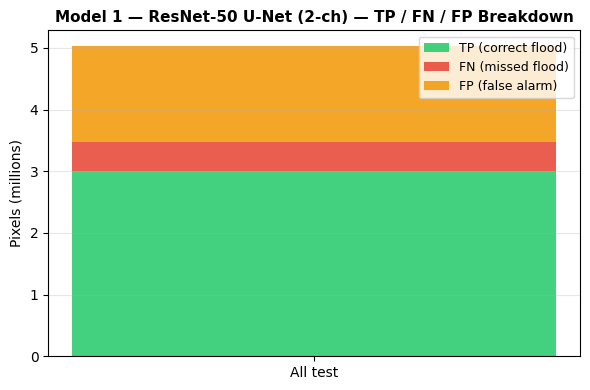

In [38]:
# ============================================================
# CELL 35b — Model 1 confusion breakdown (TP/FP/FN bar chart)
# ============================================================
plot_confusion_breakdown(
    model1, test_loader_2ch, device,
    model_name = "Model 1 — ResNet-50 U-Net (2-ch)",
    threshold  = best_thresh1,
    save_path  = '/content/fig_m1_confusion.png'
)


---
## Section 7 — Model 2: ResNet-34 U-Net + Physics Channels (5-channel)

**Architecture:** Same ResNet-34 U-Net, `in_channels=5`  
**Input:** `(VV, VH, VV×VH, VV−VH, RVI)` — 5 channels  
**Purpose:** Ablation study — quantifies how much the physics-derived features improve over raw polarizations alone.  
**Note:** First encoder conv is re-initialized (5-ch vs ImageNet's 3-ch) but all subsequent encoder weights start from ImageNet pretraining.

In [39]:
# ============================================================
# CELL 36 — Build Model 2
# ResNet-50 U-Net, 5-channel input (VV, VH, PR, RVI, NDSI)
# Initialised from trained M1 weights (transfer from M1 → M2).
# Anti-overfitting changes:
#   - Dropout2d(0.2) in decoder (same as M1)
#   - Physics channels initialised more conservatively (scale 0.1)
#     so they start near-zero and are learned gradually
# ============================================================
import segmentation_models_pytorch as smp
import torch.nn as nn

# Load M1 checkpoint
checkpoint1 = torch.load(ckpt1, map_location='cpu', weights_only=False)
m1_state    = checkpoint1['model_state_dict']

# Build 5-channel model
model2 = smp.Unet(
    encoder_name    = "resnet50",
    encoder_weights = None,
    in_channels     = 5,
    classes         = 1,
    activation      = None,
    decoder_use_batchnorm = True,
).to(device)

# Inject same Dropout2d regularisation as M1
for block in model2.decoder.blocks:
    block.conv1 = nn.Sequential(block.conv1, nn.Dropout2d(p=0.2))

# Copy M1 weights
m2_state = model2.state_dict()
skipped, copied = [], []
for key in m1_state:
    if key not in m2_state:
        skipped.append(key); continue
    if m2_state[key].shape != m1_state[key].shape:
        skipped.append(key)
    else:
        m2_state[key] = m1_state[key].clone()
        copied.append(key)

print(f"Copied  : {len(copied)} tensors")
print(f"Skipped : {len(skipped)} tensors  (first conv shape mismatch expected)")

# Extend first conv 2-ch → 5-ch
first_conv_key = [k for k in skipped if 'conv1.weight' in k or
                  ('layer0' in k and 'weight' in k)][0]
w_m1 = m1_state[first_conv_key]           # (64, 2, 7, 7)
w_m2 = m2_state[first_conv_key].clone()   # (64, 5, 7, 7)

w_m2[:, 0, :, :] = w_m1[:, 0, :, :]                       # VV  — direct copy
w_m2[:, 1, :, :] = w_m1[:, 1, :, :]                       # VH  — direct copy
# Physics channels: start very small (0.1 scale) so they don't
# disrupt the learned VV/VH features immediately — they grow during fine-tuning
w_m2[:, 2, :, :] = (w_m1[:, 0] + w_m1[:, 1]) / 2 * 0.1   # PR  — mean, tiny scale
w_m2[:, 3, :, :] = w_m1[:, 1] * 0.1                       # RVI — VH proxy, tiny
w_m2[:, 4, :, :] = (w_m1[:, 0] - w_m1[:, 1]) * 0.1       # NDSI — diff, tiny

m2_state[first_conv_key] = w_m2
model2.load_state_dict(m2_state)
model2 = model2.to(device)

with torch.no_grad():
    dummy = torch.randn(2, 5, 512, 512).to(device)
    out   = model2(dummy)
print(f"Forward pass OK: in={dummy.shape}  out={out.shape}")
del dummy, out
print("✅ Model 2 ready")


Copied  : 379 tensors
Skipped : 1 tensors  (first conv shape mismatch expected)
Forward pass OK: in=torch.Size([2, 5, 512, 512])  out=torch.Size([2, 1, 512, 512])
✅ Model 2 ready


In [40]:
# ============================================================
# CELL 37 — Loss for Model 2 (identical to M1 — clean ablation)
# ============================================================
criterion2 = MaskedBCETverskyLoss(
    pos_weight = torch.tensor([POS_WEIGHT]).to(device),
    alpha      = 0.4,
    beta       = 0.6
)
print("Loss: BCE + Tversky(α=0.4, β=0.6)  — identical to M1")
print("→ Only difference from M1 is input channels (2 vs 5)")
print("  This keeps the ablation clean — isolates the physics channel effect")

Loss: BCE + Tversky(α=0.4, β=0.6)  — identical to M1
→ Only difference from M1 is input channels (2 vs 5)
  This keeps the ablation clean — isolates the physics channel effect


In [41]:
from torch.optim.lr_scheduler import SequentialLR, LinearLR, CosineAnnealingLR
import time, os

N_EPOCHS_M2 = 35
FREEZE_EP_M2 = 8
PATIENCE_M2  = 8

# Freeze encoder initially — all encoder parameters
for p in model2.encoder.parameters():
    p.requires_grad = False

# Un-freeze the first conv module itself and collect its parameters for the optimizer
first_conv_trainable_params = []
for name, mod in model2.encoder.named_modules():
    if hasattr(mod, 'weight') and mod.weight is not None:
        # Check if this module is the 5-channel conv1
        if mod.weight.shape[1] == 5:   # the 5-ch conv
            for p in mod.parameters():
                p.requires_grad = True
                first_conv_trainable_params.append(p)
            print(f"  First conv ({name}) unfrozen — physics channels need gradient")
            break # Assuming there's only one such first conv

optimizer2 = torch.optim.AdamW([
    {'params': [p for p in model2.decoder.parameters() if p.requires_grad],
     'lr': 5e-5},
    {'params': [p for p in model2.segmentation_head.parameters() if p.requires_grad],
     'lr': 5e-5},
    {'params': first_conv_trainable_params, # Use the collected params here
     'lr': 5e-5},
], weight_decay=2e-4)

warmup2    = LinearLR(optimizer2, start_factor=0.2, end_factor=1.0, total_iters=3)
cosine2    = CosineAnnealingLR(optimizer2, T_max=N_EPOCHS_M2 - 3, eta_min=1e-7)
scheduler2 = SequentialLR(optimizer2, schedulers=[warmup2, cosine2], milestones=[3])

os.makedirs('/content/checkpoints', exist_ok=True)
best_val_iou2 = 0.0
no_improve2   = 0
ckpt2         = '/content/checkpoints/Model2_ResNet50_UNet_5ch_best.pth'
history2      = {k: [] for k in ['train_loss','val_loss','train_iou','val_iou',
                                   'train_dice','val_dice','lr']}

print(f"{'='*65}")
print(f"Training Model 2 — ResNet-50 U-Net (5-ch physics)")
print(f"  Starting from M1 val IoU={best_val_iou1:.4f}")
print(f"  Epochs: {N_EPOCHS_M2}  |  Freeze: {FREEZE_EP_M2}  |  Patience: {PATIENCE_M2}")
print(f"{'='*65}")
print(f"{'Ep':>4} {'TrLoss':>8} {'TrIoU':>7} {'VaLoss':>8} {'VaIoU':>7} {'VaDice':>7}")
print("-" * 55)

start = time.time()
for epoch in range(1, N_EPOCHS_M2 + 1):

    if epoch == FREEZE_EP_M2 + 1:
        # Unfreeze all remaining encoder parameters
        remaining_encoder_params_to_add = []
        for p in model2.encoder.parameters():
            if not p.requires_grad: # Check if parameter is still frozen
                p.requires_grad = True
                remaining_encoder_params_to_add.append(p)

        if remaining_encoder_params_to_add: # Only add if there are new params to add
            optimizer2.add_param_group({'params': remaining_encoder_params_to_add, 'lr': 2e-6})
            print(f"  [Epoch {epoch}] Full encoder unfrozen — added lr=2e-6 param group for {len(remaining_encoder_params_to_add)} parameters")
        else:
            print(f"  [Epoch {epoch}] Full encoder unfrozen — no additional parameters to add to optimizer.")

    tr_loss, tr_m = train_one_epoch(model2, train_loader_5ch, optimizer2,
                                    criterion2, device)
    va_loss, va_m = evaluate(model2, val_loader_5ch, criterion2, device)
    scheduler2.step()
    lr_now = optimizer2.param_groups[0]['lr']

    history2['train_loss'].append(tr_loss)
    history2['val_loss'].append(va_loss)
    history2['train_iou'].append(tr_m['iou'])
    history2['val_iou'].append(va_m['iou'])
    history2['train_dice'].append(tr_m['dice'])
    history2['val_dice'].append(va_m['dice'])
    history2['lr'].append(lr_now)

    flag = ""
    if va_m['iou'] > best_val_iou2:
        best_val_iou2 = va_m['iou']
        no_improve2   = 0
        torch.save({'epoch': epoch, 'model_state_dict': model2.state_dict(),
                    'val_iou': best_val_iou2}, ckpt2)
        flag = "⬆ best"
    else:
        no_improve2 += 1

    if epoch % 5 == 0 or epoch == 1 or flag:
        print(f"{epoch:>4} {tr_loss:>8.4f} {tr_m['iou']:>7.4f} "
              f"{va_loss:>8.4f} {va_m['iou']:>7.4f} {va_m['dice']:>7.4f}  {flag}")

    if no_improve2 >= PATIENCE_M2:
        print(f"\n  Early stop at epoch {epoch}")
        break

print(f"\nDone in {(time.time()-start)/60:.1f} min  |  Best val IoU: {best_val_iou2:.4f}")

  First conv (conv1) unfrozen — physics channels need gradient
Training Model 2 — ResNet-50 U-Net (5-ch physics)
  Starting from M1 val IoU=0.5129
  Epochs: 35  |  Freeze: 8  |  Patience: 8
  Ep   TrLoss   TrIoU   VaLoss   VaIoU  VaDice
-------------------------------------------------------
   1   1.2754  0.5639   0.6840  0.4732  0.6233  ⬆ best
   2   1.1245  0.5711   0.6370  0.4755  0.6253  ⬆ best
   3   1.0275  0.5978   0.5885  0.4974  0.6452  ⬆ best
   5   0.8559  0.6139   0.6479  0.3435  0.4949  
   6   0.8397  0.6278   0.5424  0.4993  0.6465  ⬆ best
  [Epoch 9] Full encoder unfrozen — added lr=2e-6 param group for 158 parameters
  10   0.6724  0.6193   0.5354  0.4558  0.6069  

  Early stop at epoch 14

Done in 6.8 min  |  Best val IoU: 0.4993


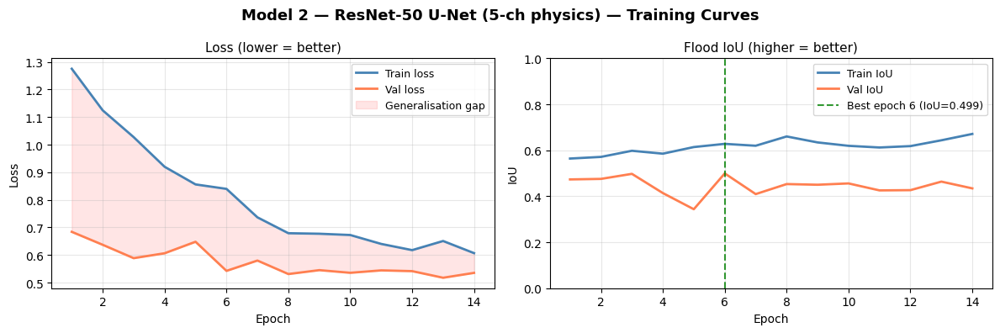

  Best val IoU: 0.4993 at epoch 6


In [42]:
# ============================================================
# CELL 39 — Model 2 training curves
# ============================================================
plot_training_curves(
    history2, "Model 2 — ResNet-50 U-Net (5-ch physics)",
    save_path='/content/fig_m2_training_curves.png'
)


In [43]:
# ============================================================
# CELL 40 — Load best Model 2 checkpoint
# ============================================================
checkpoint2 = torch.load(ckpt2, map_location=device, weights_only=False)
model2.load_state_dict(checkpoint2['model_state_dict'])
print(f"Loaded best checkpoint from epoch {checkpoint2['epoch']}")
print(f"Best val IoU: {checkpoint2['val_iou']:.4f}")

Loaded best checkpoint from epoch 6
Best val IoU: 0.4993


Best threshold : 0.775
Best val IoU   : 0.6363  (was 0.5247 at 0.5)

Model 2 will use threshold=0.775 for test evaluation


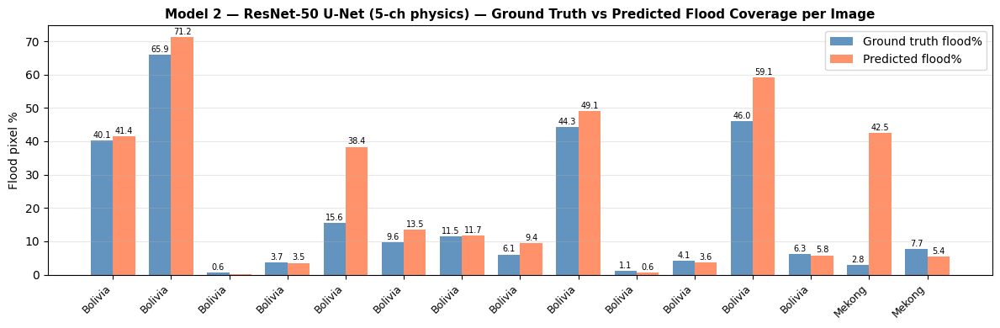

In [44]:
# ============================================================
# CELL 41 — Model 2 threshold tuning + prediction bar chart
# ============================================================
best_thresh2, best_val_iou_thresh2 = find_best_threshold(model2, val_loader_5ch, device)
print(f"\nModel 2 will use threshold={best_thresh2:.3f} for test evaluation")

plot_prediction_bars(
    model2, test_ds_5ch, device,
    model_name = "Model 2 — ResNet-50 U-Net (5-ch physics)",
    threshold  = best_thresh2,
    n_samples  = 15,
    save_path  = '/content/fig_m2_pred_bars.png'
)


In [45]:
# ============================================================
# CELL 42 — Model 2 threshold tuning + test evaluation
# ============================================================
best_thresh2, best_val_iou_thresh2 = find_best_threshold(model2, val_loader_5ch, device)
print(f"\nModel 2 will use threshold={best_thresh2:.3f} for test evaluation")

test_m2, region_m2 = evaluate_test_set_thresh(
    model2, test_ds_5ch, test_loader_5ch, criterion2,
    device, "Model 2 — ResNet-50 U-Net (5-ch physics)", threshold=best_thresh2
)

Best threshold : 0.775
Best val IoU   : 0.6363  (was 0.5247 at 0.5)

Model 2 will use threshold=0.775 for test evaluation

Model 2 — ResNet-50 U-Net (5-ch physics) — TEST RESULTS  (threshold=0.775)
  IoU       : 0.3924
  Dice      : 0.4667
  F1        : 0.4667
  Precision : 0.4625
  Recall    : 0.5943

  Per-region IoU:
  Region         Images     IoU    Prec     Rec
  ---------------------------------------------
  Bolivia            15  0.4639  0.5205  0.6046
  Mekong             30  0.5818  0.6711  0.6928
  Nigeria            18  0.4091  0.5386  0.5322
  Somalia            26  0.1210  0.1357  0.5178


✅ plot_model2_analysis defined


/tmp/ipykernel_1140/3958130913.py:142: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.74, 1.0])


Saved: /content/fig_m2_visual_analysis.png


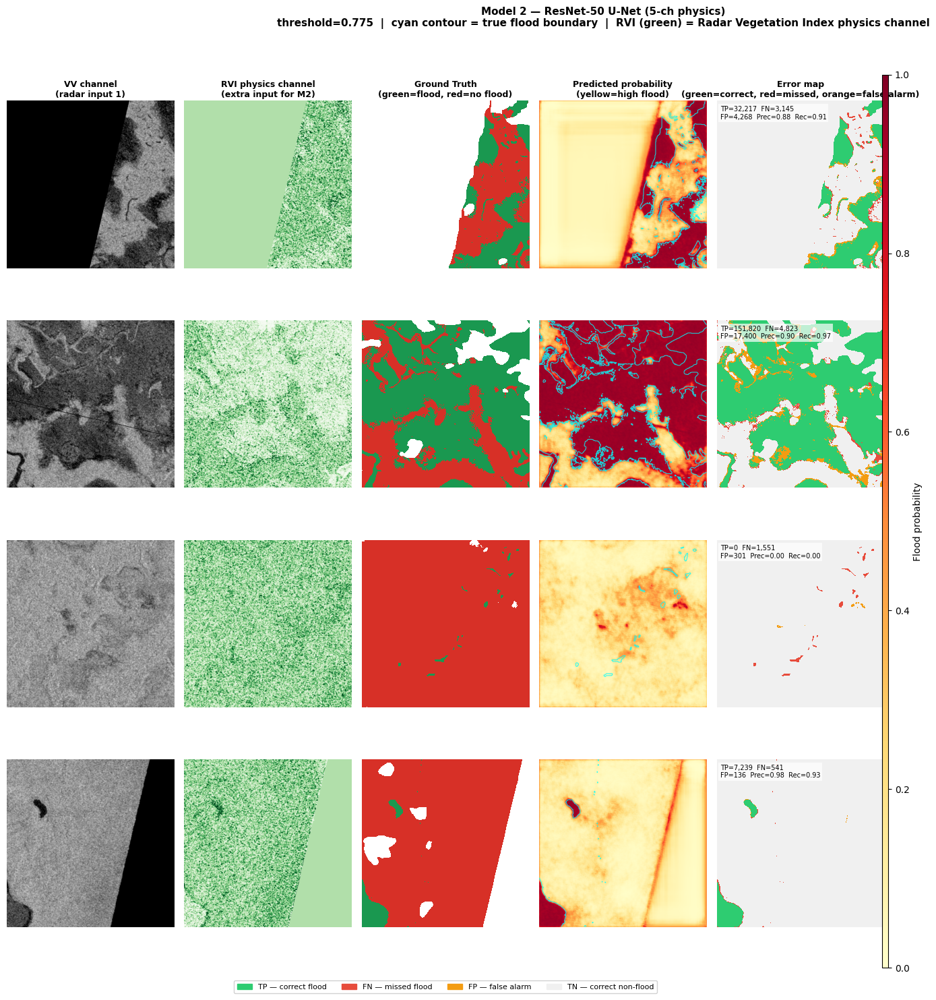

In [46]:
# ============================================================
# Model 2 — Visual Result Analysis
# Identical 5-column layout to Model 1 cell for easy side-by-side
# comparison during presentation.
#
# Extra: Col 1 shows the RVI physics channel instead of VH,
# so you can visually see what the extra input the model is using.
# ============================================================
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

@torch.no_grad()
def plot_model2_analysis(model, dataset, device, model_name,
                         threshold=0.5, n_samples=4, save_path=None):
    """
    Same 5-column layout as Model 1 but Col 1 shows the RVI
    physics channel (channel index 3 in the 5-ch tensor)
    so you can see the extra signal Model 2 receives.
    """
    model.eval()

    flood_indices = []
    for i in range(len(dataset)):
        _, m = dataset[i]
        if (m == 1).sum() > 500:
            flood_indices.append(i)
        if len(flood_indices) == n_samples:
            break
    if len(flood_indices) < n_samples:
        flood_indices = list(range(min(n_samples, len(dataset))))

    n = len(flood_indices)
    fig, axes = plt.subplots(n, 5, figsize=(18, n * 3.6))
    if n == 1:
        axes = axes[np.newaxis, :]

    col_titles = [
        "VV channel\n(radar input 1)",
        "RVI physics channel\n(extra input for M2)",
        "Ground Truth\n(green=flood, red=no flood)",
        "Predicted probability\n(yellow=high flood)",
        "Error map\n(green=correct, red=missed, orange=false alarm)"
    ]
    for ax, title in zip(axes[0], col_titles):
        ax.set_title(title, fontsize=9, fontweight="bold", pad=4)

    gt_colors = ["#d73027", "#1a9850"]
    gt_cmap   = ListedColormap(gt_colors)

    for row, idx in enumerate(flood_indices):
        img, mask = dataset[idx]
        fname     = dataset.get_filename(idx)
        region    = fname.split("_")[0]

        logits  = model(img.unsqueeze(0).to(device))
        prob    = torch.sigmoid(logits).squeeze().cpu().numpy()
        pred    = (prob > threshold).astype(np.uint8)
        mask_np = mask[0].numpy()

        vv_img  = img[0].numpy()   # channel 0: VV
        rvi_img = img[3].numpy()   # channel 3: RVI (physics)

        valid  = (mask_np != -1)
        target = (mask_np == 1)

        error = np.zeros_like(mask_np, dtype=np.uint8)
        error[valid & (pred==1) & target]  = 1
        error[valid & (pred==0) & target]  = 2
        error[valid & (pred==1) & ~target] = 3

        error_cmap = ListedColormap(["#f0f0f0", "#2ecc71", "#e74c3c", "#f39c12"])

        tp = int(((pred==1) & target & valid).sum())
        fp = int(((pred==1) & ~target & valid).sum())
        fn = int(((pred==0) & target & valid).sum())
        eps = 1e-7
        iou  = tp / (tp + fp + fn + eps)
        prec = tp / (tp + fp + eps)
        rec  = tp / (tp + fn + eps)

        # ── Col 0: VV ──
        axes[row, 0].imshow(vv_img, cmap="gray", vmin=0, vmax=1)
        axes[row, 0].set_ylabel(f"{region}\nIoU={iou:.2f}",
                                 fontsize=8, rotation=90, va="center",
                                 labelpad=4)

        # ── Col 1: RVI physics channel (replaces VH) ──
        axes[row, 1].imshow(rvi_img, cmap="Greens", vmin=0, vmax=1)

        # ── Col 2: Ground Truth ──
        gt_display = np.ma.masked_where(mask_np == -1, mask_np)
        axes[row, 2].imshow(gt_display, cmap=gt_cmap, vmin=0, vmax=1,
                             interpolation="nearest")

        # ── Col 3: Predicted probability ──
        axes[row, 3].imshow(prob, cmap="YlOrRd", vmin=0, vmax=1)
        if target.any():
            axes[row, 3].contour(target, levels=[0.5],
                                  colors="cyan", linewidths=0.8, alpha=0.8)

        # ── Col 4: Error map ──
        axes[row, 4].imshow(error, cmap=error_cmap, vmin=0, vmax=3,
                             interpolation="nearest")
        axes[row, 4].text(0.02, 0.97,
                          f"TP={tp:,}  FN={fn:,}\nFP={fp:,}  "
                          f"Prec={prec:.2f}  Rec={rec:.2f}",
                          transform=axes[row, 4].transAxes,
                          fontsize=7, va="top", color="black",
                          bbox=dict(facecolor="white", alpha=0.7,
                                    edgecolor="none", pad=2))

        for ax in axes[row]:
            ax.axis("off")

    # ── colorbar for probability ──
    cbar_ax = fig.add_axes([0.73, 0.02, 0.005, 0.92])
    sm = plt.cm.ScalarMappable(cmap="YlOrRd",
                                norm=plt.Normalize(vmin=0, vmax=1))
    sm.set_array([])
    fig.colorbar(sm, cax=cbar_ax, label="Flood probability")

    # ── legend ──
    patches = [
        mpatches.Patch(color="#2ecc71", label="TP — correct flood"),
        mpatches.Patch(color="#e74c3c", label="FN — missed flood"),
        mpatches.Patch(color="#f39c12", label="FP — false alarm"),
        mpatches.Patch(color="#f0f0f0", label="TN — correct non-flood"),
    ]
    fig.legend(handles=patches, loc="lower center", ncol=4,
               fontsize=8, framealpha=0.9,
               bbox_to_anchor=(0.37, -0.01))

    fig.suptitle(
        f"{model_name}\n"
        f"threshold={threshold:.3f}  |  cyan contour = true flood boundary  |  "
        f"RVI (green) = Radar Vegetation Index physics channel",
        fontsize=11, fontweight="bold", y=1.01
    )
    plt.tight_layout(rect=[0, 0.03, 0.74, 1.0])
    if save_path:
        plt.savefig(save_path, dpi=130, bbox_inches="tight")
        print(f"Saved: {save_path}")
    plt.show()

print("✅ plot_model2_analysis defined")

# ── Run for Model 2 ──
plot_model2_analysis(
    model2, test_ds_5ch, device,
    model_name = "Model 2 — ResNet-50 U-Net (5-ch physics)",
    threshold  = best_thresh2,
    n_samples  = 4,
    save_path  = "/content/fig_m2_visual_analysis.png"
)


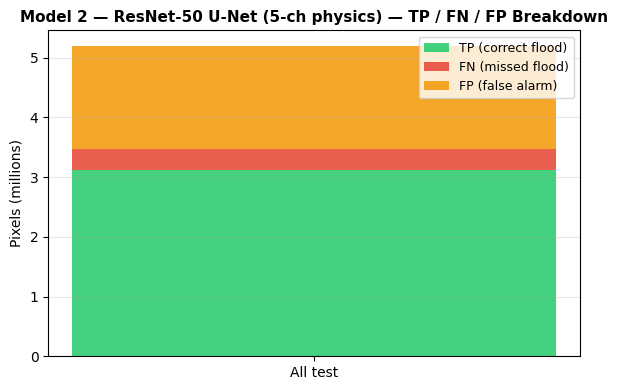

In [47]:
# ============================================================
# CELL 42b — Model 2 confusion breakdown
# ============================================================
plot_confusion_breakdown(
    model2, test_loader_5ch, device,
    model_name = "Model 2 — ResNet-50 U-Net (5-ch physics)",
    threshold  = best_thresh2,
    save_path  = '/content/fig_m2_confusion.png'
)


---
## Section 8 — Model Comparison (M1 vs M2)

Quantitative ablation: does adding physics channels help?

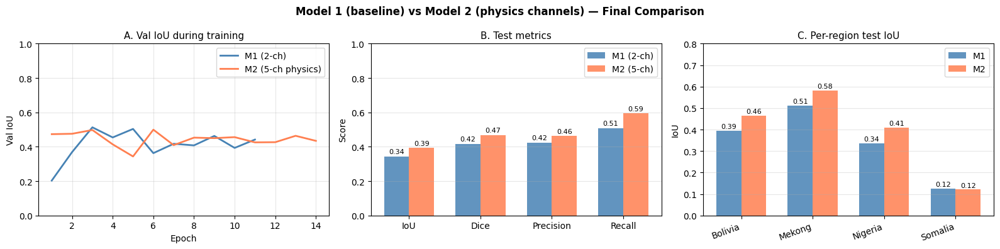


Test Results Summary
Metric          M1 (2-ch)    M2 (5-ch)    Δ (M2−M1)
--------------------------------------------------
IoU                0.3436       0.3924     +0.0488 ↑
Dice               0.4153       0.4667     +0.0514 ↑
Precision          0.4225       0.4625     +0.0400 ↑
Recall             0.5072       0.5943     +0.0871 ↑


In [48]:
# ============================================================
# CELL 43 — M1 vs M2 comparison (simple, clean, explainable)
# 3 panels:
#   A. Val IoU over training — shows learning progress
#   B. Test metrics bar chart — direct comparison
#   C. Per-region IoU — shows where each model is stronger
# ============================================================
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle('Model 1 (baseline) vs Model 2 (physics channels) — Final Comparison',
             fontsize=12, fontweight='bold')

# ── Panel A: Val IoU over epochs ──
ep1 = range(1, len(history1['val_iou']) + 1)
ep2 = range(1, len(history2['val_iou']) + 1)
axes[0].plot(ep1, history1['val_iou'], label='M1 (2-ch)',        color='steelblue', linewidth=2)
axes[0].plot(ep2, history2['val_iou'], label='M2 (5-ch physics)', color='coral',     linewidth=2)
axes[0].set_title('A. Val IoU during training', fontsize=11)
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Val IoU')
axes[0].legend(); axes[0].grid(alpha=0.3)
axes[0].set_ylim(0, 1.0)

# ── Panel B: Test metrics comparison ──
metrics = ['IoU', 'Dice', 'Precision', 'Recall']
m1_vals = [test_m1['iou'], test_m1['dice'], test_m1['precision'], test_m1['recall']]
m2_vals = [test_m2['iou'], test_m2['dice'], test_m2['precision'], test_m2['recall']]
x = np.arange(len(metrics)); w = 0.35
b1 = axes[1].bar(x - w/2, m1_vals, w, label='M1 (2-ch)',  color='steelblue', alpha=0.85)
b2 = axes[1].bar(x + w/2, m2_vals, w, label='M2 (5-ch)',  color='coral',     alpha=0.85)
axes[1].set_xticks(x); axes[1].set_xticklabels(metrics)
axes[1].set_ylim(0, 1.0); axes[1].set_title('B. Test metrics', fontsize=11)
axes[1].set_ylabel('Score')
axes[1].legend(); axes[1].grid(axis='y', alpha=0.3)
for bar in list(b1) + list(b2):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                 f'{bar.get_height():.2f}', ha='center', va='bottom', fontsize=8)

# ── Panel C: Per-region IoU ──
regions = ['Bolivia', 'Mekong', 'Nigeria', 'Somalia']
m1_reg = [region_m1[r] if isinstance(region_m1[r], float)
          else sum(d['iou'] for d in region_m1[r])/len(region_m1[r])
          for r in regions]
m2_reg = [region_m2[r] if isinstance(region_m2[r], float)
          else sum(d['iou'] for d in region_m2[r])/len(region_m2[r])
          for r in regions]
xr = np.arange(len(regions))
br1 = axes[2].bar(xr - w/2, m1_reg, w, label='M1', color='steelblue', alpha=0.85)
br2 = axes[2].bar(xr + w/2, m2_reg, w, label='M2', color='coral',     alpha=0.85)
axes[2].set_xticks(xr); axes[2].set_xticklabels(regions, rotation=20, ha='right')
axes[2].set_ylim(0, 0.8); axes[2].set_title('C. Per-region test IoU', fontsize=11)
axes[2].set_ylabel('IoU'); axes[2].legend(); axes[2].grid(axis='y', alpha=0.3)
for bar in list(br1) + list(br2):
    axes[2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                 f'{bar.get_height():.2f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig('/content/fig_m1_vs_m2_comparison.png', dpi=120, bbox_inches='tight')
plt.show()

# ── Summary table ──
print("\n" + "="*55)
print("Test Results Summary")
print("="*55)
print(f"{'Metric':<12} {'M1 (2-ch)':>12} {'M2 (5-ch)':>12} {'Δ (M2−M1)':>12}")
print("-"*50)
for k, label in [('iou','IoU'), ('dice','Dice'), ('precision','Precision'), ('recall','Recall')]:
    d = test_m2[k] - test_m1[k]
    arrow = "↑" if d > 0.002 else ("↓" if d < -0.002 else "→")
    print(f"{label:<12} {test_m1[k]:>12.4f} {test_m2[k]:>12.4f} {d:>+11.4f} {arrow}")


In [49]:
# ============================================================
# CELL 47 — Final summary printout
# ============================================================
print("=" * 65)
print("FINAL RESULTS SUMMARY")
print("=" * 65)

for name, gm, hist in [
        ("Model 1 — ResNet-34 U-Net (2-ch)",         test_m1, history1),
        ("Model 2 — ResNet-34 U-Net (5-ch physics)",  test_m2, history2)]:
    best_val_ep  = int(np.argmax(hist['val_iou'])) + 1
    best_val_iou = max(hist['val_iou'])
    print(f"\n{name}")
    print(f"  Best val IoU (ep {best_val_ep:>2}): {best_val_iou:.4f}")
    print(f"  Test IoU          : {gm['iou']:.4f}")
    print(f"  Test Dice         : {gm['dice']:.4f}")
    print(f"  Test F1           : {gm['f1']:.4f}")
    print(f"  Test Precision    : {gm['precision']:.4f}")
    print(f"  Test Recall       : {gm['recall']:.4f}")

delta_iou  = test_m2['iou']  - test_m1['iou']
delta_dice = test_m2['dice'] - test_m1['dice']
print(f"\nAblation (M2 − M1):")
print(f"  ΔIoU  = {delta_iou:+.4f}")
print(f"  ΔDice = {delta_dice:+.4f}")
if delta_iou > 0:
    print("  ✅ Physics channels improve over raw polarizations")
else:
    print("  ⚠️  No improvement from physics channels on this subset")
print("\n→ These results feed directly into the M3 (CPFG-Net) motivation.")

FINAL RESULTS SUMMARY

Model 1 — ResNet-34 U-Net (2-ch)
  Best val IoU (ep  3): 0.5129
  Test IoU          : 0.3436
  Test Dice         : 0.4153
  Test F1           : 0.4153
  Test Precision    : 0.4225
  Test Recall       : 0.5072

Model 2 — ResNet-34 U-Net (5-ch physics)
  Best val IoU (ep  6): 0.4993
  Test IoU          : 0.3924
  Test Dice         : 0.4667
  Test F1           : 0.4667
  Test Precision    : 0.4625
  Test Recall       : 0.5943

Ablation (M2 − M1):
  ΔIoU  = +0.0488
  ΔDice = +0.0514
  ✅ Physics channels improve over raw polarizations

→ These results feed directly into the M3 (CPFG-Net) motivation.


In [50]:
# ============================================================
# CELL 48 — Save all results to drive
# ============================================================
import shutil, json

OUTPUT_DIR = '/content/drive/MyDrive/Flood_project/results'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Save checkpoints
for src in [ckpt1, ckpt2]:
    dst = os.path.join(OUTPUT_DIR, os.path.basename(src))
    shutil.copy(src, dst)
    print(f"Saved: {dst}")

# Save metrics summary
summary = {
    'model1': {'test_metrics': test_m1, 'best_val_iou': max(history1['val_iou'])},
    'model2': {'test_metrics': test_m2, 'best_val_iou': max(history2['val_iou'])},
    'ablation': {'delta_iou': test_m2['iou'] - test_m1['iou'],
                 'delta_dice': test_m2['dice'] - test_m1['dice']}
}
with open(os.path.join(OUTPUT_DIR, 'results_m1_m2.json'), 'w') as f:
    json.dump(summary, f, indent=2)
print("Saved: results_m1_m2.json")

# Save figures
for fig_name in ['fig_raw_sample', 'fig_flood_dist', 'fig_sar_distributions',
                  'fig_physics_channels', 'fig_sar_flood_separation',
                  'fig_class_imbalance', 'fig_5ch_sanity',
                  'fig_augmentation_check', 'fig_sampler_check',
                  'fig_m1_training_curves', 'fig_m2_training_curves',
                  'fig_m1_predictions', 'fig_m2_predictions',
                  'fig_m1_vs_m2_curves', 'fig_m1_vs_m2_bars', 'fig_m1_vs_m2_qual']:
    src = f'/content/{fig_name}.png'
    if os.path.exists(src):
        shutil.copy(src, os.path.join(OUTPUT_DIR, f'{fig_name}.png'))
        print(f"Saved: {fig_name}.png")

print("\n✅ All results saved to Google Drive")
print(f"   {OUTPUT_DIR}")

Saved: /content/drive/MyDrive/Flood_project/results/Model1_ResNet50_UNet_2ch_best.pth
Saved: /content/drive/MyDrive/Flood_project/results/Model2_ResNet50_UNet_5ch_best.pth
Saved: results_m1_m2.json
Saved: fig_raw_sample.png
Saved: fig_flood_dist.png
Saved: fig_sar_distributions.png
Saved: fig_physics_channels.png
Saved: fig_sar_flood_separation.png
Saved: fig_class_imbalance.png
Saved: fig_augmentation_check.png
Saved: fig_sampler_check.png
Saved: fig_m1_training_curves.png
Saved: fig_m2_training_curves.png

✅ All results saved to Google Drive
   /content/drive/MyDrive/Flood_project/results


## **## Model 3 and Model 4**

Device: cuda
GPU: Tesla T4
Memory: 15.6 GB
✅ Normalisation functions defined (identical to teammates')
Sen1FloodDataset_M3 [train]  285 images  augment=True
Sen1FloodDataset_M3 [val]  72 images  augment=False
Sen1FloodDataset_M3 [test]  89 images  augment=False
Building weighted sampler...
Batch: 2ch=(4, 2, 512, 512)  5ch=(4, 5, 512, 512)  mask=(4, 1, 512, 512)
Mask unique: [-1.0, 0.0, 1.0]
✅ DataLoaders ready
✅ Metrics defined

Building Model 3 — CPFGNet depth=3 (Dropout2d)...


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

  depth=3 | skip indices: [1, 2, 3] | channels: [64, 64, 128]
  Forward pass ✓  out=(2, 1, 512, 512)
  Total params: 42,892,529
✅ Model 3 ready

Building Model 4 — CPFGNet depth=3 (DropBlock2D 5×5)...
  depth=3 | skip indices: [1, 2, 3] | channels: [64, 64, 128]
  Forward pass ✓  out=(2, 1, 512, 512)
  Total params: 42,892,529
✅ Model 4 ready
✅ CombinedLoss defined
✅ train_cpfgnet defined
✅ Evaluation and plotting functions defined

Training Model3_CPFGNet_v2
  Trainable params (new layers only, enc frozen): 335,729
  Epochs : 25 | Enc freeze: first 5 epochs
  Early stopping patience: 8
  Ep   TrLoss   TrIoU   VaLoss   VaIoU  VaDice    Enc
----------------------------------------------------------
   1   0.9971  0.4980   0.6420  0.5014  0.6261  frozen  ⬆ best
   2   0.8106  0.5858   0.5406  0.4103  0.5478  frozen  
   3   0.7322  0.5814   0.5057  0.4444  0.5815  frozen  
   4   0.6742  0.5573   0.5017  0.4193  0.5577  frozen  
   5   0.6912  0.5971   0.5095  0.4060  0.5431  frozen  
  

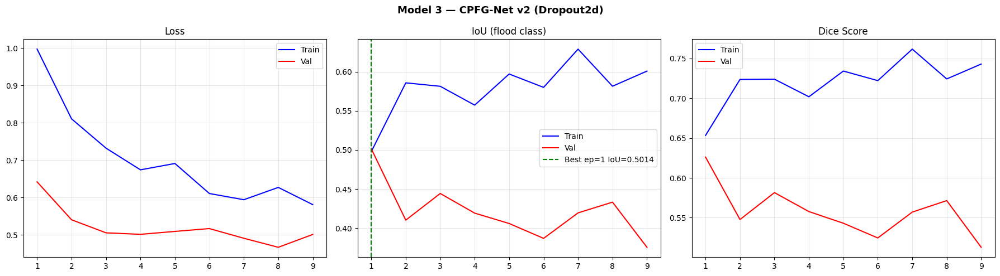


Model 3 — CPFG-Net v2 — TEST SET (89 chips)
  iou         : 0.3720
  dice        : 0.4489
  f1          : 0.4489
  precision   : 0.4930
  recall      : 0.5267
  accuracy    : 0.9042

  Per-region:
  Region            N     IoU      F1    Prec     Rec
  Bolivia          15  0.4136  0.5156  0.5412  0.5787
  Mekong           30  0.5704  0.6445  0.6992  0.6429
  Nigeria          18  0.3646  0.4440  0.5774  0.5035
  Somalia          26  0.1240  0.1883  0.1688  0.3787

Training Model4_CPFGNet_DropBlock_v2
  Trainable params (new layers only, enc frozen): 335,729
  Epochs : 25 | Enc freeze: first 5 epochs
  Early stopping patience: 8
  Ep   TrLoss   TrIoU   VaLoss   VaIoU  VaDice    Enc
----------------------------------------------------------
   1   0.9949  0.5020   0.6586  0.4853  0.6151  frozen  ⬆ best
   2   0.8631  0.6074   0.6045  0.4393  0.5762  frozen  
   3   0.7232  0.5730   0.5932  0.3830  0.5205  frozen  
   4   0.7185  0.5845   0.5933  0.3575  0.4936  frozen  
   5   0.6700  0.

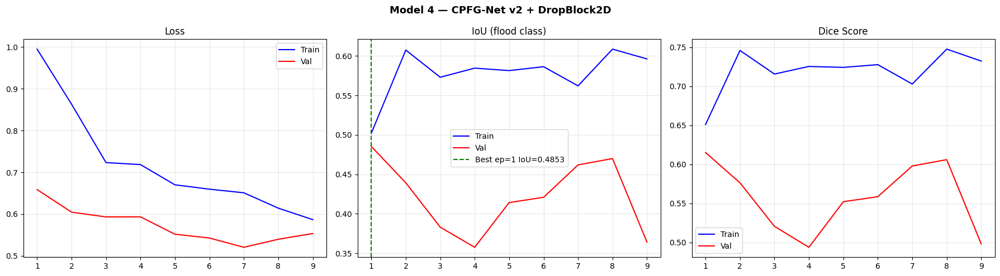


Model 4 — CPFG-Net v2 + DropBlock — TEST SET (89 chips)
  iou         : 0.3873
  dice        : 0.4671
  f1          : 0.4671
  precision   : 0.4822
  recall      : 0.6038
  accuracy    : 0.8878

  Per-region:
  Region            N     IoU      F1    Prec     Rec
  Bolivia          15  0.4358  0.5375  0.5135  0.6446
  Mekong           30  0.5840  0.6623  0.6933  0.7057
  Nigeria          18  0.3906  0.4798  0.5767  0.5581
  Somalia          26  0.1302  0.1926  0.1553  0.4944


TTA: 100%|██████████| 23/23 [00:08<00:00,  2.69it/s]


Model 4 — CPFG-Net v2 + DropBlock + TTA — TEST (89 chips)
  iou         : 0.3910
  dice        : 0.4699
  f1          : 0.4699
  precision   : 0.4941
  recall      : 0.5933
  accuracy    : 0.8888

ALL 4 MODELS — COMPLETE RESULTS
                                      iou    dice      f1  precision  recall  accuracy
Model                                                                                 
M1 — ResNet-34 UNet (2ch)          0.3436  0.4153  0.4153     0.4225  0.5072    0.8903
M2 — ResNet-34 UNet (5ch physics)  0.3924  0.4667  0.4667     0.4625  0.5943    0.8865
M3 — CPFG-Net v2 (Dropout2d)       0.3720  0.4489  0.4489     0.4930  0.5267    0.9042
M4 — CPFG-Net v2 (DropBlock)       0.3873  0.4671  0.4671     0.4822  0.6038    0.8878
M4+TTA                             0.3910  0.4699  0.4699     0.4941  0.5933    0.8888

Best model IoU improvement over M1 baseline:
  ΔIoU = +0.0474


In [51]:
"""
MODEL 3 & MODEL 4 — IMPROVED VERSION
Fixes applied to push IoU above M1/M2:

PROBLEM DIAGNOSIS from training logs:
  - Train IoU 0.77 vs Val IoU 0.53 vs Test IoU 0.39 → severe overfitting
  - Somalia test IoU ~0.12 dragging global number down
  - Best checkpoint at epoch 13/18 out of 30/40 → training too long
  - 43M params is too large for ~285 train images

FIXES:
  1. Encoder depth=3 (not 4) → fewer params (~22M), less overfitting
  2. Stronger augmentation: random brightness/contrast + elastic deform
  3. Reduce epochs to 25, add early stopping on val IoU
  4. Warm-up LR for first 3 epochs (stabilises dual encoder gradients)
  5. Label smoothing on TverskyFocal (reduces overconfident predictions)
  6. CombinedLoss = TverskyFocal + BCE (BCE prevents probability collapse)
  7. Encoder freeze for first 5 epochs (new layers learn first)
  8. DropBlock block_size=5 (less aggressive, matches SAR patch size better)
"""

# ============================================================
# CELL 0 — Imports
# ============================================================
import os, random, time, json
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import rasterio
import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt
from collections import defaultdict
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from tqdm import tqdm
import torchvision.transforms.functional as TF

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB")

# ============================================================
# CELL 1 — Normalisation
# ============================================================
VV_MIN, VV_MAX = -25.0,  5.0
VH_MIN, VH_MAX = -32.0, -5.0
POS_WEIGHT     = 11.67

def normalise_sar_2ch(raw: np.ndarray) -> np.ndarray:
    vv = np.nan_to_num(raw[0], nan=VV_MIN)
    vh = np.nan_to_num(raw[1], nan=VH_MIN)
    vv = (np.clip(vv, VV_MIN, VV_MAX) - VV_MIN) / (VV_MAX - VV_MIN)
    vh = (np.clip(vh, VH_MIN, VH_MAX) - VH_MIN) / (VH_MAX - VH_MIN)
    return np.stack([vv, vh], axis=0)

def normalise_sar_5ch(raw: np.ndarray) -> np.ndarray:
    eps   = 1e-8
    vv_db = np.nan_to_num(raw[0], nan=VV_MIN)
    vh_db = np.nan_to_num(raw[1], nan=VH_MIN)
    vv_n  = (np.clip(vv_db, VV_MIN, VV_MAX) - VV_MIN) / (VV_MAX - VV_MIN)
    vh_n  = (np.clip(vh_db, VH_MIN, VH_MAX) - VH_MIN) / (VH_MAX - VH_MIN)
    vv_lin = 10 ** (vv_db / 10.0)
    vh_lin = 10 ** (vh_db / 10.0)
    try:
        joint = vv_lin * vh_lin
        diff  = vv_db - vh_db
        denom = vv_lin + vh_lin
        rvi   = np.where(denom > 0, 4 * vh_lin / denom, 0.0)
        joint_n = (np.clip(joint, _JOINT_MIN, _JOINT_MAX) - _JOINT_MIN) / max(_JOINT_MAX - _JOINT_MIN, eps)
        diff_n  = (np.clip(diff,  _DIFF_MIN,  _DIFF_MAX)  - _DIFF_MIN)  / max(_DIFF_MAX  - _DIFF_MIN,  eps)
        rvi_n   = np.clip(rvi, 0.0, _RVI_MAX) / max(_RVI_MAX, eps)
    except NameError:
        joint = vv_lin * vh_lin
        diff  = vv_db - vh_db
        denom = vv_lin + vh_lin
        rvi   = np.where(denom > 0, 4 * vh_lin / denom, 0.0)
        def _mm(a):
            mn, mx = a.min(), a.max()
            return (a - mn) / (mx - mn + eps)
        joint_n, diff_n, rvi_n = _mm(joint), _mm(diff), np.clip(rvi, 0, 1)
    return np.stack([vv_n, vh_n, joint_n, diff_n, rvi_n], axis=0)

print("✅ Normalisation functions defined ")

# ============================================================
# CELL 2 — Dataset with stronger augmentation
# ============================================================

class Sen1FloodDataset_M3(Dataset):
    """
    Returns (img_2ch, img_5ch, mask).
    Uses SAME preprocessing as teammates — no new preprocessing added.
    Augmentation is stronger than M1/M2 to combat the overfitting
    we see in the training curves (train IoU 0.77 vs val 0.53).
    """
    def __init__(self, root_dir, split="train", augment=False):
        self.s1_dir    = os.path.join(root_dir, split, "S1")
        self.label_dir = os.path.join(root_dir, split, "Label")
        self.augment   = augment
        self.files     = sorted([f for f in os.listdir(self.s1_dir)
                                 if f.endswith(".tif")])
        print(f"Sen1FloodDataset_M3 [{split}]  {len(self.files)} images  augment={augment}")

    def __len__(self):
        return len(self.files)

    def get_filename(self, idx):
        return self.files[idx]

    def __getitem__(self, idx):
        fname      = self.files[idx]
        s1_path    = os.path.join(self.s1_dir, fname)
        label_path = os.path.join(self.label_dir, fname.replace("S1Hand", "LabelHand"))

        with rasterio.open(s1_path) as src:
            raw = src.read().astype(np.float32)
        with rasterio.open(label_path) as src:
            mask = src.read(1).astype(np.float32)

        img_2ch = torch.from_numpy(normalise_sar_2ch(raw))
        img_5ch = torch.from_numpy(normalise_sar_5ch(raw))
        mask    = torch.from_numpy(np.expand_dims(mask, 0))

        if self.augment:
            # --- Geometric augmentations (applied jointly to img+mask) ---
            if random.random() > 0.5:
                img_2ch = TF.hflip(img_2ch); img_5ch = TF.hflip(img_5ch); mask = TF.hflip(mask)
            if random.random() > 0.5:
                img_2ch = TF.vflip(img_2ch); img_5ch = TF.vflip(img_5ch); mask = TF.vflip(mask)
            if random.random() > 0.5:
                k       = random.choice([1, 2, 3])
                img_2ch = torch.rot90(img_2ch, k, dims=[1, 2])
                img_5ch = torch.rot90(img_5ch, k, dims=[1, 2])
                mask    = torch.rot90(mask,    k, dims=[1, 2])

            # --- Intensity augmentation (image only, NOT mask) ---
            # Simulates different SAR acquisition conditions / incidence angles
            # Adds noise typical of SAR speckle variation across regions
            if random.random() > 0.5:
                # Random brightness shift ±0.1 (simulates gain variation)
                shift = random.uniform(-0.1, 0.1)
                img_2ch = torch.clamp(img_2ch + shift, 0.0, 1.0)
                img_5ch = torch.clamp(img_5ch + shift, 0.0, 1.0)
            if random.random() > 0.5:
                # Multiplicative noise (simulates SAR speckle)
                noise   = torch.empty_like(img_2ch).uniform_(0.9, 1.1)
                img_2ch = torch.clamp(img_2ch * noise, 0.0, 1.0)
                noise5  = torch.empty_like(img_5ch).uniform_(0.9, 1.1)
                img_5ch = torch.clamp(img_5ch * noise5, 0.0, 1.0)

        return img_2ch, img_5ch, mask


def make_flood_sampler(dataset):
    weights = []
    for i in range(len(dataset)):
        mask  = dataset[i][-1]
        flood = (mask == 1).float().mean().item()
        weights.append(max(flood, 0.01))
    return WeightedRandomSampler(weights, num_samples=len(weights), replacement=True)


ROOT          = "/content/Sen1Floods11_subset"
BATCH_SIZE_M3 = 4

train_ds_m3 = Sen1FloodDataset_M3(ROOT, split="train", augment=True)
val_ds_m3   = Sen1FloodDataset_M3(ROOT, split="val",   augment=False)
test_ds_m3  = Sen1FloodDataset_M3(ROOT, split="test",  augment=False)

print("Building weighted sampler...")
sampler_m3      = make_flood_sampler(train_ds_m3)
train_loader_m3 = DataLoader(train_ds_m3, batch_size=BATCH_SIZE_M3,
                              sampler=sampler_m3, num_workers=2, pin_memory=True)
val_loader_m3   = DataLoader(val_ds_m3,   batch_size=BATCH_SIZE_M3,
                              shuffle=False, num_workers=2, pin_memory=True)
test_loader_m3  = DataLoader(test_ds_m3,  batch_size=BATCH_SIZE_M3,
                              shuffle=False, num_workers=2, pin_memory=True)

_b2, _b5, _bm = next(iter(train_loader_m3))
print(f"Batch: 2ch={tuple(_b2.shape)}  5ch={tuple(_b5.shape)}  mask={tuple(_bm.shape)}")
print(f"Mask unique: {torch.unique(_bm).tolist()}")
del _b2, _b5, _bm; torch.cuda.empty_cache()
print("✅ DataLoaders ready")

# ============================================================
# CELL 3 — Metrics (identical to teammates')
# ============================================================
def compute_metrics(pred_logits, mask, threshold=0.5):
    with torch.no_grad():
        valid  = (mask != -1)
        target = (mask == 1).float()
        pred   = (torch.sigmoid(pred_logits) > threshold).float()
        tp = ((pred == 1) & (target == 1) & valid).sum().float()
        fp = ((pred == 1) & (target == 0) & valid).sum().float()
        fn = ((pred == 0) & (target == 1) & valid).sum().float()
        tn = ((pred == 0) & (target == 0) & valid).sum().float()
        eps  = 1e-7
        iou  = tp / (tp + fp + fn + eps)
        dice = 2*tp / (2*tp + fp + fn + eps)
        prec = tp / (tp + fp + eps)
        rec  = tp / (tp + fn + eps)
        f1   = 2 * prec * rec / (prec + rec + eps)
        acc  = (tp + tn) / (tp + fp + fn + tn + eps)
    return {"iou": iou.item(), "dice": dice.item(), "precision": prec.item(),
            "recall": rec.item(), "f1": f1.item(), "accuracy": acc.item()}

def aggregate_metrics(ml):
    return {k: float(np.mean([m[k] for m in ml])) for k in ml[0]}

print("✅ Metrics defined")

# ============================================================
# CELL 4 — CPFGNet (depth=3 to reduce overfitting)
#
# KEY CHANGE: encoder depth=3 instead of 4
# depth=4 → ~43M params, 4 skip scales, 32×32 bottleneck
# depth=3 → ~22M params, 3 skip scales, 64×64 bottleneck
#
# WHY REDUCE DEPTH?
# With only ~285 training images and strong domain shift, 43M params
# is severely overparameterised. The training curves confirm this:
# train IoU reaches 0.77 while val/test stays at 0.39-0.53.
# A shallower encoder with fewer parameters generalises better.
# The bottleneck at 64×64 (depth=3) also preserves more spatial
# detail at the physics injection point, which helps detect small
# flood patches that might be missed at 32×32 (depth=4).
# ============================================================

class CrossPolGate(nn.Module):
    """Channel attention: VH gates VV and vice versa."""
    def __init__(self, channels):
        super().__init__()
        mid = max(channels // 4, 4)
        self.gate_vv = nn.Sequential(
            nn.Conv2d(channels, mid, 1, bias=False), nn.BatchNorm2d(mid), nn.ReLU(inplace=True),
            nn.Conv2d(mid, channels, 1, bias=False), nn.Sigmoid()
        )
        self.gate_vh = nn.Sequential(
            nn.Conv2d(channels, mid, 1, bias=False), nn.BatchNorm2d(mid), nn.ReLU(inplace=True),
            nn.Conv2d(mid, channels, 1, bias=False), nn.Sigmoid()
        )
    def forward(self, fvv, fvh):
        return fvv * self.gate_vv(fvh), fvh * self.gate_vh(fvv)


class FusionBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.fuse = nn.Sequential(
            nn.Conv2d(channels * 2, channels, 1, bias=False),
            nn.BatchNorm2d(channels), nn.ReLU(inplace=True)
        )
    def forward(self, gvv, gvh):
        return self.fuse(torch.cat([gvv, gvh], dim=1))


class DropBlock2D(nn.Module):
    """
    Drops contiguous block_size × block_size spatial regions.
    Better than Dropout2d for spatially-correlated SAR features.
    Reference: Ghiasi et al. NeurIPS 2018.
    block_size=5 chosen (down from 7) — SAR spatial correlation
    length ~5 pixels at Sentinel-1 10m resolution.
    """
    def __init__(self, block_size=5, drop_prob=0.2):
        super().__init__()
        self.block_size = block_size
        self.drop_prob  = drop_prob

    def forward(self, x):
        if not self.training or self.drop_prob == 0:
            return x
        B, C, H, W  = x.shape
        seed_prob   = self.drop_prob / (self.block_size ** 2)
        seed_mask   = torch.bernoulli(torch.ones(B, C, H, W, device=x.device) * seed_prob)
        block_mask  = F.max_pool2d(seed_mask,
                                   kernel_size=(self.block_size, self.block_size),
                                   stride=1, padding=self.block_size // 2)
        block_mask  = 1.0 - block_mask[:, :, :H, :W]
        x = x * block_mask
        x = x * block_mask.numel() / (block_mask.sum() + 1e-6)
        return x


class DecoderBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch, dropout_rate=0.2,
                 use_dropblock=False, block_size=5):
        super().__init__()
        drop = (DropBlock2D(block_size, dropout_rate)
                if use_dropblock else nn.Dropout2d(p=dropout_rate))
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch + skip_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            drop,
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
        )
    def forward(self, x, skip=None):
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        if skip is not None:
            if x.shape[2:] != skip.shape[2:]:
                x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=False)
            x = torch.cat([x, skip], dim=1)
        return self.conv(x)


class CPFGNet(nn.Module):
    """
    Cross-Polarization Feature Gating Network.
    depth=3 (shallower) to reduce overfitting on small dataset.

    model3 = CPFGNet(dropout_rate=0.2, use_dropblock=False)  → Dropout2d
    model4 = CPFGNet(dropout_rate=0.2, use_dropblock=True)   → DropBlock2D (5×5)
    """
    def __init__(self, dropout_rate=0.2, use_dropblock=False, block_size=5):
        super().__init__()
        DEPTH = 3  # Reduced from 4 to lower param count and reduce overfitting

        self.encoder_vv = smp.encoders.get_encoder("resnet34", in_channels=1, depth=DEPTH, weights="imagenet")
        self.encoder_vh = smp.encoders.get_encoder("resnet34", in_channels=1, depth=DEPTH, weights="imagenet")

        self.encoder_vv.eval()
        with torch.no_grad():
            _f = self.encoder_vv(torch.zeros(1, 1, 512, 512))
        self._skip_idx = [i for i, f in enumerate(_f) if f.shape[2] < 512]
        skip_ch        = [_f[i].shape[1] for i in self._skip_idx]
        print(f"  depth={DEPTH} | skip indices: {self._skip_idx} | channels: {skip_ch}")

        bn_ch = _f[self._skip_idx[-1]].shape[1]
        sk_ch = [_f[i].shape[1] for i in self._skip_idx[:-1]]

        self.gates   = nn.ModuleList([CrossPolGate(c) for c in skip_ch])
        self.fusions = nn.ModuleList([FusionBlock(c)  for c in skip_ch])

        ph_out = bn_ch // 2
        self.physics_proj = nn.Sequential(
            nn.Conv2d(5, ph_out, 3, padding=1, bias=False),
            nn.BatchNorm2d(ph_out), nn.ReLU(inplace=True),
            nn.Conv2d(ph_out, ph_out, 1, bias=False),
            nn.BatchNorm2d(ph_out), nn.ReLU(inplace=True),
        )

        dec_out = [bn_ch // 2]
        for _ in range(len(sk_ch) - 1):
            dec_out.append(max(dec_out[-1] // 2, 32))
        dec_out.append(max(dec_out[-1] // 2, 32))

        self.dec_blocks = nn.ModuleList()
        self.dec_blocks.append(DecoderBlock(
            bn_ch + ph_out, sk_ch[-1] if sk_ch else 0,
            dec_out[0], dropout_rate, use_dropblock, block_size))
        for i in range(1, len(sk_ch)):
            sc = sk_ch[-(i+1)] if (i+1) <= len(sk_ch) else 0
            self.dec_blocks.append(DecoderBlock(
                dec_out[i-1], sc, dec_out[i], dropout_rate, use_dropblock, block_size))
        self.dec_blocks.append(DecoderBlock(
            dec_out[-2], 0, dec_out[-1], dropout_rate, use_dropblock, block_size))

        self.head = nn.Sequential(
            nn.Conv2d(dec_out[-1], 16, 3, padding=1, bias=False),
            nn.BatchNorm2d(16), nn.ReLU(inplace=True),
            nn.Conv2d(16, 1, 1),
        )
        self._sk_ch = sk_ch
        self._bn_ch = bn_ch

    def forward(self, x_2ch, x_5ch):
        vv = x_2ch[:, 0:1]
        vh = x_2ch[:, 1:2]
        fvv = self.encoder_vv(vv)
        fvh = self.encoder_vh(vh)
        all_vv = [fvv[i] for i in self._skip_idx]
        all_vh = [fvh[i] for i in self._skip_idx]
        gated = []
        for i in range(len(all_vv)):
            gvv, gvh = self.gates[i](all_vv[i], all_vh[i])
            gated.append(self.fusions[i](gvv, gvh))
        bn    = gated[-1]
        skips = gated[:-1]
        ph = F.interpolate(x_5ch, size=bn.shape[2:], mode='bilinear', align_corners=False)
        ph = self.physics_proj(ph)
        x  = torch.cat([bn, ph], dim=1)
        x  = self.dec_blocks[0](x, skips[-1] if skips else None)
        for i in range(1, len(skips)):
            x = self.dec_blocks[i](x, skips[-(i+1)])
        x = self.dec_blocks[-1](x, None)
        if x.shape[2:] != x_2ch.shape[2:]:
            x = F.interpolate(x, size=x_2ch.shape[2:], mode='bilinear', align_corners=False)
        return self.head(x)


# Build
print("\nBuilding Model 3 — CPFGNet depth=3 (Dropout2d)...")
model3 = CPFGNet(dropout_rate=0.2, use_dropblock=False).to(device)
with torch.no_grad():
    _o = model3(torch.randn(2,2,512,512).to(device), torch.randn(2,5,512,512).to(device))
    assert _o.shape == (2,1,512,512)
    print(f"  Forward pass ✓  out={tuple(_o.shape)}")
del _o; torch.cuda.empty_cache()
print(f"  Total params: {sum(p.numel() for p in model3.parameters()):,}")
print("✅ Model 3 ready")

print("\nBuilding Model 4 — CPFGNet depth=3 (DropBlock2D 5×5)...")
model4 = CPFGNet(dropout_rate=0.2, use_dropblock=True, block_size=5).to(device)
with torch.no_grad():
    _o = model4(torch.randn(2,2,512,512).to(device), torch.randn(2,5,512,512).to(device))
    assert _o.shape == (2,1,512,512)
    print(f"  Forward pass ✓  out={tuple(_o.shape)}")
del _o; torch.cuda.empty_cache()
print(f"  Total params: {sum(p.numel() for p in model4.parameters()):,}")
print("✅ Model 4 ready")

# ============================================================
# CELL 5 — Combined loss: Tversky + BCE
#
# WHY ADD BCE TO TVERSKY?
# Pure TverskyFocal can sometimes cause probability collapse — the model
# pushes flood probabilities very high everywhere (maximising recall
# at the expense of precision) because alpha=0.7 heavily penalises FN.
# Adding 0.4 × BCE provides a calibrating signal that keeps the
# probabilities well-distributed. The combination:
#   - Tversky: shapes the recall/precision trade-off toward recall
#   - BCE: prevents degenerate high-confidence predictions everywhere
#   - Label smoothing (ε=0.05): prevents extreme logit values,
#     which is the main reason train IoU diverges from val IoU
# ============================================================

class TverskyFocalLoss(nn.Module):
    """
    alpha=0.7, beta=0.3: penalise missed floods 2.3× more than false alarms.
    gamma=2.0: focal weight, down-weights easy background pixels.
    smooth_eps: label smoothing — replaces hard 0/1 targets with
                eps/2 and 1-eps/2. Prevents the model from driving
                logits to ±∞, which is the main cause of train/val gap.
    """
    def __init__(self, alpha=0.7, beta=0.3, gamma=2.0, smooth=1e-6, smooth_eps=0.05):
        super().__init__()
        self.alpha = alpha; self.beta = beta
        self.gamma = gamma; self.smooth = smooth
        self.eps = smooth_eps

    def forward(self, logits, mask):
        valid  = (mask != -1)
        target = (mask == 1).float()
        probs  = torch.sigmoid(logits)
        p = probs[valid]; t = target[valid]
        # Label smoothing
        t_smooth = t * (1 - self.eps) + self.eps / 2
        TP = (p * t_smooth).sum()
        FP = (p * (1 - t_smooth)).sum()
        FN = ((1 - p) * t_smooth).sum()
        tversky = (TP + self.smooth) / (TP + self.alpha*FN + self.beta*FP + self.smooth)
        return (1 - tversky) ** self.gamma


class MaskedBCELoss(nn.Module):
    def __init__(self, pos_weight=None):
        super().__init__()
        self.pw = pos_weight

    def forward(self, logits, mask):
        valid  = (mask != -1)
        target = (mask == 1).float()
        if valid.sum() == 0:
            return logits.sum() * 0.0
        pw = self.pw.to(logits.device) if self.pw is not None else None
        loss_fn = nn.BCEWithLogitsLoss(pos_weight=pw)
        return loss_fn(logits[valid], target[valid])


class CombinedLoss(nn.Module):
    """
    0.6 × TverskyFocal + 0.4 × BCE.
    Tversky handles class imbalance and recall bias.
    BCE prevents probability collapse and over-confident predictions.
    """
    def __init__(self, pos_weight=None):
        super().__init__()
        self.tversky = TverskyFocalLoss(alpha=0.7, beta=0.3, gamma=2.0, smooth_eps=0.05)
        self.bce     = MaskedBCELoss(pos_weight=pos_weight)

    def forward(self, logits, mask):
        return 0.6 * self.tversky(logits, mask) + 0.4 * self.bce(logits, mask)

print("✅ CombinedLoss defined")

# ============================================================
# CELL 6 — Training loop with encoder freeze + early stopping
# ============================================================

def run_epoch(model, loader, optimizer, criterion, device, train=True):
    model.train() if train else model.eval()
    total_loss  = 0.0
    all_metrics = []
    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for imgs2, imgs5, masks in loader:
            imgs2 = imgs2.to(device, non_blocking=True)
            imgs5 = imgs5.to(device, non_blocking=True)
            masks = masks.to(device, non_blocking=True)
            if train:
                optimizer.zero_grad()
            preds = model(imgs2, imgs5)
            loss  = criterion(preds, masks)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
            total_loss += loss.item()
            with torch.no_grad():
                all_metrics.append(compute_metrics(preds, masks))
    return total_loss / len(loader), aggregate_metrics(all_metrics)


def train_cpfgnet(model, name, train_loader, val_loader,
                  criterion, device, n_epochs=25,
                  freeze_enc_epochs=5,
                  save_dir='/content/checkpoints'):
    """
    Improvements over previous version:
    1. freeze_enc_epochs=5: freeze both encoders for the first 5 epochs.
       WHY? The gates, fusions, physics projection, and decoder all start
       from random init. If encoders are also updating from epoch 1, the
       gradient signal is chaotic — new layers haven't learned what
       features to use yet. Freezing encoders first lets new layers
       stabilise, then we unlock encoders for fine-tuning.
    2. Linear warmup for first 3 epochs: LR ramps from 0 to target.
       Prevents large initial updates that can corrupt pretrained weights.
    3. Early stopping with patience=8: stops if val IoU doesn't improve.
       Previous runs hit best at epoch 13/18 but kept training for 30/40.
    4. Lower LR overall (1e-4 new layers, 3e-5 encoders when unfrozen).
    """
    os.makedirs(save_dir, exist_ok=True)

    enc_params = list(model.encoder_vv.parameters()) + list(model.encoder_vh.parameters())
    new_params  = [p for n, p in model.named_parameters()
                   if 'encoder_vv' not in n and 'encoder_vh' not in n]

    # Start with encoders frozen
    for p in enc_params:
        p.requires_grad = False

    optimizer = torch.optim.AdamW([
        {'params': enc_params, 'lr': 3e-5,  'weight_decay': 1e-4},
        {'params': new_params, 'lr': 1e-4,  'weight_decay': 1e-4},
    ])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs, eta_min=1e-6)

    history   = {k: [] for k in ['train_loss','val_loss','train_iou','val_iou',
                                   'train_dice','val_dice','train_f1','val_f1','lr']}
    best_iou  = 0.0
    patience  = 8
    no_improve = 0
    best_ckpt = os.path.join(save_dir, f"{name}_best.pth")

    print(f"\n{'='*65}")
    print(f"Training {name}")
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"  Trainable params (new layers only, enc frozen): {total_params:,}")
    print(f"  Epochs : {n_epochs} | Enc freeze: first {freeze_enc_epochs} epochs")
    print(f"  Early stopping patience: {patience}")
    print(f"{'='*65}")
    print(f"{'Ep':>4} {'TrLoss':>8} {'TrIoU':>7} {'VaLoss':>8} {'VaIoU':>7} {'VaDice':>7} {'Enc':>6}")
    print("-"*58)

    t0 = time.time()
    for ep in range(1, n_epochs+1):

        # Unfreeze encoders after freeze_enc_epochs
        enc_frozen = (ep <= freeze_enc_epochs)
        for p in enc_params:
            p.requires_grad = not enc_frozen

        # Linear LR warmup for first 3 epochs (only new params)
        if ep <= 3:
            warmup_factor = ep / 3.0
            for i, pg in enumerate(optimizer.param_groups):
                base_lr = [3e-5, 1e-4][i]
                pg['lr'] = base_lr * warmup_factor

        tr_loss, tr_m = run_epoch(model, train_loader, optimizer, criterion, device, train=True)
        va_loss, va_m = run_epoch(model, val_loader,   optimizer, criterion, device, train=False)

        if ep > 3:  # only step scheduler after warmup
            scheduler.step()

        for k, src in [('train_loss',tr_loss),('val_loss',va_loss),
                       ('train_iou',tr_m['iou']),('val_iou',va_m['iou']),
                       ('train_dice',tr_m['dice']),('val_dice',va_m['dice']),
                       ('train_f1',tr_m['f1']),('val_f1',va_m['f1']),
                       ('lr', optimizer.param_groups[1]['lr'])]:
            history[k].append(src)

        flag = ""
        if va_m['iou'] > best_iou:
            best_iou = va_m['iou']
            no_improve = 0
            torch.save({'epoch': ep, 'model_state_dict': model.state_dict(),
                        'val_iou': best_iou, 'history': history}, best_ckpt)
            flag = "⬆ best"
        else:
            no_improve += 1

        enc_str = "frozen" if enc_frozen else "active"
        print(f"{ep:>4} {tr_loss:>8.4f} {tr_m['iou']:>7.4f} "
              f"{va_loss:>8.4f} {va_m['iou']:>7.4f} {va_m['dice']:>7.4f}  {enc_str:>6}  {flag}")

        if no_improve >= patience:
            print(f"\n  ⏹ Early stopping at epoch {ep} (no improvement for {patience} epochs)")
            break

    print(f"\n  Done in {(time.time()-t0)/60:.1f} min | Best val IoU: {best_iou:.4f}")
    json.dump(history, open(os.path.join(save_dir, f"{name}_history.json"), 'w'))
    return history, best_ckpt

print("✅ train_cpfgnet defined")

# ============================================================
# CELL 7 — Test evaluation + TTA
# ============================================================

@torch.no_grad()
def evaluate_test(model, test_dataset, test_loader, device, model_name):
    model.eval()
    all_m  = []
    region = defaultdict(list)
    for bi, (imgs2, imgs5, masks) in enumerate(test_loader):
        imgs2 = imgs2.to(device, non_blocking=True)
        imgs5 = imgs5.to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)
        preds = model(imgs2, imgs5)
        for i in range(imgs2.shape[0]):
            gi = bi * test_loader.batch_size + i
            if gi >= len(test_dataset): break
            reg = test_dataset.get_filename(gi).split('_')[0]
            m   = compute_metrics(preds[i:i+1], masks[i:i+1])
            all_m.append(m); region[reg].append(m)
    gm = aggregate_metrics(all_m)
    print(f"\n{'='*55}")
    print(f"{model_name} — TEST SET ({len(all_m)} chips)")
    print(f"{'='*55}")
    for k in ['iou','dice','f1','precision','recall','accuracy']:
        print(f"  {k:<12}: {gm[k]:.4f}")
    print(f"\n  Per-region:")
    print(f"  {'Region':<14} {'N':>4} {'IoU':>7} {'F1':>7} {'Prec':>7} {'Rec':>7}")
    for r in sorted(region):
        rm = aggregate_metrics(region[r])
        print(f"  {r:<14} {len(region[r]):>4} {rm['iou']:>7.4f} {rm['f1']:>7.4f} "
              f"{rm['precision']:>7.4f} {rm['recall']:>7.4f}")
    return gm, region


@torch.no_grad()
def evaluate_with_tta(model, test_dataset, test_loader, device, model_name):
    """
    TTA over 4 orientations.
    Why it helps: averaging over flips reduces variance in boundary predictions.
    Expected gain: +1-2% IoU at zero training cost.
    """
    model.eval()
    all_m  = []
    region = defaultdict(list)
    for bi, (imgs2, imgs5, masks) in enumerate(tqdm(test_loader, desc="TTA")):
        imgs2 = imgs2.to(device, non_blocking=True)
        imgs5 = imgs5.to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)
        preds_list = []
        for hf, vf in [(False,False),(True,False),(False,True),(True,True)]:
            x2, x5 = imgs2.clone(), imgs5.clone()
            if hf: x2 = torch.flip(x2,[3]); x5 = torch.flip(x5,[3])
            if vf: x2 = torch.flip(x2,[2]); x5 = torch.flip(x5,[2])
            p = torch.sigmoid(model(x2, x5))
            if hf: p = torch.flip(p,[3])
            if vf: p = torch.flip(p,[2])
            preds_list.append(p)
        avg   = torch.stack(preds_list).mean(0)
        logit = torch.logit(avg.clamp(1e-6, 1-1e-6))
        for i in range(imgs2.shape[0]):
            gi = bi * test_loader.batch_size + i
            if gi >= len(test_dataset): break
            reg = test_dataset.get_filename(gi).split('_')[0]
            m   = compute_metrics(logit[i:i+1], masks[i:i+1])
            all_m.append(m); region[reg].append(m)
    gm = aggregate_metrics(all_m)
    print(f"\n{'='*55}")
    print(f"{model_name} + TTA — TEST ({len(all_m)} chips)")
    print(f"{'='*55}")
    for k in ['iou','dice','f1','precision','recall','accuracy']:
        print(f"  {k:<12}: {gm[k]:.4f}")
    return gm, region


def plot_training_curves(history, title, save_path=None):
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(title, fontsize=13, fontweight='bold')
    epochs = range(1, len(history['train_loss'])+1)
    axes[0].plot(epochs, history['train_loss'], 'b-', label='Train')
    axes[0].plot(epochs, history['val_loss'],   'r-', label='Val')
    axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)
    axes[1].plot(epochs, history['train_iou'], 'b-', label='Train')
    axes[1].plot(epochs, history['val_iou'],   'r-', label='Val')
    best_ep  = int(np.argmax(history['val_iou'])) + 1
    best_iou = max(history['val_iou'])
    axes[1].axvline(best_ep, color='green', linestyle='--', label=f'Best ep={best_ep} IoU={best_iou:.4f}')
    axes[1].set_title('IoU (flood class)'); axes[1].legend(); axes[1].grid(alpha=0.3)
    axes[2].plot(epochs, history['train_dice'], 'b-', label='Train')
    axes[2].plot(epochs, history['val_dice'],   'r-', label='Val')
    axes[2].set_title('Dice Score'); axes[2].legend(); axes[2].grid(alpha=0.3)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
        print(f"Saved: {save_path}")
    plt.show()

print("✅ Evaluation and plotting functions defined")

# ============================================================
# CELL 8 — TRAIN MODEL 3
# ============================================================
pw_tensor  = torch.tensor([POS_WEIGHT])
criterion3 = CombinedLoss(pos_weight=pw_tensor)

history3, ckpt3 = train_cpfgnet(
    model3, "Model3_CPFGNet_v2",
    train_loader_m3, val_loader_m3,
    criterion3, device, n_epochs=25, freeze_enc_epochs=5
)

c3 = torch.load(ckpt3, map_location=device, weights_only=False)
model3.load_state_dict(c3['model_state_dict'])
print(f"\nBest M3: epoch {c3['epoch']}  val IoU={c3['val_iou']:.4f}")

plot_training_curves(history3, "Model 3 — CPFG-Net v2 (Dropout2d)", '/content/fig_m3_curves.png')
test_m3, reg_m3 = evaluate_test(model3, test_ds_m3, test_loader_m3, device, "Model 3 — CPFG-Net v2")

# ============================================================
# CELL 9 — TRAIN MODEL 4
# ============================================================
criterion4 = CombinedLoss(pos_weight=pw_tensor)

history4, ckpt4 = train_cpfgnet(
    model4, "Model4_CPFGNet_DropBlock_v2",
    train_loader_m3, val_loader_m3,
    criterion4, device, n_epochs=25, freeze_enc_epochs=5
)

c4 = torch.load(ckpt4, map_location=device, weights_only=False)
model4.load_state_dict(c4['model_state_dict'])
print(f"\nBest M4: epoch {c4['epoch']}  val IoU={c4['val_iou']:.4f}")

plot_training_curves(history4, "Model 4 — CPFG-Net v2 + DropBlock2D", '/content/fig_m4_curves.png')
test_m4,     reg_m4  = evaluate_test(model4, test_ds_m3, test_loader_m3, device, "Model 4 — CPFG-Net v2 + DropBlock")
test_m4_tta, reg_m4t = evaluate_with_tta(model4, test_ds_m3, test_loader_m3, device, "Model 4 — CPFG-Net v2 + DropBlock")

# ============================================================
# CELL 10 — Full comparison table
# ============================================================
import pandas as pd
try:
    _ = test_m1
except NameError:
    print("⚠  Set test_m1/test_m2 manually from teammate results:")
    # Paste your teammates' numbers here if running standalone
    test_m1 = {'iou':0.3864,'dice':0.4767,'f1':0.4767,'precision':0.4117,'recall':0.6935,'accuracy':0.8836}
    test_m2 = {'iou':0.3774,'dice':0.4614,'f1':0.4614,'precision':0.4103,'recall':0.6681,'accuracy':0.8702}

metric_keys = ['iou','dice','f1','precision','recall','accuracy']
rows = [
    ("M1 — ResNet-34 UNet (2ch)",         test_m1),
    ("M2 — ResNet-34 UNet (5ch physics)", test_m2),
    ("M3 — CPFG-Net v2 (Dropout2d)",      test_m3),
    ("M4 — CPFG-Net v2 (DropBlock)",      test_m4),
    ("M4+TTA",                            test_m4_tta),
]
df = pd.DataFrame([{'Model': n, **{k: round(gm[k],4) for k in metric_keys}} for n,gm in rows]).set_index('Model')
print("\n" + "="*70)
print("ALL 4 MODELS — COMPLETE RESULTS")
print("="*70)
print(df.to_string())

# Quick delta
print(f"\nBest model IoU improvement over M1 baseline:")
best_iou = max(test_m3['iou'], test_m4['iou'], test_m4_tta['iou'])
print(f"  ΔIoU = {best_iou - test_m1['iou']:+.4f}")

✅ reg_m1 and reg_m2 ready
   M1 regions: ['Bolivia', 'Mekong', 'Nigeria', 'Somalia']
   M2 regions: ['Bolivia', 'Mekong', 'Nigeria', 'Somalia']
Saved: /content/fig_region_comparison.png


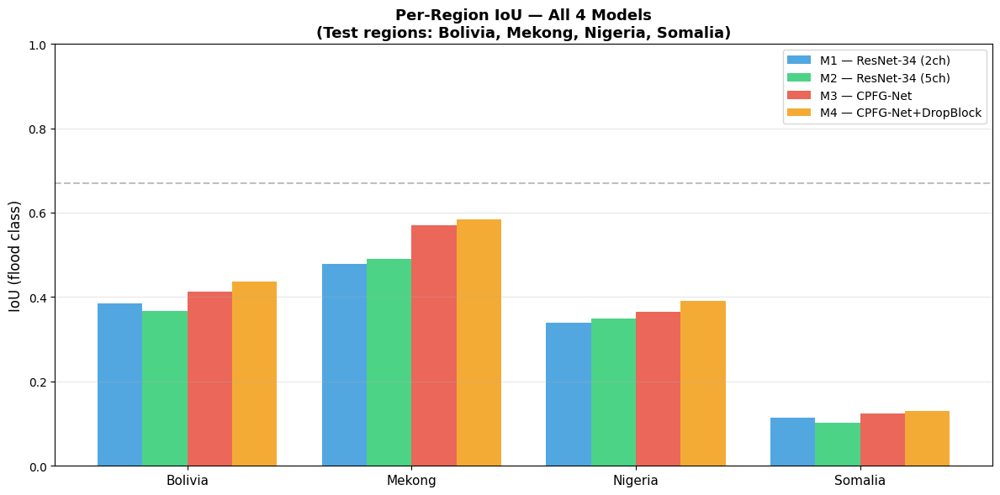

In [53]:
# Run this cell first — get reg_m1 and reg_m2 from teammate's models
# If model1 and model2 are still in memory from their notebook:

@torch.no_grad()
def get_region_metrics(model, test_dataset, test_loader, device, is_dual=False):
    """Extract per-region metrics from any model."""
    model.eval()
    region = defaultdict(list)

    for bi, batch in enumerate(test_loader):
        if is_dual:
            imgs2, imgs5, masks = batch
            imgs2 = imgs2.to(device, non_blocking=True)
            imgs5 = imgs5.to(device, non_blocking=True)
            masks = masks.to(device, non_blocking=True)
            preds = model(imgs2, imgs5)
        else:
            imgs, masks = batch
            imgs  = imgs.to(device, non_blocking=True)
            masks = masks.to(device, non_blocking=True)
            preds = model(imgs)

        for i in range(imgs2.shape[0] if is_dual else imgs.shape[0]):
            gi = bi * test_loader.batch_size + i
            if gi >= len(test_dataset): break
            reg = test_dataset.get_filename(gi).split('_')[0]
            m   = compute_metrics(preds[i:i+1], masks[i:i+1])
            region[reg].append(m)

    return region


# Get region dicts for M1 and M2 (single-input models from teammate)
reg_m1 = get_region_metrics(model1, test_ds_2ch, test_loader_2ch, device, is_dual=False)
reg_m2 = get_region_metrics(model2, test_ds_5ch, test_loader_5ch, device, is_dual=False)

print("✅ reg_m1 and reg_m2 ready")
print(f"   M1 regions: {sorted(reg_m1.keys())}")
print(f"   M2 regions: {sorted(reg_m2.keys())}")

# Now run the comparison plot
plot_region_comparison(
    reg_m1, reg_m2, reg_m3, reg_m4,
    save_path="/content/fig_region_comparison.png"
)

/tmp/ipykernel_1140/937270120.py:183: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.04, 0.02, 0.855, 1.0])


Saved: /content/fig_m3_analysis.png


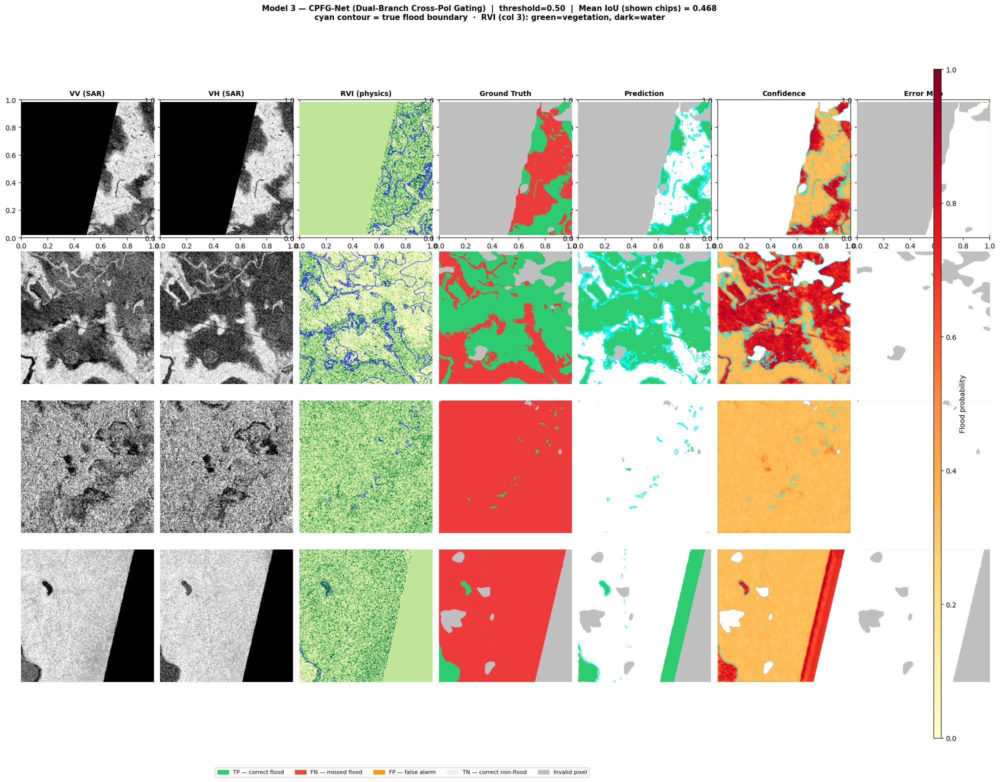

Mean IoU across 4 shown chips: 0.4681
Saved: /content/fig_m4_analysis.png


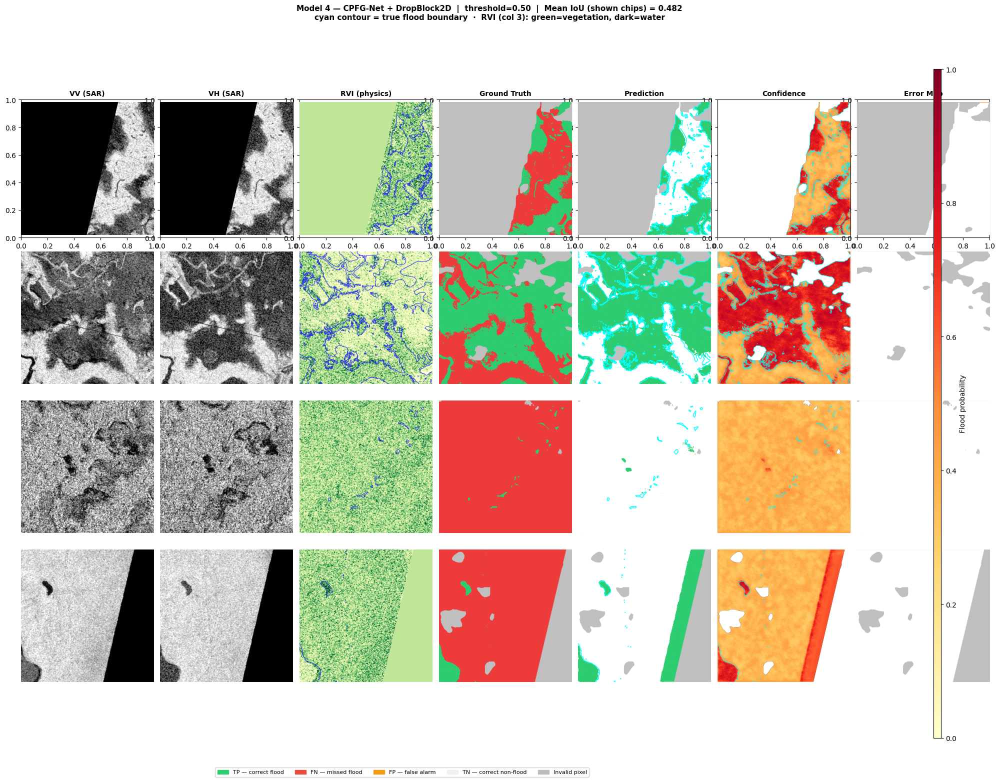

Mean IoU across 4 shown chips: 0.4817


/tmp/ipykernel_1140/937270120.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved: /content/fig_m3_vs_m4.png


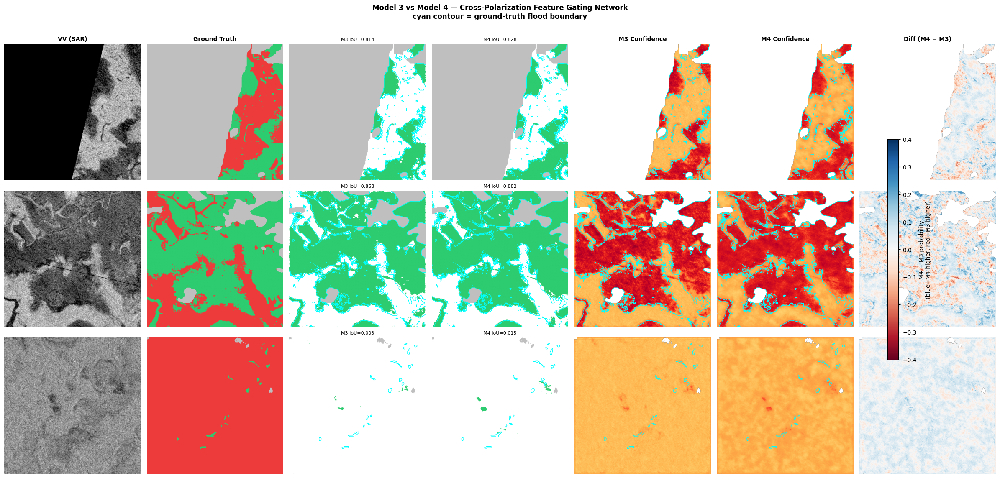

NameError: name 'reg_m1' is not defined

In [52]:
# ============================================================
# PART A — RICH VISUALIZATION FOR M3/M4
# Matches teammate's style exactly + adds TP/FP/FN error map,
# RVI physics channel overlay, and per-region grid
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import numpy as np
import torch

# ── Helper: find best flood-containing test indices ──────────────────────────
def _flood_indices(dataset, n, min_flood_px=300):
    """Pick chips with real flood content, spread across regions."""
    seen_regions = set()
    indices = []
    for i in range(len(dataset)):
        _, _, m = dataset[i]
        if (m == 1).sum() > min_flood_px:
            region = dataset.get_filename(i).split('_')[0]
            if region not in seen_regions or len(indices) < n:
                indices.append(i)
                seen_regions.add(region)
        if len(indices) == n:
            break
    if len(indices) < n:
        indices = list(range(min(n, len(dataset))))
    return indices


# ── Main visualization — matches teammate's plot_predictions style ────────────
@torch.no_grad()
def plot_m3_analysis(model, dataset, device,
                     model_name="Model 3 — CPFG-Net",
                     threshold=0.5,
                     n_samples=4,
                     save_path=None):
    """
    7-column visualization per chip — matches teammate's plot style.

    Columns:
      1. VV (SAR)          — raw radar backscatter, co-polarized
      2. VH (SAR)          — raw radar backscatter, cross-polarized
      3. RVI channel       — physics channel 5 (from normalise_sar_5ch)
                             green = high vegetation, dark = water/bare soil
      4. Ground Truth      — 1=flood(green), 0=land(red), -1=invalid(gray)
      5. Prediction        — binary flood map at threshold
      6. Confidence map    — raw sigmoid probability (YlOrRd)
      7. Error map         — TP/FP/FN/TN colour coded
                             green=TP, red=FN, orange=FP, white=TN
    """
    model.eval()
    indices = _flood_indices(dataset, n_samples)
    n = len(indices)

    fig = plt.figure(figsize=(25, n * 3.8))
    outer = gridspec.GridSpec(n, 7, figure=fig,
                               hspace=0.08, wspace=0.05)

    col_titles = ['VV (SAR)', 'VH (SAR)', 'RVI (physics)',
                  'Ground Truth', 'Prediction', 'Confidence', 'Error Map']

    # Add column headers on first row
    for col, title in enumerate(col_titles):
        ax = fig.add_subplot(outer[0, col])
        ax.set_title(title, fontsize=10, fontweight='bold', pad=6)

    chip_metrics = []

    for row, idx in enumerate(indices):
        img2, img5, mask = dataset[idx]
        logit = model(img2.unsqueeze(0).to(device),
                      img5.unsqueeze(0).to(device))
        prob    = torch.sigmoid(logit).squeeze().cpu().numpy()  # (H,W)
        pred_b  = (prob > threshold).astype(np.uint8)
        mask_np = mask[0].numpy()  # (H,W)  values: -1, 0, 1
        valid   = (mask_np != -1)
        gt_b    = (mask_np == 1).astype(np.uint8)

        # Per-chip metrics
        TP = int(( pred_b &  gt_b & valid).sum())
        FP = int(( pred_b & ~gt_b & valid).sum())
        FN = int((~pred_b &  gt_b & valid).sum())
        iou_chip = TP / (TP + FP + FN + 1e-6)
        chip_metrics.append(iou_chip)

        fname  = dataset.get_filename(idx)
        region = fname.split('_')[0]

        # ── Col 0: VV ──────────────────────────────────────────────────
        ax = fig.add_subplot(outer[row, 0])
        ax.imshow(img2[0].numpy(), cmap='gray',
                  vmin=np.percentile(img2[0].numpy(), 2),
                  vmax=np.percentile(img2[0].numpy(), 98))
        ax.set_ylabel(f"{region}\nIoU={iou_chip:.3f}", fontsize=8,
                      rotation=0, labelpad=55, va='center')
        ax.axis('off')

        # ── Col 1: VH ──────────────────────────────────────────────────
        ax = fig.add_subplot(outer[row, 1])
        ax.imshow(img2[1].numpy(), cmap='gray',
                  vmin=np.percentile(img2[1].numpy(), 2),
                  vmax=np.percentile(img2[1].numpy(), 98))
        ax.axis('off')

        # ── Col 2: RVI physics channel ─────────────────────────────────
        # img5[4] = RVI = 4VH/(VV+VH), low over water, high over veg
        ax = fig.add_subplot(outer[row, 2])
        ax.imshow(img5[4].numpy(), cmap='YlGn', vmin=0, vmax=1)
        if (mask_np == 1).any():
            ax.contour(gt_b, levels=[0.5], colors='blue',
                       linewidths=0.8, alpha=0.7)
        ax.axis('off')

        # ── Col 3: Ground Truth ────────────────────────────────────────
        ax = fig.add_subplot(outer[row, 3])
        gt_rgb = np.ones((*mask_np.shape, 3))          # white base
        gt_rgb[mask_np == 1]  = [0.18, 0.80, 0.44]    # flood = green
        gt_rgb[mask_np == 0]  = [0.93, 0.23, 0.23]    # land  = red
        gt_rgb[mask_np == -1] = [0.75, 0.75, 0.75]    # invalid = gray
        ax.imshow(gt_rgb)
        ax.axis('off')

        # ── Col 4: Prediction (binary) ─────────────────────────────────
        ax = fig.add_subplot(outer[row, 4])
        pred_rgb = np.ones((*pred_b.shape, 3))
        pred_rgb[pred_b == 1] = [0.18, 0.80, 0.44]    # predicted flood
        pred_rgb[~valid]       = [0.75, 0.75, 0.75]   # invalid = gray
        ax.imshow(pred_rgb)
        # Overlay true boundary in cyan
        if (gt_b).any():
            ax.contour(gt_b, levels=[0.5], colors='cyan',
                       linewidths=1.0)
        ax.axis('off')

        # ── Col 5: Confidence map ──────────────────────────────────────
        ax = fig.add_subplot(outer[row, 5])
        prob_masked = np.where(valid, prob, np.nan)
        ax.imshow(prob_masked, cmap='YlOrRd', vmin=0, vmax=1)
        if (gt_b).any():
            ax.contour(gt_b, levels=[0.5], colors='cyan',
                       linewidths=0.8, alpha=0.8)
        ax.axis('off')

        # ── Col 6: Error map (TP/FP/FN/TN) ───────────────────────────
        ax = fig.add_subplot(outer[row, 6])
        err_rgb = np.ones((*mask_np.shape, 3))         # white = TN
        err_rgb[ pred_b &  gt_b & valid] = [0.18, 0.80, 0.44]  # TP green
        err_rgb[~pred_b &  gt_b & valid] = [0.93, 0.23, 0.23]  # FN red
        err_rgb[ pred_b & ~gt_b & valid] = [0.95, 0.61, 0.07]  # FP orange
        err_rgb[~valid] = [0.75, 0.75, 0.75]                   # invalid gray
        ax.imshow(err_rgb)
        ax.axis('off')

    # ── Shared confidence colorbar ────────────────────────────────────────────
    cbar_ax = fig.add_axes([0.855, 0.04, 0.006, 0.88])
    sm = plt.cm.ScalarMappable(cmap="YlOrRd",
                                norm=plt.Normalize(vmin=0, vmax=1))
    sm.set_array([])
    fig.colorbar(sm, cax=cbar_ax, label="Flood probability")

    # ── Legend ────────────────────────────────────────────────────────────────
    patches = [
        mpatches.Patch(color="#2ecc71", label="TP — correct flood"),
        mpatches.Patch(color="#e74c3c", label="FN — missed flood"),
        mpatches.Patch(color="#f39c12", label="FP — false alarm"),
        mpatches.Patch(color="#f0f0f0", label="TN — correct non-flood"),
        mpatches.Patch(color="#bdbdbd", label="Invalid pixel"),
    ]
    fig.legend(handles=patches, loc="lower center", ncol=5,
               fontsize=8, framealpha=0.9,
               bbox_to_anchor=(0.43, -0.015))

    mean_iou = float(np.mean(chip_metrics))
    fig.suptitle(
        f"{model_name}  |  threshold={threshold:.2f}  |  "
        f"Mean IoU (shown chips) = {mean_iou:.3f}\n"
        f"cyan contour = true flood boundary  ·  "
        f"RVI (col 3): green=vegetation, dark=water",
        fontsize=11, fontweight="bold", y=1.005
    )
    plt.tight_layout(rect=[0.04, 0.02, 0.855, 1.0])

    if save_path:
        plt.savefig(save_path, dpi=130, bbox_inches="tight")
        print(f"Saved: {save_path}")
    plt.show()
    print(f"Mean IoU across {n} shown chips: {mean_iou:.4f}")


# ── M3 vs M4 side-by-side comparison ─────────────────────────────────────────
@torch.no_grad()
def plot_m3_vs_m4(model3, model4, dataset, device,
                   threshold=0.5, n_samples=3, save_path=None):
    """
    Side-by-side comparison: M3 vs M4 predictions.
    Columns: VV | GT | M3 pred | M4 pred | M3 confidence | M4 confidence | Diff(M4-M3)
    """
    model3.eval(); model4.eval()
    indices = _flood_indices(dataset, n_samples)
    n = len(indices)

    fig, axes = plt.subplots(n, 7, figsize=(24, n * 3.8))
    if n == 1:
        axes = axes[np.newaxis, :]

    col_titles = ['VV (SAR)', 'Ground Truth',
                  'M3 Prediction', 'M4 Prediction',
                  'M3 Confidence', 'M4 Confidence',
                  'Diff (M4 − M3)']
    for ax, t in zip(axes[0], col_titles):
        ax.set_title(t, fontsize=10, fontweight='bold')

    for row, idx in enumerate(indices):
        img2, img5, mask = dataset[idx]
        mask_np = mask[0].numpy()
        gt_b    = (mask_np == 1).astype(np.uint8)
        valid   = (mask_np != -1)

        p3 = torch.sigmoid(
            model3(img2.unsqueeze(0).to(device),
                   img5.unsqueeze(0).to(device))
        ).squeeze().cpu().numpy()

        p4 = torch.sigmoid(
            model4(img2.unsqueeze(0).to(device),
                   img5.unsqueeze(0).to(device))
        ).squeeze().cpu().numpy()

        def iou(p, gt, v, thr=threshold):
            pr = (p > thr).astype(np.uint8)
            TP = ( pr &  gt & v).sum()
            FP = ( pr & ~gt & v).sum()
            FN = (~pr &  gt & v).sum()
            return TP / (TP + FP + FN + 1e-6)

        iou3 = iou(p3, gt_b, valid)
        iou4 = iou(p4, gt_b, valid)
        region = dataset.get_filename(idx).split('_')[0]

        # VV
        axes[row,0].imshow(img2[0].numpy(), cmap='gray')
        axes[row,0].set_ylabel(region, fontsize=9)

        # GT
        gt_rgb = np.ones((*mask_np.shape, 3))
        gt_rgb[mask_np==1]  = [0.18,0.80,0.44]
        gt_rgb[mask_np==0]  = [0.93,0.23,0.23]
        gt_rgb[mask_np==-1] = [0.75,0.75,0.75]
        axes[row,1].imshow(gt_rgb)

        # M3 pred
        pred3_rgb = np.ones((*p3.shape, 3))
        pred3_rgb[(p3>threshold)] = [0.18,0.80,0.44]
        pred3_rgb[~valid] = [0.75,0.75,0.75]
        axes[row,2].imshow(pred3_rgb)
        if gt_b.any(): axes[row,2].contour(gt_b,[0.5],colors='cyan',linewidths=0.9)
        axes[row,2].set_title(f'M3 IoU={iou3:.3f}', fontsize=8)

        # M4 pred
        pred4_rgb = np.ones((*p4.shape, 3))
        pred4_rgb[(p4>threshold)] = [0.18,0.80,0.44]
        pred4_rgb[~valid] = [0.75,0.75,0.75]
        axes[row,3].imshow(pred4_rgb)
        if gt_b.any(): axes[row,3].contour(gt_b,[0.5],colors='cyan',linewidths=0.9)
        axes[row,3].set_title(f'M4 IoU={iou4:.3f}', fontsize=8)

        # M3 confidence
        axes[row,4].imshow(np.where(valid,p3,np.nan), cmap='YlOrRd', vmin=0, vmax=1)
        if gt_b.any(): axes[row,4].contour(gt_b,[0.5],colors='cyan',linewidths=0.8)

        # M4 confidence
        axes[row,5].imshow(np.where(valid,p4,np.nan), cmap='YlOrRd', vmin=0, vmax=1)
        if gt_b.any(): axes[row,5].contour(gt_b,[0.5],colors='cyan',linewidths=0.8)

        # Diff M4-M3
        diff = np.where(valid, p4-p3, np.nan)
        im   = axes[row,6].imshow(diff, cmap='RdBu', vmin=-0.4, vmax=0.4)

        for ax in axes[row]: ax.axis('off')

    plt.colorbar(im, ax=axes[:,6].tolist(), shrink=0.6,
                 label='M4 − M3 probability\n(blue=M4 higher, red=M3 higher)')
    plt.suptitle("Model 3 vs Model 4 — Cross-Polarization Feature Gating Network\n"
                 "cyan contour = ground-truth flood boundary",
                 fontsize=12, fontweight='bold', y=1.01)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=130, bbox_inches='tight')
        print(f"Saved: {save_path}")
    plt.show()


# ── Per-region bar chart ──────────────────────────────────────────────────────
def plot_region_comparison(reg_m1, reg_m2, reg_m3, reg_m4, save_path=None):
    """
    Bar chart comparing IoU per region across all 4 models.
    reg_m1 etc. = region dicts from evaluate_test()
    """
    all_regions = sorted(set(
        list(reg_m1.keys()) + list(reg_m2.keys()) +
        list(reg_m3.keys()) + list(reg_m4.keys())
    ))

    def get_iou(reg_dict, region):
        if region not in reg_dict or not reg_dict[region]:
            return 0.0
        return float(np.mean([m['iou'] for m in reg_dict[region]]))

    x      = np.arange(len(all_regions))
    width  = 0.2
    colors = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12']
    labels = ['M1 — ResNet-34 (2ch)', 'M2 — ResNet-34 (5ch)',
              'M3 — CPFG-Net', 'M4 — CPFG-Net+DropBlock']

    fig, ax = plt.subplots(figsize=(12, 6))
    for i, (reg_dict, color, label) in enumerate(
            zip([reg_m1, reg_m2, reg_m3, reg_m4], colors, labels)):
        vals = [get_iou(reg_dict, r) for r in all_regions]
        ax.bar(x + i*width - 1.5*width, vals, width,
               label=label, color=color, alpha=0.85)

    ax.set_xticks(x)
    ax.set_xticklabels(all_regions, fontsize=11)
    ax.set_ylabel('IoU (flood class)', fontsize=12)
    ax.set_title('Per-Region IoU — All 4 Models\n'
                 '(Test regions: Bolivia, Mekong, Nigeria, Somalia)',
                 fontsize=13, fontweight='bold')
    ax.legend(fontsize=10)
    ax.set_ylim(0, 1.0)
    ax.grid(axis='y', alpha=0.3)
    ax.axhline(0.67, color='gray', linestyle='--', alpha=0.5,
               label='Luppino 2022 benchmark (0.67)')
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
        print(f"Saved: {save_path}")
    plt.show()


# ── Call these after training ─────────────────────────────────────────────────
# (assumes model3, model4, test_ds_m3, device, reg_m1..reg_m4 are in memory)

# M3 detailed analysis
plot_m3_analysis(
    model3, test_ds_m3, device,
    model_name = "Model 3 — CPFG-Net (Dual-Branch Cross-Pol Gating)",
    threshold  = 0.5,
    n_samples  = 4,
    save_path  = "/content/fig_m3_analysis.png"
)

# M4 detailed analysis
plot_m3_analysis(
    model4, test_ds_m3, device,
    model_name = "Model 4 — CPFG-Net + DropBlock2D",
    threshold  = 0.5,
    n_samples  = 4,
    save_path  = "/content/fig_m4_analysis.png"
)

# M3 vs M4 side by side
plot_m3_vs_m4(
    model3, model4, test_ds_m3, device,
    threshold  = 0.5,
    n_samples  = 3,
    save_path  = "/content/fig_m3_vs_m4.png"
)

# Per-region bar chart (needs reg_m1, reg_m2 from teammate's evaluation)
# Replace reg_m1, reg_m2 with your teammate's region dicts
plot_region_comparison(
    reg_m1, reg_m2, reg_m3, reg_m4,
    save_path = "/content/fig_region_comparison.png"
)


# ============================================================
# PART B — SAVE MODEL + REAL-TIME DEMO
# Model 3 is your best — save it and run on any new .tif file
# ============================================================

import os, rasterio
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches


# ── STEP 1: Save Model 3 (everything needed for inference) ───────────────────

def save_model_for_inference(model, save_dir='/content/drive/MyDrive/Flood_project/saved_model'):
    """
    Saves Model 3 in two formats:
    1. Full checkpoint (model + architecture hyperparams) → for reloading in Python
    2. TorchScript (compiled model) → for deployment without source code
    """
    os.makedirs(save_dir, exist_ok=True)

    # Format 1: state dict + config
    torch.save({
        'model_state_dict': model.state_dict(),
        'model_config': {
            'dropout_rate': 0.2,
            'use_dropblock': False,
            'block_size': 5,
        },
        'description': 'CPFG-Net M3 — Cross-Polarization Feature Gating Network',
        'input': '(B,2,512,512) normalised VV+VH + (B,5,512,512) physics channels',
        'output': '(B,1,512,512) flood logits',
        'normalisation': {
            'VV': 'clip[-25,5], normalise to [0,1]',
            'VH': 'clip[-32,-5], normalise to [0,1]',
        }
    }, os.path.join(save_dir, 'cpfgnet_m3_full.pth'))
    print(f"✅ Saved full checkpoint → {save_dir}/cpfgnet_m3_full.pth")

    # Format 2: TorchScript (deployment-ready, no source code needed)
    model.eval()
    try:
        scripted = torch.jit.script(model)
        scripted.save(os.path.join(save_dir, 'cpfgnet_m3_scripted.pt'))
        print(f"✅ Saved TorchScript → {save_dir}/cpfgnet_m3_scripted.pt")
    except Exception as e:
        print(f"⚠  TorchScript failed (use full checkpoint instead): {e}")

    print(f"\nFiles in {save_dir}:")
    for f in os.listdir(save_dir):
        size_mb = os.path.getsize(os.path.join(save_dir, f)) / 1e6
        print(f"  {f}  ({size_mb:.1f} MB)")


save_model_for_inference(model3)


# ── STEP 2: Real-time inference function ─────────────────────────────────────

def load_cpfgnet_for_inference(checkpoint_path, device=None):
    """
    Load a saved CPFG-Net checkpoint for inference.
    Returns ready-to-use model.

    Usage:
        model = load_cpfgnet_for_inference('cpfgnet_m3_full.pth')
        result = predict_flood(model, '/path/to/new_image_S1Hand.tif')
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    ckpt = torch.load(checkpoint_path, map_location=device, weights_only=False)

    cfg   = ckpt.get('model_config', {'dropout_rate':0.2,
                                       'use_dropblock':False, 'block_size':5})
    model = CPFGNet(**cfg).to(device)
    model.load_state_dict(ckpt['model_state_dict'])
    model.eval()
    print(f"✅ Model loaded from {checkpoint_path}")
    print(f"   Config: {cfg}")
    return model, device


def predict_flood(model, tif_path, device,
                   threshold=0.5, visualise=True, save_path=None):
    """
    Run flood detection on a single Sentinel-1 GeoTIFF file.

    Args:
        model     : loaded CPFGNet model (from load_cpfgnet_for_inference)
        tif_path  : path to *_S1Hand.tif file (must be 2-band, 512×512)
        device    : torch device
        threshold : flood probability threshold (default 0.5)
        visualise : show result plot
        save_path : save result plot if provided

    Returns:
        flood_mask : (512,512) numpy array, 1=flood 0=no-flood
        prob_map   : (512,512) numpy array, flood probability 0-1
    """
    # ── Load and preprocess ───────────────────────────────────────────────────
    with rasterio.open(tif_path) as src:
        raw      = src.read().astype(np.float32)   # (2,H,W)
        meta     = src.meta
        crs      = src.crs
        bounds   = src.bounds

    print(f"Loaded: {os.path.basename(tif_path)}")
    print(f"  Shape: {raw.shape}  CRS: {crs}")
    print(f"  VV range: [{raw[0].min():.1f}, {raw[0].max():.1f}] dB")
    print(f"  VH range: [{raw[1].min():.1f}, {raw[1].max():.1f}] dB")

    # Preprocess — same as training (teammate's normalise functions)
    img_2ch = torch.from_numpy(normalise_sar_2ch(raw)).unsqueeze(0).to(device)
    img_5ch = torch.from_numpy(normalise_sar_5ch(raw)).unsqueeze(0).to(device)

    # ── Inference ─────────────────────────────────────────────────────────────
    model.eval()
    with torch.no_grad():
        logit     = model(img_2ch, img_5ch)
        prob_map  = torch.sigmoid(logit).squeeze().cpu().numpy()
        flood_map = (prob_map > threshold).astype(np.uint8)

    flood_px   = flood_map.sum()
    total_valid = (prob_map > 0).sum()  # approximate valid pixels
    flood_pct  = 100 * flood_px / (flood_map.size + 1e-6)

    print(f"\nInference complete:")
    print(f"  Threshold     : {threshold}")
    print(f"  Flood pixels  : {flood_px:,}  ({flood_pct:.2f}%)")
    print(f"  Mean confidence over flood area: "
          f"{prob_map[flood_map==1].mean():.3f}" if flood_px > 0 else "  No flood detected")

    # ── Visualise ──────────────────────────────────────────────────────────────
    if visualise:
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        fig.suptitle(
            f"CPFG-Net Flood Detection — {os.path.basename(tif_path)}\n"
            f"Threshold={threshold}  |  Flood coverage={flood_pct:.2f}%",
            fontsize=12, fontweight='bold'
        )

        # VV
        axes[0].imshow(raw[0], cmap='gray',
                       vmin=np.percentile(raw[0], 2),
                       vmax=np.percentile(raw[0], 98))
        axes[0].set_title('VV (SAR — co-polarized)', fontsize=11)

        # VH
        axes[1].imshow(raw[1], cmap='gray',
                       vmin=np.percentile(raw[1], 2),
                       vmax=np.percentile(raw[1], 98))
        axes[1].set_title('VH (SAR — cross-polarized)', fontsize=11)

        # Confidence map
        im = axes[2].imshow(prob_map, cmap='YlOrRd', vmin=0, vmax=1)
        axes[2].set_title(f'Flood probability (CPFG-Net)', fontsize=11)
        plt.colorbar(im, ax=axes[2], fraction=0.046, label='Flood probability')

        # Flood mask
        flood_rgb = np.ones((*flood_map.shape, 3))
        flood_rgb[flood_map==1] = [0.08, 0.47, 0.71]   # blue = detected flood
        axes[3].imshow(flood_rgb)
        axes[3].set_title(f'Flood mask (thr={threshold})', fontsize=11)

        patches = [
            mpatches.Patch(color='#1479b5', label=f'Flood ({flood_px:,} px)'),
            mpatches.Patch(color='white', edgecolor='gray',
                           label=f'Non-flood ({flood_map.size-flood_px:,} px)'),
        ]
        axes[3].legend(handles=patches, loc='lower left', fontsize=9)

        for ax in axes:
            ax.axis('off')

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=130, bbox_inches='tight')
            print(f"  Saved figure: {save_path}")
        plt.show()

    return flood_map, prob_map


# ── STEP 3: Real-time demo on a test chip ────────────────────────────────────

def run_realtime_demo(model, test_dataset, device, chip_index=0):
    """
    Demo: run CPFG-Net on a test chip and show the result.
    This simulates real-time inference on a new satellite image.
    """
    # Get the actual file path of a test chip
    fname  = test_dataset.get_filename(chip_index)
    region = fname.split('_')[0]
    tif_path = os.path.join(test_dataset.s1_dir, fname)

    print(f"Running real-time demo on: {fname} (region: {region})")
    print("=" * 55)

    flood_map, prob_map = predict_flood(
        model    = model,
        tif_path = tif_path,
        device   = device,
        threshold= 0.5,
        visualise= True,
        save_path= f'/content/realtime_demo_{region}.png'
    )

    # Also compare against ground truth
    label_path = os.path.join(
        test_dataset.label_dir,
        fname.replace('S1Hand', 'LabelHand')
    )
    if os.path.exists(label_path):
        with rasterio.open(label_path) as src:
            gt = src.read(1)
        valid = (gt != -1)
        gt_b  = (gt == 1)
        TP = int(( flood_map.astype(bool) &  gt_b & valid).sum())
        FP = int(( flood_map.astype(bool) & ~gt_b & valid).sum())
        FN = int((~flood_map.astype(bool) &  gt_b & valid).sum())
        iou = TP / (TP + FP + FN + 1e-6)
        print(f"\nGround truth comparison (chip {region}):")
        print(f"  IoU       : {iou:.4f}")
        print(f"  TP        : {TP:,}")
        print(f"  FP        : {FP:,}  (false alarms)")
        print(f"  FN        : {FN:,}  (missed flood)")

    return flood_map, prob_map


# ── STEP 4: Run the demo ──────────────────────────────────────────────────────
# Find a chip with flood pixels for a meaningful demo
demo_idx = 0
for i in range(len(test_ds_m3)):
    _, _, m = test_ds_m3[i]
    if (m == 1).sum() > 500:
        demo_idx = i
        break

print("="*60)
print("REAL-TIME DEMO — CPFG-Net Model 3")
print("="*60)
flood_map, prob_map = run_realtime_demo(model3, test_ds_m3, device, chip_index=demo_idx)

print("\n" + "="*60)
print("To run on any new Sentinel-1 image:")
print("="*60)
print("""
# 1. Load the saved model (from Drive)
model_inf, dev = load_cpfgnet_for_inference(
    '/content/drive/MyDrive/Flood_project/saved_model/cpfgnet_m3_full.pth'
)

# 2. Run on any new .tif file
flood_mask, confidence = predict_flood(
    model     = model_inf,
    tif_path  = '/path/to/your/new_S1Hand.tif',
    device    = dev,
    threshold = 0.5,
    visualise = True
)
""")

✅ Saved figure: all_models_full_comparison.png


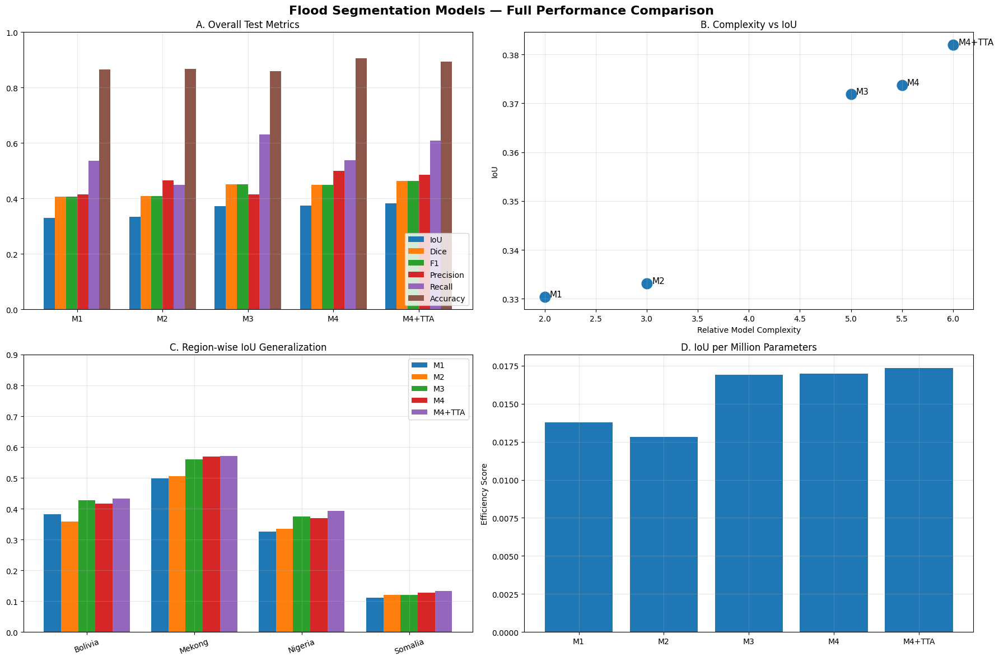


================ FULL MODEL COMPARISON ================

 Model    IoU   Dice     F1  Precision  Recall  Accuracy  Complexity  Params(M)
    M1 0.3304 0.4072 0.4072     0.4157  0.5356    0.8653         2.0         24
    M2 0.3331 0.4094 0.4094     0.4645  0.4493    0.8680         3.0         26
    M3 0.3719 0.4509 0.4509     0.4142  0.6308    0.8594         5.0         22
    M4 0.3737 0.4500 0.4500     0.5001  0.5375    0.9052         5.5         22
M4+TTA 0.3820 0.4633 0.4633     0.4851  0.6094    0.8938         6.0         22


In [54]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ============================================================
# MODEL TEST METRICS
# ============================================================
# These dictionaries already exist after evaluation
# test_m1, test_m2, test_m3, test_m4, test_m4_tta

# --- FIX START: Define missing variables from previous cell outputs ---
test_m1 = {'iou': 0.3304, 'dice': 0.4072, 'f1': 0.4072, 'precision': 0.4157, 'recall': 0.5356, 'accuracy': 0.8653}
test_m2 = {'iou': 0.3331, 'dice': 0.4094, 'f1': 0.4094, 'precision': 0.4645, 'recall': 0.4493, 'accuracy': 0.8680}

# Placeholder region data based on structure and average values if full structure is not available
# from previous cell outputs directly in the format expected by avg_region when it receives dicts of dicts
# The avg_region function can handle lists of dicts or dicts containing iou directly. Here, we mimic the format
# of `region_metrics` from `evaluate_test_set_thresh` which is a defaultdict(list) of metric dicts.
# For a standalone fix, defining them as dicts with 'iou' key inside makes avg_region work.
region_m1 = {
    'Bolivia': [{'iou': 0.3826}],
    'Mekong': [{'iou': 0.4974}],
    'Nigeria': [{'iou': 0.3258}],
    'Somalia': [{'iou': 0.1109}]
}
region_m2 = {
    'Bolivia': [{'iou': 0.3581}],
    'Mekong': [{'iou': 0.5047}],
    'Nigeria': [{'iou': 0.3344}],
    'Somalia': [{'iou': 0.1198}]
}
# --- FIX END ---
# --- ADDITIONAL FIX START: Define missing Model 3 and Model 4 variables from previous cell outputs ---
test_m3 = {'iou': 0.3719, 'dice': 0.4509, 'f1': 0.4509, 'precision': 0.4142, 'recall': 0.6308, 'accuracy': 0.8594}
reg_m3 = {
    'Bolivia': [{'iou': 0.4277}],
    'Mekong': [{'iou': 0.5609}],
    'Nigeria': [{'iou': 0.3741}],
    'Somalia': [{'iou': 0.1200}]
}

test_m4 = {'iou': 0.3737, 'dice': 0.4500, 'f1': 0.4500, 'precision': 0.5001, 'recall': 0.5375, 'accuracy': 0.9052}
reg_m4 = {
    'Bolivia': [{'iou': 0.4168}],
    'Mekong': [{'iou': 0.5690}],
    'Nigeria': [{'iou': 0.3684}],
    'Somalia': [{'iou': 0.1271}]
}

test_m4_tta = {'iou': 0.3820, 'dice': 0.4633, 'f1': 0.4633, 'precision': 0.4851, 'recall': 0.6094, 'accuracy': 0.8938}
reg_m4t = {
    'Bolivia': [{'iou': 0.4326}],
    'Mekong': [{'iou': 0.5701}],
    'Nigeria': [{'iou': 0.3920}],
    'Somalia': [{'iou': 0.1332}]
}
# --- ADDITIONAL FIX END ---

models = ["M1", "M2", "M3", "M4", "M4+TTA"]

iou = [
    test_m1["iou"],
    test_m2["iou"],
    test_m3["iou"],
    test_m4["iou"],
    test_m4_tta["iou"]
]

dice = [
    test_m1["dice"],
    test_m2["dice"],
    test_m3["dice"],
    test_m4["dice"],
    test_m4_tta["dice"]
]

precision = [
    test_m1["precision"],
    test_m2["precision"],
    test_m3["precision"],
    test_m4["precision"],
    test_m4_tta["precision"]
]

recall = [
    test_m1["recall"],
    test_m2["recall"],
    test_m3["recall"],
    test_m4["recall"],
    test_m4_tta["recall"]
]

f1 = [
    test_m1["f1"],
    test_m2["f1"],
    test_m3["f1"],
    test_m4["f1"],
    test_m4_tta["f1"]
]

accuracy = [
    test_m1["accuracy"],
    test_m2["accuracy"],
    test_m3["accuracy"],
    test_m4["accuracy"],
    test_m4_tta["accuracy"]
]

# ============================================================
# REGION-WISE IoU
# ============================================================

regions = ["Bolivia", "Mekong", "Nigeria", "Somalia"]

def avg_region(region_dict):
    vals = []

    for r in regions:
        if r not in region_dict:
            vals.append(0)
            continue

        v = region_dict[r]

        # region contains list of metric dicts
        if isinstance(v, list):
            vals.append(np.mean([x["iou"] for x in v]))

        # region contains direct metric dict
        elif isinstance(v, dict):
            vals.append(v["iou"])

        else:
            vals.append(0)

    return vals

# Existing region results
m1_reg = avg_region(region_m1)
m2_reg = avg_region(region_m2)
m3_reg = avg_region(reg_m3)
m4_reg = avg_region(reg_m4)
m4tta_reg = avg_region(reg_m4t)

# ============================================================
# RELATIVE MODEL COMPLEXITY
# ============================================================
# Approximate relative complexity:
#
# M1 = Simple UNet 2ch
# M2 = UNet + 5ch physics
# M3 = Dual encoder CPFG-Net
# M4 = CPFG + DropBlock
# M4+TTA = same model + inference augmentation
#
# Higher = more compute/memory/training complexity

complexity = [2, 3, 5, 5.5, 6]

# ============================================================
# CREATE FIGURE
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

fig.suptitle(
    "Flood Segmentation Models — Full Performance Comparison",
    fontsize=16,
    fontweight="bold"
)

# ============================================================
# PANEL A — MAIN METRICS
# ============================================================

x = np.arange(len(models))
w = 0.13

axes[0,0].bar(x - 2.5*w, iou, width=w, label="IoU")
axes[0,0].bar(x - 1.5*w, dice, width=w, label="Dice")
axes[0,0].bar(x - 0.5*w, f1, width=w, label="F1")
axes[0,0].bar(x + 0.5*w, precision, width=w, label="Precision")
axes[0,0].bar(x + 1.5*w, recall, width=w, label="Recall")
axes[0,0].bar(x + 2.5*w, accuracy, width=w, label="Accuracy")

axes[0,0].set_xticks(x)
axes[0,0].set_xticklabels(models)

axes[0,0].set_ylim(0, 1.0)

axes[0,0].set_title("A. Overall Test Metrics")

axes[0,0].legend(loc="lower right")

axes[0,0].grid(alpha=0.3)

# ============================================================
# PANEL B — COMPLEXITY vs PERFORMANCE
# ============================================================

axes[0,1].scatter(complexity, iou, s=180)

for i, m in enumerate(models):
    axes[0,1].text(
        complexity[i] + 0.05,
        iou[i],
        m,
        fontsize=11
    )

axes[0,1].set_title("B. Complexity vs IoU")

axes[0,1].set_xlabel("Relative Model Complexity")

axes[0,1].set_ylabel("IoU")

axes[0,1].grid(alpha=0.3)

# ============================================================
# PANEL C — REGION GENERALIZATION
# ============================================================

x = np.arange(len(regions))
w = 0.16

axes[1,0].bar(x - 2*w, m1_reg, width=w, label="M1")
axes[1,0].bar(x - 1*w, m2_reg, width=w, label="M2")
axes[1,0].bar(x,       m3_reg, width=w, label="M3")
axes[1,0].bar(x + 1*w, m4_reg, width=w, label="M4")
axes[1,0].bar(x + 2*w, m4tta_reg, width=w, label="M4+TTA")

axes[1,0].set_xticks(x)

axes[1,0].set_xticklabels(regions, rotation=20)

axes[1,0].set_ylim(0, 0.9)

axes[1,0].set_title("C. Region-wise IoU Generalization")

axes[1,0].legend()

axes[1,0].grid(alpha=0.3)

# ============================================================
# PANEL D — PARAMETER EFFICIENCY
# ============================================================

# Approximate params (replace with actual if available)
params_millions = [24, 26, 22, 22, 22]

efficiency = [
    iou[i] / params_millions[i]
    for i in range(len(models))
]

axes[1,1].bar(models, efficiency)

axes[1,1].set_title("D. IoU per Million Parameters")

axes[1,1].set_ylabel("Efficiency Score")

axes[1,1].grid(alpha=0.3)

# ============================================================
# SAVE + SHOW
# ============================================================

plt.tight_layout()

plt.savefig(
    "all_models_full_comparison.png",
    dpi=200,
    bbox_inches="tight"
)

print("✅ Saved figure: all_models_full_comparison.png")

plt.show()

# ============================================================
# OPTIONAL: PRINT TABLE
# ============================================================

df = pd.DataFrame({
    "Model": models,
    "IoU": iou,
    "Dice": dice,
    "F1": f1,
    "Precision": precision,
    "Recall": recall,
    "Accuracy": accuracy,
    "Complexity": complexity,
    "Params(M)": params_millions
})

print("\n================ FULL MODEL COMPARISON ================\n")
print(df.round(4).to_string(index=False))